* test saving and loading of model ok
* make a function to automate training/resuming training of a model, and saving at the end of iterations. Offer possibility to cut training short and save. ok
* make argparse, with convenient default parameters. ok
* or make ini file from which to load ok
* integrate evaluations to training loop. 
* upload pictures to neptune. specify hash of parameters in uploaded parameters in neptune
* Also specify noising schedule in parameters
* change from a_t as input to a_t as conditioning

* test on cluster, save on scratch. Then, ready to automate training of numerous versions.

# Setup experiments

In [ ]:
import os
import DDLM.manage.Experiments as Exp

# check if some experiments have failede
#exp_range = 10
#for i in range(exp_range - 1):
#    tmp = Exp.Experiment.get_parameters_from_dir('models/L1_' + str(i)+'/sas_grid')
#    if len(tmp) != 5:
#        print(i, len(tmp))
#        for t in tmp:
#            print(t['diffusion']['alpha'], t['diffusion']['LIM'], t['training']['lploss'])
# check if some experiments have failed
datasets = ['mnist', 'cifar10']
L = []
for d in datasets:
    for exp in ['paper_0', 'paper_5_5_0', 'paper_lim_0', 'paper_non_iso_0']:
        L.append(str(os.path.join('models', '_'.join((d, exp)), d)))
for l in L:
    tmp = Exp.Experiment.get_parameters_from_dir(l)
    print(l, len(tmp))
    for t in tmp:
        print(t['diffusion']['alpha'], t['diffusion']['LIM'], t['training']['lploss'])

In [10]:
import numpy as np
import torch
from IPython.display import HTML
from IPython.display import display
import os
import yaml
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider, Button, RadioButtons
import PDMP.manage.Experiments as Exp
import PDMP.manage.Logger as Logger
import PDMP.manage.Manager as Manager
import PDMP.manage.Generate as Gen
import pandas as pd
from pathlib import Path
from PDMP.datasets import is_image_dataset

%matplotlib inline
import copy

# add dic parameters to list of dataframes
def aux(dic, 
        dfs, 
        manage_list = False,
        exp_number = None):
    for param, val in dic.items():
        if not isinstance(val, dict):
            #if param != 'weights':
            #param = '_'.join((param, str(exp_number))) if exp_number is not None else param
            for df in dfs:
                if exp_number is not None:
                    df['exp_number'] = exp_number
                if manage_list:
                    df[param] = [val] * df.shape[0]
                else:
                    try:
                        df[param] = val
                    except:
                        raise Exception('Error. Do we have the same number of evaluation metrics for every parameters? Try to load dataframe with ema_only=True')
        else:
            aux(dic[param], dfs, manage_list)

# do not load these keys in eval df
eval_df_load_keys_to_remove = ['fig', 'losses', 'losses_batch']

def load_dataframe(experiment_folder, 
                   dataset,
                   exp_range = None,
                   do_not_load_model = False,
                   do_not_load_data = False,
                   ema_only=False, # only load emas. Can specify a list of mus
                   load_last_value = False,
                   load_eval_subdirs=False, # will only look in eval subdirectories
                    ):
    
    eval_df_load_keys_to_remove_tmp = eval_df_load_keys_to_remove
    if is_image_dataset(dataset):
        # drop support for wasserstein metric in the case of images
        eval_df_load_keys_to_remove_tmp += ['wass']

    if exp_range is None:
        exp_folders = [experiment_folder]
    else:
        exp_folders = ['_'.join([experiment_folder, str(i)]) for i in exp_range]


    data_eval = pd.DataFrame(data = {})
    data_losses = pd.DataFrame(data = {})
    data_models = pd.DataFrame(data = {})
    
    # iterate over each experiment folders.
    for exp_number, folder in zip(exp_range, exp_folders):
        # load all the different evaluations for each run stored in the experiment folder.
        if load_eval_subdirs:
            # if loading subdirectories containing evaluations with multiple parameters for the same trained model
            paths = np.concatenate([list(Path(os.path.join(folder, dataset)).glob('new_eval_*')) for folder in exp_folders])
        else:
            # else just load eval associated with the run in the same dir
            paths = [os.path.join(folder, dataset) for folder in exp_folders]
        print(paths)

        for path in paths:
            # might have mutliple evaluations in the same subdir
            list_p = Exp.Experiment.get_parameters_from_dir(path)
            for p in list_p:
                #list_p = [Exp.Experiment.get_parameters_from_dir(path) for path in paths]        
                #list_p = [Exp.Experiment.get_parameters_from_dir(os.path.join(folder, dataset)) for folder in exp_folders]

                exp = Exp.Experiment(folder, p, logger = None)
                # do not remove eval files, by setting data_to_generate to zero
                print('do not remove eval files, by setting data_to_generate to zero')
                tmp = exp.p['eval']['data_to_generate']
                exp.p['eval']['data_to_generate'] = 0
                #load_eval_subdir=is_image_dataset(exp.p['data']['dataset'])
                #print('loading from eval subdir:', load_eval_subdir)
                exp.load(do_not_load_model = do_not_load_model,do_not_load_data=do_not_load_data)#, load_eval_subdir=load_eval_subdir)
                exp.p['eval']['data_to_generate'] = tmp
                
                #print('alpha', exp.p['diffusion']['alpha'])
                #print('LIM', exp.p['diffusion']['LIM'])
                #print('iso noise', exp.p['diffusion']['isotropic'])
                #print('ddim', exp.p['eval']['ddim'])
                #print('reduce_timesteps', exp.p['eval']['reduce_timesteps'])

                df = pd.DataFrame(data={})
                df_losses = pd.DataFrame(data={})
                df_models = pd.DataFrame(data={})

                exp_number=exp_number if exp_range is not None else None

                first_index = -1 if load_last_value else 0

                # evaluation parameters
                if (not isinstance(ema_only, list)) or (not ema_only):
                    aux({k: v[first_index:] for k, v in exp.manager.eval.evals.items() if not k in eval_df_load_keys_to_remove_tmp},
                        [df], exp_number=exp_number)

                # ema eval
                if exp.manager.ema_objects is not None:
                    for ema_object in exp.manager.ema_objects:
                        mu = ema_object['model'].mu
                        evals = ema_object['eval'].evals
                        if isinstance(ema_only, list) and not mu in ema_only:
                            continue
                        tmp = {'_'.join(('ema', str(mu), str(k))): v[first_index:] for k, v in evals.items() if not k in eval_df_load_keys_to_remove_tmp}
                        print('full_ema_eval', evals)
                        print('ema_evals', {'_'.join(('ema', str(mu), str(k))): v for k, v in evals.items() if not k in eval_df_load_keys_to_remove_tmp})
                        print('ema_evals', tmp)
                        aux(tmp, [df], exp_number=exp_number)
                
                # check if evals have been done. Else fill with zero
                if df.shape[0] == 0:
                    df.loc[0] = 0

                # assign an eval index to each run
                df['eval_index'] = list(range(df.shape[0]))

                # losses
                aux({k: v[first_index:] for k, v in exp.manager.eval.evals.items() if k in ['losses']},
                    [df_losses], exp_number=exp_number)
                df_losses['loss_index'] = list(range(df_losses.shape[0]))

                # model parameters
                aux({'experiment': [exp]}, [df_models],  
                    exp_number=exp_number) # we want to regroup by model parameters

                # experiment parameters
                # since diffusion/isotropic exists
                if not is_image_dataset(p['data']['dataset']):
                    p['data']['data_isotropic'] = p['data']['isotropic']
                    del p['data']['isotropic']
                aux(p, [df, df_losses, df_models], manage_list = True, 
                    exp_number=exp_number) # we want to regroup by experiment parameters

                data_eval = pd.concat([data_eval, df])
                data_losses = pd.concat([data_losses, df_losses])
                data_models = pd.concat([data_models, df_models])

    return data_eval.reset_index(drop=True), data_losses.reset_index(drop=True), data_models.reset_index(drop=True)

def aggregate_dataframes(df_eval, df_losses, df_models, agg_list, ema_only=False):
    exp = df_models.iloc[0]['experiment']
    dataset = exp.p['data']['dataset']

    eval_df_load_keys_to_remove_tmp = eval_df_load_keys_to_remove
    if is_image_dataset(dataset):
        # drop support for wasserstein metric in the case of images
        eval_df_load_keys_to_remove_tmp += ['wass']
    
    #p_for_agg = {}
    #aux(exp.p, [p_for_agg], manage_list=False)
    # ema eval
    ema_eval_keys = []
    if exp.manager.ema_objects is not None:
        for ema_object in exp.manager.ema_objects:
            mu = ema_object['model'].mu
            evals = ema_object['eval'].evals
            if isinstance(ema_only, list) and not mu in ema_only:
                continue
            ema_eval_keys += ['_'.join(('ema', str(mu), str(k))) for k in evals.keys() if not k in eval_df_load_keys_to_remove_tmp] #['losses', 'losses_batch', 'fig']]
    #p_for_agg = [k for k in p_for_agg.keys() if k != 'weights']

    eval_keys = ema_eval_keys
    if (not isinstance(ema_only, list)) or (not ema_only):
        eval_keys += list(exp.manager.eval.evals.keys())
    dict_for_agg_eval = {k: ['mean', 'median', 'std'] for k in eval_keys if not k in eval_df_load_keys_to_remove_tmp}
    dict_for_agg_losses = {'losses': ['mean', 'median', 'std']}

    #dict_for_agg_eval.update({k:['mean', 'median', 'std'] for k in ema_eval_keys}) #{'exp_number': 'last'})
    
    dict_for_agg_eval.update({k:'last' for k in list(df_eval.columns) if not k in eval_keys}) #{'exp_number': 'last'})
    dict_for_agg_losses.update({k:'last' for k in list(df_losses.columns) if not k in (eval_keys + list(exp.manager.eval.evals.keys()))}) #{'exp_number': 'last'})

    res_eval = df_eval.groupby(agg_list + ['eval_index']).agg(dict_for_agg_eval).reset_index()
    res_losses = df_losses.groupby(agg_list + ['loss_index']).agg(dict_for_agg_losses).reset_index()
    def col_name(x):
        if (x[-1] == 'last'):
            return x[0]
        return '_'.join(x).strip()
    res_eval.columns = [col_name(col) for col in res_eval.columns.values]
    res_losses.columns = [col_name(col) for col in res_losses.columns.values]

    return res_eval.fillna(0), res_losses.fillna(0)


def display(data_eval, 
            first_param, 
            second_param, 
            metric,
            metric_and_std = False, # if each metric contains a dataframe with mean and std
            agg_type = None, #None if a single value, else mean or median
            xlim = None, ylim = None,
           log_scale = False,
           rolling_average = None):
    first_list = list(reversed(sorted(data_eval[first_param].unique())))
    second_list = list(reversed(sorted(data_eval[second_param].unique())))
    for f in first_list:
        data = data_eval[data_eval[first_param] == f]
        for s in second_list:
            eval_freq = np.array(data[data[second_param] == s]['eval_freq'])
            eval_epoch = np.cumsum(eval_freq)
            if agg_type is not None:
                metric_data_mean = np.array(data[data[second_param] == s]['_'.join((metric, agg_type))])
                metric_data_std = np.array(data[data[second_param] == s]['_'.join((metric, 'std'))])
                if rolling_average is not None:
                    metric_data_mean = np.convolve(metric_data_mean, np.ones(rolling_average)/rolling_average, mode='valid')
                    metric_data_std = np.convolve(metric_data_std, np.ones(rolling_average)/rolling_average, mode='valid')
                    eval_epoch = eval_epoch[rolling_average-1:]
                plt.plot(eval_epoch, metric_data_mean, label= second_param + ' = ' + str(s))
                if metric_and_std:
                    plt.fill_between(eval_epoch, 
                                 metric_data_mean+metric_data_std, 
                                 metric_data_mean-metric_data_std,
                                 alpha = 0.3)
            else:
                metric_data = np.array(data[data[second_param] == s][metric])
                if rolling_average is not None:
                    metric_data = np.convolve(metric_data, np.ones(rolling_average)/rolling_average, mode='valid')
                    eval_epoch = eval_epoch[rolling_average-1:]
                plt.plot(eval_epoch, metric_data, label= second_param + ' = ' + str(s))
            plt.legend()
            plt.title(metric + ' - ' + first_param + ' = ' + str(f))
            if xlim is not None:
                plt.xlim(xlim)
            if ylim is not None:
                plt.ylim(ylim)
        if log_scale:
            plt.yscale('log')
        plt.show()

def get_table_metric(some_df, keys, metric, rolling_average = 3, max = True, agg_type = 'mean', get_last_value = False):
    assert agg_type in ['mean', 'median']
    metric_agg = '_'.join((metric, agg_type))
    metric_std = '_'.join((metric, 'std'))
    df = some_df[[keys[0], keys[1], metric_agg,metric_std]]
    if get_last_value:
        tmp_last = df.groupby(keys).last().reset_index()
        tmp_last = pd.pivot_table(tmp_last, values=[metric_agg, metric_std], index=keys[0],
                        columns=[keys[1]], aggfunc="min")
        return tmp_last
    tmp_max = df.groupby(keys).rolling(window=rolling_average, min_periods=1).max().reset_index(level=0).groupby(keys).max().reset_index()
    tmp_min = df.groupby(keys).rolling(window=rolling_average, min_periods=1).min().reset_index(level=0).groupby(keys).min().reset_index()
    tmp_max = tmp_max.sort_values(keys)
    tmp_min = tmp_min.sort_values(keys)
    if max:
        tmp = tmp_max
    else: 
        tmp = tmp_min
    tmp[metric_std] = tmp_min[metric_std] # always take the min of this value
    tmp_1 = pd.pivot_table(tmp, values=[metric_agg, metric_std], index=keys[0],
                        columns=[keys[1]], aggfunc="min")
    return tmp_1

def display_bins_metric(some_df, keys, metric, rolling_average = 3, max = True, agg_type = 'mean'):
    assert agg_type in ['mean', 'median']
    metric_agg = '_'.join((metric, agg_type))
    metric_std = '_'.join((metric, 'std'))
    tmp_1 = get_table_metric(some_df, keys, metric, rolling_average, max, agg_type = agg_type)
    tmp_1.plot(kind = 'bar', y = metric_agg, yerr=metric_std)
    plt.ylabel(metric_agg)
    plt.title('Experiment Result')
    plt.show()
    
    

def generate_samples(df, 
                    condition, 
                    num_samples = 32, 
                    ddim = False,
                    eta = 0., # used only if ddim
                    reduce_timesteps = 1., # divide by reduce_timesteps
                    new_time_spacing = None, # linear or quadratic
                    print_progression=True, 
                    use_samples = None,
                    get_sample_history = False,
                    clip_denoised = False,
                    is_image = True):
    gen_model = Gen.GenerationManager(df[condition]['experiment'].iloc[0].manager.model, 
                                      df[condition]['experiment'].iloc[0].manager.diffusion, 
                                      df[condition]['experiment'].iloc[0].manager.data,
                                      is_image=is_image)
    gen_model.generate(num_samples,
                 ddim = ddim,
                 eta = eta, # used only if ddim
                 reduce_timesteps = reduce_timesteps, # divide by reduce_timesteps
                 new_time_spacing = new_time_spacing, # linear or quadratic
                 print_progression=print_progression, 
                 use_samples = use_samples,
                 get_sample_history = get_sample_history,
                 clip_denoised = clip_denoised)
    return gen_model

# Experimenting with LIM noise implementation and ours

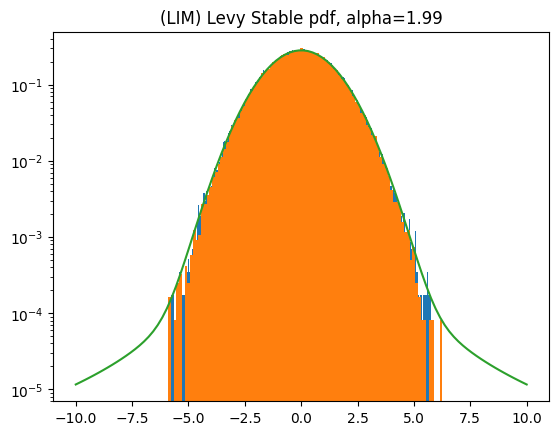

In [201]:
from DDLM.LIM.torchlevy import LevyStable
import numpy as np
import scipy

levy = LevyStable()
alpha = 1.99
tmp_1 = levy.sample(alpha=alpha, size=(100000), is_isotropic=True)
tmp_2 = levy.sample(alpha=alpha, size=(100000), is_isotropic=True, clamp=None)
tmp = (tmp_1 + tmp_2) / (2**(1 / alpha))
plt.hist(tmp_1, density=True, bins = 200)
plt.hist(tmp, density=True, bins = 100)
plt.plot(np.linspace(-10, 10, 100), scipy.stats.levy_stable.pdf(np.linspace(-10, 10, 100), alpha, beta=0))
plt.yscale('log')
plt.title('(LIM) Levy Stable pdf, alpha=' + str(alpha))
plt.show()

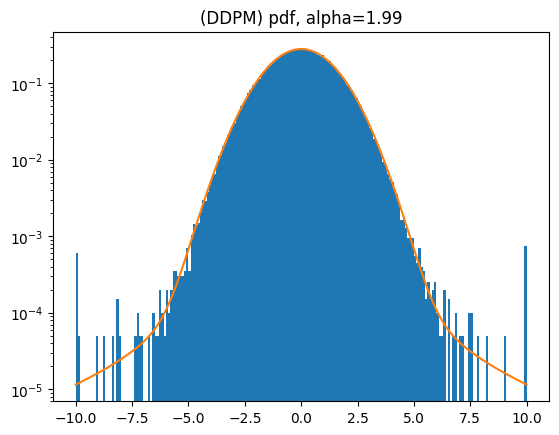

In [197]:
import DDLM.levy_utils.Data as Data

alpha = 1.99
get_eps = Data.Generator('sas',
                        alpha = alpha,
                        device = 'cpu',
                        isotropic=True,
                        clamp_eps = None)
tmp_1 = get_eps.generate(size = (200000,))
#tmp_2 = get_eps.generate(size = (200000,))
#tmp = (tmp_1 + tmp_2) / (2**(1 / alpha))
tmp_1 = tmp_1.clamp(-10, 10)
#tmp = tmp.clamp(-10, 10)
plt.hist(tmp_1, density=True, bins = 200)
#plt.hist(tmp, density=True, bins = 100)
plt.plot(np.linspace(-10, 10, 100), scipy.stats.levy_stable.pdf(np.linspace(-10, 10, 100), alpha, beta=0))
plt.yscale('log')
plt.title('(DDPM) pdf, alpha=' + str(alpha))
plt.show()

# LIM vs $\alpha$-DDPM

* Load ALL the data. We have:
    * isotropic: 1_1, 5_5, 1_1_L1, 5_5_L1, LIM
    * non_isotropic: 1_1, LIM

In [21]:
from pathlib import Path

# load all available dataframes for a list of datasets
# ema_only: False means load everything
# true means only load ema
# give a list to load only certain emas. e.g [0.9999]
def load_all_dataframes_2d(datasets, ema_only, load_eval_subdirs, num_exp = 10):
    if isinstance(datasets, str):
        # make it a singleton
        datasets = [datasets]
    data_eval, data_losses, data_models = pd.DataFrame(data = {}), pd.DataFrame(data = {}), pd.DataFrame(data = {})

    all_2d_files_to_load = list(set(Path('./models/').glob('experiment_[0-{}]'.format(num_exp-1))))

    for path in all_2d_files_to_load:
        for dataset in datasets:
            print(path, dataset)
            if str.isdigit(str(path)[-1]):
                # get the last character of the path, should be the experiment number
                exp_range = [int(str(path)[-1])]
            else:
                exp_range = None
            tmp_eval, tmp_losses, tmp_models = load_dataframe(
                str(path)[:-2], # remove the last '_[0-9]' characters
                dataset,
                do_not_load_model=True,
                do_not_load_data=True,
                ema_only = ema_only,
                exp_range=exp_range,
                load_eval_subdirs=load_eval_subdirs)
            #for d in [tmp_eval, tmp_losses, tmp_models]:
            #    d['monte_carlo_param'] = [tuple((x, y)) for x, y in zip(d['monte_carlo_steps'], d['monte_carlo_groups'])]
            data_eval = pd.concat([data_eval, tmp_eval])
            data_losses = pd.concat([data_losses, tmp_losses])
            data_models = pd.concat([data_models, tmp_models])
    #return data_eval.reset_index(drop=True), data_losses.reset_index(drop=True), data_models.reset_index(drop=True)
    return data_eval, data_losses, data_models

def get_exp_name(noising_process, sampler, reverse_steps):
        if noising_process == 'pdmp':
            return '_'.join([noising_process, sampler, str(reverse_steps)])
        else:
            return '_'.join([noising_process, str(reverse_steps)])

def set_exp_name_dataframe(df):
    df['exp_name'] = [get_exp_name(a, b, c) 
                    for a, b, c
                    in zip( 
                        df['noising_process'], 
                        df['sampler'],
                        df['reverse_steps'],
                        )
                    ]

def get_latex_table(res_eval, metric, last_value=False, max=False):
    keys = ['exp_name', 'alpha'][::-1]
    if last_value:
        tmp = get_table_metric(res_eval, keys, metric, agg_type='median', get_last_value=True)
    else:
        tmp = get_table_metric(res_eval, keys, metric, rolling_average=3, max=max, agg_type='median')
    # Create the combined DataFrame
    df = tmp['{}_median'.format(metric)].applymap(lambda x: f"{x:.3f}").astype(str) + ' ± ' + tmp['{}_std'.format(metric)].applymap(lambda x: f"{x:.3f}").astype(str)
    print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))

In [16]:
#data_eval_sas, data_losses_sas, data_models_sas = load_all_dataframes_2d(['sas_grid'], ema_only = False, num_exp=10)
data_eval_gmm, data_losses_gmm, data_models_gmm = load_all_dataframes_2d(['gmm_grid'], ema_only = False, load_eval_subdirs=False, num_exp=10)

models/experiment_9 gmm_grid
['models/experiment_9/gmm_grid']
using device mps
do not remove eval files, by setting data_to_generate to zero
(prepare data directories) assuming no data will be generated.
using device mps
do not remove eval files, by setting data_to_generate to zero
(prepare data directories) assuming no data will be generated.
using device mps
do not remove eval files, by setting data_to_generate to zero
(prepare data directories) assuming no data will be generated.
using device mps
do not remove eval files, by setting data_to_generate to zero
(prepare data directories) assuming no data will be generated.
models/experiment_4 gmm_grid
['models/experiment_4/gmm_grid']
using device mps
do not remove eval files, by setting data_to_generate to zero
(prepare data directories) assuming no data will be generated.
using device mps
do not remove eval files, by setting data_to_generate to zero
(prepare data directories) assuming no data will be generated.
using device mps
do not 

In [22]:
#for df in [data_eval_sas, data_losses_sas, data_models_sas]:
#    set_exp_name_dataframe(df)

for df in [data_eval_gmm, data_losses_gmm, data_models_gmm]:
    set_exp_name_dataframe(df)

In [23]:
data_eval_gmm

,exp_number,wass,precision,recall,density,coverage,f_1_pr,f_1_dc,fid,eval_index,...,warmup,lr_steps,lr_step_size,lr_gamma,epochs,eval_freq,checkpoint_freq,progress,device,exp_name
0,9,0.056169,0.795097,0.950448,0.0,0.0,0.865860,0.0,0.0,0,...,0,300000,400,0.99,300,50,50,True,mps,pdmp_HMC_100
1,9,0.050860,0.824867,0.960158,0.0,0.0,0.887385,0.0,0.0,1,...,0,300000,400,0.99,300,50,50,True,mps,pdmp_HMC_100
2,9,0.069872,0.827239,0.962755,0.0,0.0,0.889867,0.0,0.0,2,...,0,300000,400,0.99,300,50,50,True,mps,pdmp_HMC_100
3,9,0.054980,0.815133,0.966360,0.0,0.0,0.884328,0.0,0.0,3,...,0,300000,400,0.99,300,50,50,True,mps,pdmp_HMC_100
4,9,0.043590,0.845866,0.964073,0.0,0.0,0.901109,0.0,0.0,4,...,0,300000,400,0.99,300,50,50,True,mps,pdmp_HMC_100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19,6,0.046538,0.837514,0.970520,0.0,0.0,0.899124,0.0,0.0,1,...,0,300000,400,0.99,300,50,50,True,mps,pdmp_BPS_100
20,6,0.069284,0.809238,0.958184,0.0,0.0,0.877435,0.0,0.0,2,...,0,300000,400,0.99,300,50,50,True,mps,pdmp_BPS_100
21,6,0.038896,0.852539,0.970317,0.0,0.0,0.907623,0.0,0.0,3,...,0,300000,400,0.99,300,50,50,True,mps,pdmp_BPS_100
22,6,0.092057,0.829691,0.957397,0.0,0.0,0.888981,0.0,0.0,4,...,0,300000,400,0.99,300,50,50,True,mps,pdmp_BPS_100


In [24]:
#res_eval_sas, res_losses_sas = aggregate_dataframes(data_eval_sas, data_losses_sas, data_models_sas, agg_list=['alpha', 'exp_name'])
res_eval_gmm, res_losses_gmm = aggregate_dataframes(data_eval_gmm, data_losses_gmm, data_models_gmm, agg_list=['noising_process', 'exp_name'])

In [25]:
#res_eval_sas['exp_name'].unique(), res_eval_gmm['exp_name'].unique()
res_eval_gmm['exp_name'].unique()

array(['diffusion_100', 'pdmp_BPS_100', 'pdmp_HMC_100', 'pdmp_ZigZag_100'],
      dtype=object)

## Look at all the results

In [42]:
import torch 
from pathlib import Path

paths = list(Path('./models/2d_iso_1/gmm_grid').glob('eval*.pt'))

for p in paths:
    tmp = torch.load(p)
    print(tmp['eval']['wass'][-1])

0.03183676504438344
0.05647525936443737
0.09034774882520508
0.03936995958705221
0.027364778409916347
0.06929120682580983
0.09527541558626335
0.07322812483191712


In [44]:
#tmp = copy.deepcopy(res_eval_sas)
#tmp['wass_median'] = np.log(tmp['wass_median'])
get_latex_table(res_eval_sas, metric='f_1_pr',  max=True) #last_value=True)

\begin{table}[htbp]
\centering
\begin{tabular}{llllllllll}
\toprule
exp\_name & DDPM\_iso\_on\_iso\_L1 & DDPM\_iso\_on\_iso\_L1\_5\_5 & DDPM\_iso\_on\_iso\_L2 & DDPM\_iso\_on\_iso\_L2\_5\_5 & DDPM\_iso\_on\_non\_iso\_L2 & DDPM\_non\_iso\_on\_iso\_L2 & DDPM\_non\_iso\_on\_non\_iso\_L2 & SDE\_iso\_on\_iso\_L1 & SDE\_iso\_on\_non\_iso\_L1 \\
alpha &                    &                        &                    &                        &                        &                        &                            &                   &                       \\
\midrule
1.70  &      0.834 ± 0.016 &          0.841 ± 0.020 &      0.876 ± 0.025 &          0.879 ± 0.022 &          0.858 ± 0.019 &          0.851 ± 0.033 &              0.849 ± 0.018 &     0.866 ± 0.012 &         0.851 ± 0.025 \\
1.80  &      0.857 ± 0.035 &          0.862 ± 0.029 &      0.858 ± 0.028 &          0.877 ± 0.023 &          0.874 ± 0.025 &          0.872 ± 0.027 &              0.875 ± 0.013 &     0.843 ± 0.016 &    

/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_90929/3659892250.py:75: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))


In [56]:
get_latex_table(res_eval_gmm, metric='wass', max=False) #last_value=True)

\begin{table}[htbp]
\centering
\begin{tabular}{llllllll}
\toprule
exp\_name &    DDPM\_iso\_L1 & DDPM\_iso\_L1\_5\_5 &    DDPM\_iso\_L2 & DDPM\_iso\_L2\_5\_5 & DDPM\_non\_iso\_L2 &     SDE\_iso\_L1 & SDE\_non\_iso\_L1 \\
alpha &                &                 &                &                 &                 &                &                \\
\midrule
1.70  &  0.026 ± 0.001 &   0.018 ± 0.000 &  0.035 ± 0.007 &   0.018 ± 0.000 &   0.039 ± 0.005 &  0.031 ± 0.010 &  0.030 ± 0.002 \\
1.80  &  0.040 ± 0.010 &   0.038 ± 0.018 &  0.026 ± 0.006 &   0.025 ± 0.010 &   0.048 ± 0.018 &  0.030 ± 0.010 &  0.056 ± 0.019 \\
1.90  &  0.026 ± 0.011 &   0.031 ± 0.011 &  0.045 ± 0.016 &   0.033 ± 0.010 &   0.023 ± 0.010 &  0.044 ± 0.017 &  0.039 ± 0.011 \\
1.99  &  0.037 ± 0.016 &   0.043 ± 0.014 &  0.042 ± 0.019 &   0.042 ± 0.015 &   0.056 ± 0.017 &  0.033 ± 0.021 &  0.048 ± 0.010 \\
2.00  &  0.040 ± 0.016 &   0.046 ± 0.017 &  0.032 ± 0.010 &   0.047 ± 0.016 &   0.035 ± 0.014 &  0.042 ± 0.015 &  0

/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_64660/3549599947.py:73: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))


In [46]:
get_latex_table(res_eval_sas, metric='f_1_pr')

\begin{table}[htbp]
\centering
\begin{tabular}{llllllll}
\toprule
exp\_name &    DDPM\_iso\_L1 & DDPM\_iso\_L1\_5\_5 &    DDPM\_iso\_L2 & DDPM\_iso\_L2\_5\_5 & DDPM\_non\_iso\_L2 &     SDE\_iso\_L1 & SDE\_non\_iso\_L1 \\
alpha &                &                 &                &                 &                 &                &                \\
\midrule
1.70  &  0.839 ± 0.028 &   0.895 ± 0.028 &  0.876 ± 0.028 &   0.894 ± 0.021 &   0.891 ± 0.015 &  0.803 ± 0.037 &  0.819 ± 0.029 \\
1.80  &  0.870 ± 0.035 &   0.877 ± 0.026 &  0.892 ± 0.027 &   0.904 ± 0.030 &   0.906 ± 0.025 &  0.798 ± 0.033 &  0.792 ± 0.027 \\
1.90  &  0.869 ± 0.025 &   0.873 ± 0.033 &  0.893 ± 0.021 &   0.897 ± 0.028 &   0.909 ± 0.023 &  0.825 ± 0.026 &  0.815 ± 0.034 \\
1.99  &  0.876 ± 0.028 &   0.870 ± 0.024 &  0.892 ± 0.029 &   0.897 ± 0.024 &   0.913 ± 0.035 &  0.814 ± 0.029 &  0.815 ± 0.030 \\
2.00  &  0.880 ± 0.032 &   0.886 ± 0.025 &  0.889 ± 0.027 &   0.884 ± 0.021 &   0.896 ± 0.010 &  0.833 ± 0.037 &  0

/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_47478/4286560987.py:66: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))


In [19]:
get_latex_table(res_eval_gmm, metric='f_1_pr')

\begin{table}[htbp]
\centering
\begin{tabular}{llllllll}
\toprule
exp\_name &    DDPM\_iso\_L1 & DDPM\_iso\_L1\_5\_5 &    DDPM\_iso\_L2 & DDPM\_iso\_L2\_5\_5 & DDPM\_non\_iso\_L2 &     SDE\_iso\_L1 & SDE\_non\_iso\_L1 \\
alpha &                &                 &                &                 &                 &                &                \\
\midrule
2.0   &  0.593 ± 0.021 &   0.611 ± 0.042 &  0.601 ± 0.026 &   0.600 ± 0.024 &   0.656 ± 0.041 &  0.622 ± 0.041 &  0.617 ± 0.027 \\
\bottomrule
\end{tabular}
\end{table}



/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_88935/26013166.py:66: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))


## some graphs

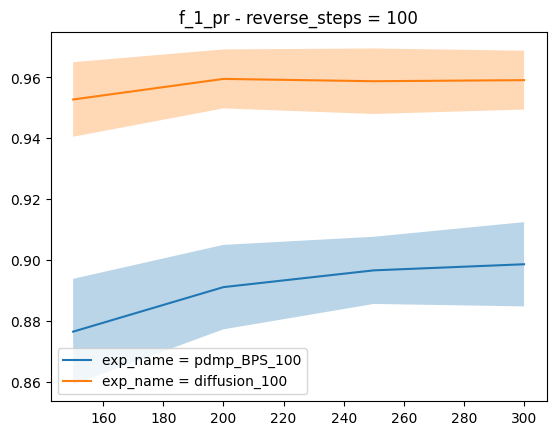

In [32]:
display(res_eval_gmm[~res_eval_gmm['sampler'].isin(['ZigZag', 'HMC'])], 
        'reverse_steps', 'exp_name', 'f_1_pr', metric_and_std = True, agg_type = 'mean', log_scale=False, rolling_average=3)

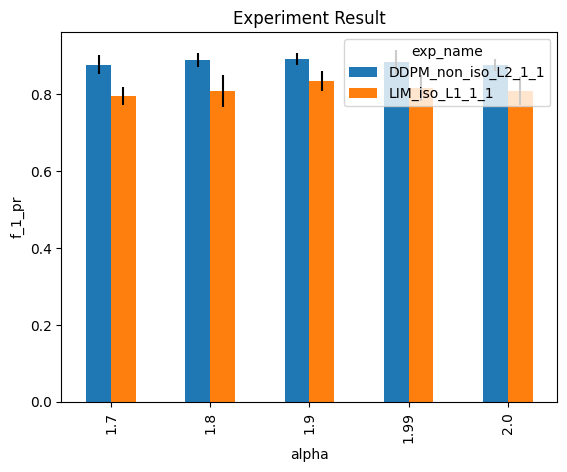

In [251]:
display_bins_metric(res_eval_iso_non_iso, keys, metric, rolling_average=3, max=True)

### Some generation

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 140.94it/s]


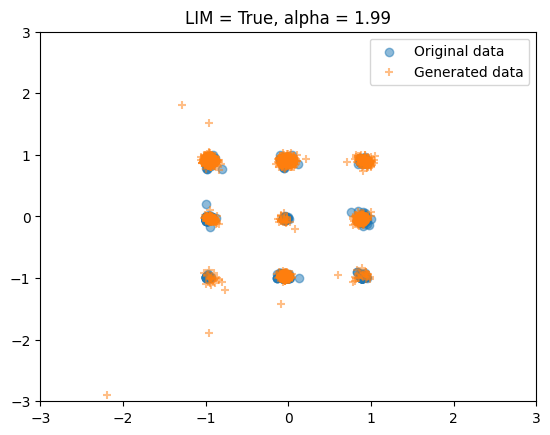

In [13]:
lims = 3
LIM = True
alpha = 1.99
gen_model = generate_samples(data_models, 
                             (data_models['LIM'] == LIM) & (data_models['alpha'] == alpha), 
                             num_samples=2000,
                             ddim = False,
                             eta=1.,
                            is_image = False)
gen_model.get_plot(xlim = (-lims, lims), ylim = (-lims, lims), title='LIM = {}, alpha = {}'.format(LIM, alpha))

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 99/100 [00:00<00:00, 128.25it/s]


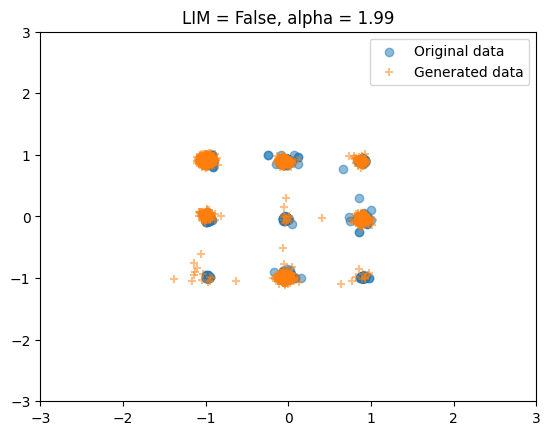

In [14]:
lims = 3
LIM = False
alpha = 1.99
gen_model = generate_samples(data_models, 
                             (data_models['LIM'] == LIM) & (data_models['alpha'] == alpha), 
                             num_samples=2000,
                             ddim = False,
                             eta=1.,
                            is_image = False)
gen_model.get_plot(xlim = (-lims, lims), ylim = (-lims, lims), title='LIM = {}, alpha = {}'.format(LIM, alpha))

  0%|                                                                                                                                     | 0/100 [00:00<?, ?it/s]

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 167.03it/s]


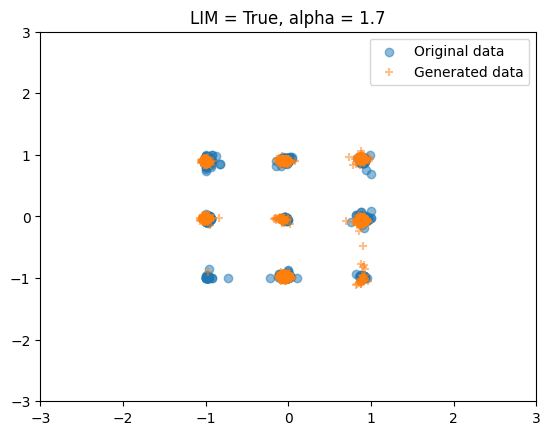

In [15]:
lims = 3
LIM = True
alpha = 1.7
gen_model = generate_samples(data_models, 
                             (data_models['LIM'] == LIM) & (data_models['alpha'] == alpha), 
                             num_samples=2000,
                             ddim = False,
                             eta=1.,
                            is_image = False)
gen_model.get_plot(xlim = (-lims, lims), ylim = (-lims, lims), title='LIM = {}, alpha = {}'.format(LIM, alpha))

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 99/100 [00:00<00:00, 146.60it/s]


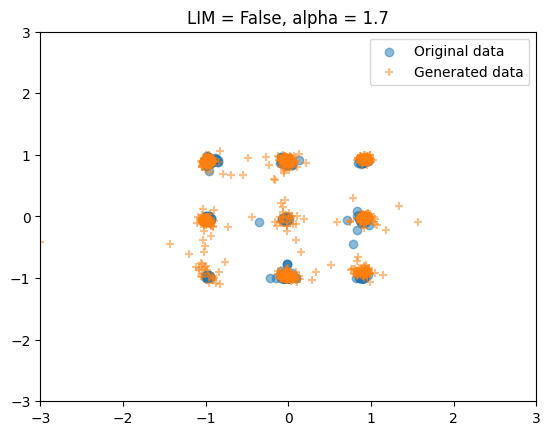

In [18]:
lims = 3
LIM = False
alpha = 1.7
gen_model = generate_samples(data_models, 
                             (data_models['LIM'] == LIM) & (data_models['alpha'] == alpha), 
                             num_samples=2000,
                             ddim = False,
                             eta=1.,
                            is_image = False)
gen_model.get_plot(xlim = (-lims, lims), ylim = (-lims, lims), title='LIM = {}, alpha = {}'.format(LIM, alpha))

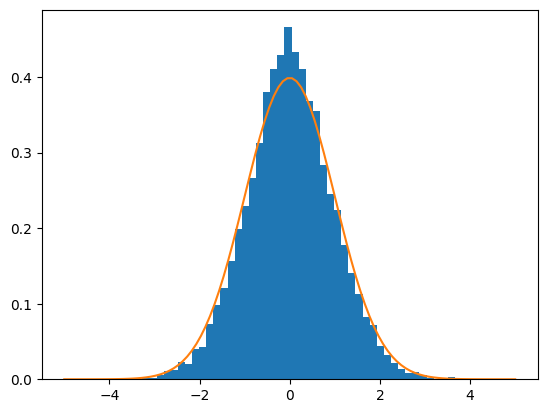

In [82]:
import DDLM.levy_utils.torchlevy.levy as levy
import scipy.stats as stats 

Levy = levy.LevyStable()
tmp = Levy.sample(alpha = 2, beta = 0, size = (10000)) / np.sqrt(2)
plt.hist(tmp, density = True, bins = 50)
plt.plot(np.linspace(-5, 5, 100), stats.norm.pdf(np.linspace(-5, 5, 100)))
plt.show()

In [92]:
Levy = levy.LevyStable()
tmp = Levy.sample(alpha = 1., beta = 1,size = (10))
tmp

tensor([ 2.2289e-01, -1.0945e+00,  2.9585e-01,  8.0764e+00, -7.2879e-03,
         2.7231e+00,  2.7353e+00,  1.2837e+00,  3.4345e+00,  1.6621e+00])

### some clustering

In [347]:
from sklearn.cluster import KMeans


def approx_class_imbalance_grid(kmeans, gen_model, n_runs, n_samples = 2000):
    # classifiy with initial data
    # generate new data, predict, compare number of labels

    L = []
    for i in range(n_runs):
        gen_model.generate(n_samples, print_progression = False)
        pred = kmeans.predict(gen_model.samples.squeeze(1))
        pred_weights = np.bincount(pred) / n_samples
        L.append((pred_weights))

    '''def aux(samples):
        kmeans = KMeans(n_clusters=9, random_state=0, init='k-means++', n_init = 1)
        kmeans.fit(samples)
        labels = kmeans.labels_
        counts = np.bincount(labels)
        total_points = samples.size()[0]
        weights = (counts / total_points)
        weights.sort()
        return weights
    L = []
    for i in range(n_runs):
        gen_model.generate(n_samples, print_progression = False)
        L.append(aux(gen_model.samples))'''
    return np.array(L)

def class_imbalance_table_grid(n_runs = 10, n_samples = 10000):
    gen_model = Gen.GenerationManager(data_models['experiment'].iloc[0].manager.model, 
                                      data_models['experiment'].iloc[0].manager.diffusion, 
                                      data_models['experiment'].iloc[0].manager.data,
                                      is_image=False)
    table = pd.DataFrame(data = {})
    kmeans = KMeans(n_clusters=9, random_state=0, init='k-means++', n_init = 1)
    some_data = gen_model.load_original_data(n_samples)
    kmeans.fit(some_data.squeeze(1))
    true_weights = np.bincount(kmeans.labels_) / len(some_data)
    print(true_weights)
    for l in data_eval['LIM'].unique():
        for a in data_eval['alpha'].unique():
            print(l, a)
            cond = (data_models['LIM'] == l) & (data_models['alpha'] == a)
            gen_model = Gen.GenerationManager(data_models[cond]['experiment'].iloc[0].manager.model,
                                              data_models[cond]['experiment'].iloc[0].manager.diffusion,
                                              data_models[cond]['experiment'].iloc[0].manager.data,
                                             is_image=False)
            L = approx_class_imbalance_grid(kmeans, gen_model, n_runs)
            m, s = np.mean(L, axis = 0), np.std(L, axis = 0)
            
            df = pd.DataFrame(data = {})
            df['LIM'] = [l]
            df['alpha'] = [a]
            tmp = np.array(data_models['weights'][0])
            tmp.sort()
            df['true_weights'] = [tmp]
            df['gen_mixture_weights'] = [m]
            df['std'] = [s]
            table = pd.concat([table, df])
    return table.reset_index(drop=True)

In [348]:
tmp = class_imbalance_table_grid(n_runs = 5, n_samples = 10000)

[0.3003 0.1492 0.2032 0.1488 0.0986 0.0496 0.0213 0.0197 0.0093]
False 2.0
[[0.416, 0.1145, 0.1825, 0.184, 0.046, 0.038, 0.0015, 0.016, 0.0015], [0.442, 0.114, 0.1935, 0.1445, 0.0475, 0.0435, 0.0, 0.0125, 0.0025], [0.395, 0.119, 0.208, 0.1615, 0.053, 0.047, 0.0, 0.0165], [0.4215, 0.126, 0.18, 0.172, 0.0445, 0.0365, 0.0015, 0.0155, 0.0025], [0.4245, 0.114, 0.196, 0.1605, 0.0435, 0.044, 0.0005, 0.0145, 0.0025]]


ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (5,) + inhomogeneous part.

In [34]:
def compute_norm(row):
    return np.linalg.norm(np.log(row['true_weights']) - np.log(row['gen_mixture_weights']), ord = 2) / row['true_weights'].size
    #return np.linalg.norm(row['true_weights'] / row['gen_mixture_weights'] - 1, ord = 2)


def compute_norm_1(row):
    return np.linalg.norm(np.log(row['true_weights']) - np.log(row['gen_mixture_weights']), ord = 1)/ row['true_weights'].size

tmp['dist'] = tmp.apply(compute_norm, axis = 1)
tmp['dist_L1'] = tmp.apply(compute_norm_1, axis = 1)


/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_46227/1016580699.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  tmp_2 = tmp.pivot('alpha', 'LIM', 'dist')
/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_46227/1016580699.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  tmp_1 = tmp.pivot('alpha', 'LIM', 'dist_L1')


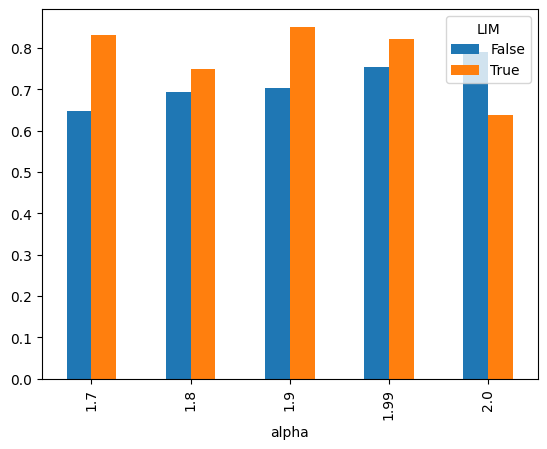

In [35]:
tmp = tmp.sort_values(['LIM', 'alpha'])
tmp_2 = tmp.pivot('alpha', 'LIM', 'dist')
tmp_1 = tmp.pivot('alpha', 'LIM', 'dist_L1')
tmp_2.plot(kind = 'bar')
#tmp_1.plot(kind = 'bar')
plt.show()

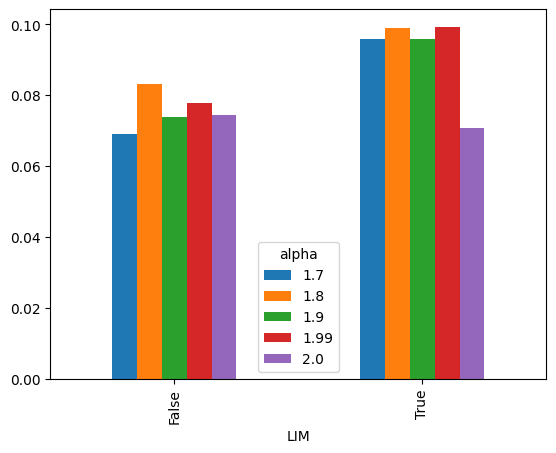

In [102]:
tmp_3 = tmp_2 / 9
tmp_3.plot(kind = 'bar')
#tmp_1.plot(kind = 'bar')
plt.show()

$$ \sum_{i = 1}^9 | \log \dfrac{\mathrm{true_i}}{\mathrm{estimated_i}}| $$

/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_46227/2158578666.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  tmp_2 = tmp.pivot('LIM', 'alpha', 'dist')
/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_46227/2158578666.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  tmp_1 = tmp.pivot('LIM', 'alpha', 'dist_L1')


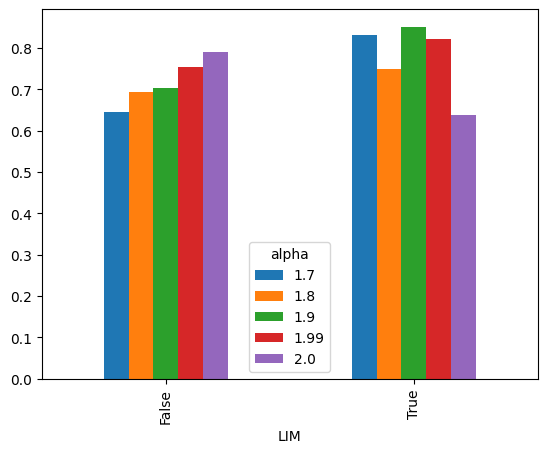

In [36]:
tmp = tmp.sort_values(['LIM', 'alpha'])
tmp_2 = tmp.pivot('LIM', 'alpha', 'dist')
tmp_1 = tmp.pivot('LIM', 'alpha', 'dist_L1')
tmp_2.plot(kind = 'bar')
#tmp_1.plot(kind = 'bar')
plt.show()

## Iso

In [59]:
# median of means
# compare LIM vs 1_1 vs 5_5
exp_name_tmp = [
    get_exp_name(1, 1, LIM=False, iso=True, lploss=2.),
    get_exp_name(1, 1, LIM=True, iso=True, lploss=1.)
]
res_eval_tmp, res_losses_tmp = res_eval_sas[res_eval_sas['exp_name'].isin(exp_name_tmp)], res_losses_sas[res_losses_sas['exp_name'].isin(exp_name_tmp)]

In [60]:
get_latex_table(res_eval_tmp, metric='f_1_pr')

\begin{table}[htbp]
\centering
\begin{tabular}{lll}
\toprule
exp\_name &    DDPM\_iso\_L2 &     SDE\_iso\_L1 \\
alpha &                &                \\
\midrule
1.70  &  0.876 ± 0.028 &  0.803 ± 0.037 \\
1.80  &  0.892 ± 0.027 &  0.798 ± 0.033 \\
1.90  &  0.893 ± 0.021 &  0.825 ± 0.026 \\
1.99  &  0.892 ± 0.029 &  0.814 ± 0.029 \\
2.00  &  0.889 ± 0.027 &  0.833 ± 0.037 \\
\bottomrule
\end{tabular}
\end{table}



/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_47478/4286560987.py:66: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))


## L1 vs L2 loss, median of means

In [55]:
# median of means
# compare LIM vs 1_1 vs 5_5
exp_name_tmp = [
    get_exp_name(1, 1, LIM=False, iso=True, lploss=1.),
    get_exp_name(5, 5, LIM=False, iso=True, lploss=1.),
    get_exp_name(1, 1, LIM=False, iso=True, lploss=2.),
    get_exp_name(5, 5, LIM=False, iso=True, lploss=2.),
]
res_eval_tmp, res_losses_tmp = res_eval_sas[res_eval_sas['exp_name'].isin(exp_name_tmp)], res_losses_sas[res_losses_sas['exp_name'].isin(exp_name_tmp)]

In [56]:
get_latex_table(res_eval_tmp, metric='f_1_pr')

\begin{table}[htbp]
\centering
\begin{tabular}{lllll}
\toprule
exp\_name &    DDPM\_iso\_L1 & DDPM\_iso\_L1\_5\_5 &    DDPM\_iso\_L2 & DDPM\_iso\_L2\_5\_5 \\
alpha &                &                 &                &                 \\
\midrule
1.70  &  0.839 ± 0.028 &   0.895 ± 0.028 &  0.876 ± 0.028 &   0.894 ± 0.021 \\
1.80  &  0.870 ± 0.035 &   0.877 ± 0.026 &  0.892 ± 0.027 &   0.904 ± 0.030 \\
1.90  &  0.869 ± 0.025 &   0.873 ± 0.033 &  0.893 ± 0.021 &   0.897 ± 0.028 \\
1.99  &  0.876 ± 0.028 &   0.870 ± 0.024 &  0.892 ± 0.029 &   0.897 ± 0.024 \\
2.00  &  0.880 ± 0.032 &   0.886 ± 0.025 &  0.889 ± 0.027 &   0.884 ± 0.021 \\
\bottomrule
\end{tabular}
\end{table}



/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_47478/4286560987.py:66: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))


# Image Datasets

In [2]:
from pathlib import Path


# get all paths for a dataset, and the ddim paths, clip and no_clip paths.
# for the moment, our evaluation process does not update the parameter files accordingly, so we need to update them here
def update_parameter_files(dataset):
    str_all_paths = 'paper*'
    str_ddim = 'paper*ddim*'
    str_clip = 'paper*clip*'

    all_paths = list(Path('./models/').glob(str_all_paths))
    path_ddim = list(Path('./models/').glob(str_ddim))
    path_clip = list(Path('./models/').glob(str_clip))
    path_no_clip = list((set(all_paths) - set(path_ddim)) - set(path_clip))
    path_no_ddim = list((set(all_paths) - set(path_ddim)))

    # for evaluation made with ddim, update parameters
    for p in path_ddim:
        print('(ddim) updating: {}'.format(p))
        for path in p.glob('./{}/parameters*'.format(dataset)):
            tmp = torch.load(path)
            tmp['eval']['ddim'] = True
            tmp['eval']['eval_eta'] = 0.
            tmp['eval']['reduce_timesteps'] = 20.
            tmp['eval']['clip_denoised'] = False
            torch.save(tmp, path)
    
    # for evaluation made without ddim, update parameters
    for p in path_no_ddim:
        print('(ddpm) updating: {}'.format(p))
        for path in p.glob('./{}/parameters*'.format(dataset)):
            tmp = torch.load(path)
            tmp['eval']['ddim'] = False
            tmp['eval']['eval_eta'] = 1.
            tmp['eval']['reduce_timesteps'] = 1.
            #tmp['eval']['clip_denoised'] = False
            torch.save(tmp, path)

    # for evaluation made with clip_denoised, update parameters
    for p in path_clip:
        print('(clip) updating: {}'.format(p))
        for path in p.glob('./{}/parameters*'.format(dataset)):
            tmp = torch.load(path)
            tmp['eval']['clip_denoised'] = True
            torch.save(tmp, path)

    # for evaluation made without clip_denoised (all the others), update parameters
    for p in path_no_clip:
        print('(no clip) updating: {}'.format(p))
        for path in p.glob('./{}/parameters*'.format(dataset)):
            tmp = torch.load(path)
            tmp['eval']['clip_denoised'] = False
            torch.save(tmp, path)

# load all available dataframes for a list of datasets
# ema_only: False means load everything
# true means only load ema
# give a list to load only certain emas. e.g [0.9999]
def load_all_dataframes(datasets, ema_only, load_last_value=True, load_eval_subdirs=False):
    if isinstance(datasets, str):
        # make it a singleton
        datasets = [datasets]
    data_eval, data_losses, data_models = pd.DataFrame(data = {}), pd.DataFrame(data = {}), pd.DataFrame(data = {})
    for dataset in datasets:
        for path in Path('./models/').glob('paper_*'.format(dataset)):
            print(str(path))
            if str.isdigit(str(path)[-1]):
                # get the last character of the path, should be the experiment number
                exp_range = [int(str(path)[-1])]
            else:
                exp_range = None
            tmp_eval, tmp_losses, tmp_models = load_dataframe(
                str(path)[:-2], # remove the last '_[0-9]' characters
                dataset,
                do_not_load_model=True,
                do_not_load_data=True,
                ema_only = ema_only,
                exp_range = exp_range,
                load_last_value=load_last_value,
                load_eval_subdirs=load_eval_subdirs)
            
            data_eval = pd.concat([data_eval, tmp_eval])
            data_losses = pd.concat([data_losses, tmp_losses])
            data_models = pd.concat([data_models, tmp_models])
    #return data_eval.reset_index(drop=True), data_losses.reset_index(drop=True), data_models.reset_index(drop=True)
    return data_eval, data_losses, data_models

def get_exp_name(mc_steps, mc_groups, LIM, iso, lploss, ddim, clip):
        if LIM:
            method = 'ODE' if ddim else 'SDE'
        else:
            method = 'DDIM' if ddim else 'DDPM'
        iso = 'iso' if iso == True else 'non_iso'
        lploss = 'L1' if  lploss == 1. else 'L2'
        clip = 'clip' if clip == True else 'no_clip'
        if mc_steps == 1 and mc_groups == 1:
            # do not include mc params
            return '_'.join([method, iso, clip, lploss])
        return '_'.join([method, iso, clip, lploss, str(mc_steps), str(mc_groups)])

def set_exp_name_dataframe(df):
    df['exp_name'] = [get_exp_name(a, b, c, d, e, f, g) 
                    for a, b, c, d, e, f, g 
                    in zip( 
                        df['monte_carlo_steps'], 
                        df['monte_carlo_groups'], 
                        df['LIM'],
                        df['isotropic'],
                        df['lploss'],
                        df['ddim'],
                        df['clip_denoised']
                        )
                    ]

def get_latex_table(res_eval, metric, last_value=True, max=False, include_std_metric=False):
    keys = ['exp_name', 'alpha'][::-1]
    if last_value:
        tmp = get_table_metric(res_eval, keys, metric, agg_type='median', get_last_value=True)
    else:
        tmp = get_table_metric(res_eval, keys, metric, rolling_average=3, max=max, agg_type='median')
    # Create the combined DataFrame
    if include_std_metric:
        df = tmp['{}_median'.format(metric)].applymap(lambda x: f"{x:.3f}").astype(str) + ' ± ' + tmp['{}_std'.format(metric)].applymap(lambda x: f"{x:.3f}").astype(str)
    else:
        df = tmp['{}_median'.format(metric)].applymap(lambda x: f"{x:.3f}").astype(str)
    print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))

# MNIST

In [9]:
update_parameter_files('mnist')

(ddim) updating: models/paper_lim_ddim_20_0
(ddim) updating: models/paper_ddim_20_0
(ddim) updating: models/paper_lim_ddim_50_1
(ddim) updating: models/paper_ddim_50_1
(ddpm) updating: models/paper_clip_0
(ddpm) updating: models/paper_lim_1
(ddpm) updating: models/paper_0
(ddpm) updating: models/paper_non_iso_0
(ddpm) updating: models/paper_5_5_0
(ddpm) updating: models/paper_1
(ddpm) updating: models/paper_lim_0
(clip) updating: models/paper_clip_0
(no clip) updating: models/paper_lim_1
(no clip) updating: models/paper_0
(no clip) updating: models/paper_non_iso_0
(no clip) updating: models/paper_5_5_0
(no clip) updating: models/paper_1
(no clip) updating: models/paper_lim_0


In [3]:
data_eval_mnist, data_losses_mnist, data_models_mnist = load_all_dataframes(datasets = 'mnist', ema_only=[0.99], load_eval_subdirs=True)

models/paper_lim_1
[PosixPath('models/paper_lim_1/mnist/new_eval_62e472b8bbd1bfaa_1a346257')
 PosixPath('models/paper_lim_1/mnist/new_eval_18072f39634f4fed_1a346257')
 PosixPath('models/paper_lim_1/mnist/new_eval_e23a9e474f8473ea_1a346257')
 PosixPath('models/paper_lim_1/mnist/new_eval_0f3b29db026a6255_8f871864')
 PosixPath('models/paper_lim_1/mnist/new_eval_a822047a53b4a64c_8f871864')
 PosixPath('models/paper_lim_1/mnist/new_eval_a822047a53b4a64c_1a346257')
 PosixPath('models/paper_lim_1/mnist/new_eval_18072f39634f4fed_8f871864')
 PosixPath('models/paper_lim_1/mnist/new_eval_0f3b29db026a6255_1a346257')
 PosixPath('models/paper_lim_1/mnist/new_eval_62e472b8bbd1bfaa_8f871864')
 PosixPath('models/paper_lim_1/mnist/new_eval_e23a9e474f8473ea_8f871864')]
GPU device not found.
using device cpu
do not remove eval files, by setting data_to_generate to zero


NameError: name 'load_new_eval' is not defined

In [12]:
for i in range(len(data_models_mnist)):
    exp = data_models_mnist.iloc[i]['experiment']
    tmp = exp.p['eval']['data_to_generate']
    exp.p['eval']['data_to_generate'] = 0
    exp.load(do_not_load_model = True,
             do_not_load_data = True)
    exp.p['eval']['data_to_generate'] = tmp
    exp.manager.eval.evals['fig'] = []
    for ema_eval in exp.manager.ema_evals:
        ema_eval[0].evals['fig'] = []
    tmp = exp.save(files=['eval', 'param'], save_new_eval=True, curr_epoch=None)
    print('Saved ', tmp)


found eval_files/mnist/original_data
Saved  (None, 'models/paper_lim_1/mnist/new_eval_e23a9e474f8473ea_8f871864/eval_e23a9e474f8473ea_8f871864.pt', 'models/paper_lim_1/mnist/new_eval_e23a9e474f8473ea_8f871864/parameters_e23a9e474f8473ea_8f871864.pt')
found eval_files/mnist/original_data
Saved  (None, 'models/paper_lim_1/mnist/new_eval_a822047a53b4a64c_8f871864/eval_a822047a53b4a64c_8f871864.pt', 'models/paper_lim_1/mnist/new_eval_a822047a53b4a64c_8f871864/parameters_a822047a53b4a64c_8f871864.pt')
found eval_files/mnist/original_data
Saved  (None, 'models/paper_lim_1/mnist/new_eval_62e472b8bbd1bfaa_8f871864/eval_62e472b8bbd1bfaa_8f871864.pt', 'models/paper_lim_1/mnist/new_eval_62e472b8bbd1bfaa_8f871864/parameters_62e472b8bbd1bfaa_8f871864.pt')
found eval_files/mnist/original_data
Saved  (None, 'models/paper_lim_1/mnist/new_eval_0f3b29db026a6255_8f871864/eval_0f3b29db026a6255_8f871864.pt', 'models/paper_lim_1/mnist/new_eval_0f3b29db026a6255_8f871864/parameters_0f3b29db026a6255_8f871864.p

In [35]:
for df in [data_eval_mnist, data_losses_mnist, data_models_mnist]:
    set_exp_name_dataframe(df)

In [36]:
data_eval_mnist

,exp_number,ema_0.99_precision,ema_0.99_recall,ema_0.99_density,ema_0.99_coverage,ema_0.99_f_1_pr,ema_0.99_f_1_dc,ema_0.99_fid,eval_index,seed,...,lr_steps,optimizer,schedule,warmup,epochs,eval_freq,checkpoint_freq,progress,device,exp_name
0,1,0.700195,0.698500,0.409912,0.465100,0.699347,0.435766,10.976004,0,None,...,300000,adamw,None,0,200,None,25,True,cpu,ODE_iso_no_clip_L1
1,1,0.672607,0.692000,0.398535,0.455000,0.682166,0.424900,11.474939,0,None,...,300000,adamw,None,0,200,None,25,True,cpu,ODE_iso_no_clip_L1
2,1,0.785400,0.836200,0.606445,0.608800,0.810004,0.607620,8.199152,0,None,...,300000,adamw,None,0,200,None,25,True,cpu,ODE_iso_no_clip_L1
3,1,0.752930,0.815400,0.551025,0.581900,0.782921,0.566042,10.378097,0,None,...,300000,adamw,None,0,200,None,25,True,cpu,SDE_iso_no_clip_L1
4,1,0.819580,0.838800,0.682129,0.649800,0.829079,0.665572,5.996662,0,None,...,300000,adamw,None,0,200,None,25,True,cpu,SDE_iso_no_clip_L1
5,1,0.819580,0.838800,0.682129,0.649800,0.829079,0.665572,5.996662,0,None,...,300000,adamw,None,0,200,None,25,True,cpu,ODE_iso_no_clip_L1
6,1,0.672607,0.692000,0.398535,0.455000,0.682166,0.424900,11.474939,0,None,...,300000,adamw,None,0,200,None,25,True,cpu,SDE_iso_no_clip_L1
7,1,0.752930,0.815400,0.551025,0.581900,0.782921,0.566042,10.378097,0,None,...,300000,adamw,None,0,200,None,25,True,cpu,ODE_iso_no_clip_L1
8,1,0.700195,0.698500,0.409912,0.465100,0.699347,0.435766,10.976004,0,None,...,300000,adamw,None,0,200,None,25,True,cpu,SDE_iso_no_clip_L1
9,1,0.785400,0.836200,0.606445,0.608800,0.810004,0.607620,8.199152,0,None,...,300000,adamw,None,0,200,None,25,True,cpu,SDE_iso_no_clip_L1


In [37]:
res_eval_mnist, res_losses_mnist = aggregate_dataframes(data_eval_mnist, data_losses_mnist, data_models_mnist, agg_list=['alpha', 'exp_name'], ema_only=[0.99])
res_eval_mnist['exp_name'].unique()

array(['DDIM_iso_no_clip_L2', 'DDPM_iso_clip_L2', 'DDPM_iso_no_clip_L2',
       'DDPM_iso_no_clip_L2_5_5', 'DDPM_non_iso_no_clip_L2',
       'ODE_iso_no_clip_L1', 'SDE_iso_no_clip_L1'], dtype=object)

In [71]:
res_eval_mnist, res_losses_mnist = aggregate_dataframes(data_eval_mnist, data_losses_mnist, data_models_mnist, agg_list=['alpha', 'exp_name'], ema_only=[0.99])
res_eval_mnist['exp_name'].unique()

array(['DDIM_iso_no_clip_L2', 'DDPM_iso_clip_L2', 'DDPM_iso_no_clip_L2',
       'DDPM_iso_no_clip_L2_5_5', 'DDPM_non_iso_no_clip_L2',
       'ODE_iso_no_clip_L1', 'SDE_iso_no_clip_L1'], dtype=object)

In [38]:
keys = ['exp_name', 'alpha'][::-1]

In [39]:
metric = 'ema_0.99_fid'
#metric = 'fid'
get_table_metric(res_eval_mnist, keys, metric, agg_type='mean', get_last_value=True)#rolling_average=1, max=False)

ema_0.99_fid_mean                                       \
exp_name DDIM_iso_no_clip_L2 DDPM_iso_clip_L2 DDPM_iso_no_clip_L2   
alpha                                                               
1.70                8.620655         5.438145            8.620655   
1.80                6.803547         5.274748            6.803547   
1.90                5.721485         4.367028            5.721485   
1.99                5.066208         3.342712            5.066208   
2.00                4.326770         4.232628            4.326770   

                                                                             \
exp_name DDPM_iso_no_clip_L2_5_5 DDPM_non_iso_no_clip_L2 ODE_iso_no_clip_L1   
alpha                                                                         
1.70                    5.358833               62.787894           6.619886   
1.80                   29.459203               40.153254           8.610655   
1.90                   27.878721               31.668657          11.303346   
1.99                    3.049101               28.897058           5.469230   
2.00                         NaN               27.603318          11.098315   

                               ema_0.99_fid_std                   \
exp_name SDE_iso_no_clip_L1 DDIM_iso_no_clip_L2 DDPM_iso_clip_L2   
alpha                                                              
1.70               6.619886            4.500750              0.0   
1.80               8.610655            2.162048              0.0   
1.90              11.303346            1.915492              0.0   
1.99               5.469230            2.437392              0.0   
2.00              11.098315            0.133136              0.0   

                                                                              \
exp_name DDPM_iso_no_clip_L2 DDPM_iso_no_clip_L2_5_5 DDPM_non_iso_no_clip_L2   
alpha                                                                          
1.70                4.500750                     0.0                     0.0   
1.80                2.162048                     0.0                     0.0   
1.90                1.915492                     0.0                     0.0   
1.99                2.437392                     0.0                     0.0   
2.00                0.133136                     NaN                     0.0   

                                                
exp_name ODE_iso_no_clip_L1 SDE_iso_no_clip_L1  
alpha                                           
1.70               2.233420           2.233420  
1.80               2.499541           2.499541  
1.90               0.242670           0.242670  
1.99               0.745900           0.745900  
2.00               0.172975           0.172975

In [73]:
metric = 'ema_0.99_fid'
#metric = 'fid'
get_table_metric(res_eval_mnist, keys, metric, agg_type='mean', get_last_value=True)#rolling_average=1, max=False)

ema_0.99_fid_mean                                       \
exp_name DDIM_iso_no_clip_L2 DDPM_iso_clip_L2 DDPM_iso_no_clip_L2   
alpha                                                               
1.70                5.265542        28.255440            8.620655   
1.80                5.410815         6.291780            6.803547   
1.90                5.910359        28.271592            5.721485   
1.99                9.614533        27.706542            5.066208   
2.00               12.255875        26.882492            4.326770   

                                                                             \
exp_name DDPM_iso_no_clip_L2_5_5 DDPM_non_iso_no_clip_L2 ODE_iso_no_clip_L1   
alpha                                                                         
1.70                    5.358833               62.787894          66.488346   
1.80                   29.459203               40.153254          81.203580   
1.90                   27.878721               31.668657         103.748034   
1.99                    3.049101               28.897058          72.045166   
2.00                         NaN               27.603318          21.029060   

                               ema_0.99_fid_std                   \
exp_name SDE_iso_no_clip_L1 DDIM_iso_no_clip_L2 DDPM_iso_clip_L2   
alpha                                                              
1.70               6.619886            2.509071              0.0   
1.80               8.610655            2.626999              0.0   
1.90              11.303346            3.847626              0.0   
1.99               5.469230            6.463327              0.0   
2.00              11.098315            4.551800              0.0   

                                                                              \
exp_name DDPM_iso_no_clip_L2 DDPM_iso_no_clip_L2_5_5 DDPM_non_iso_no_clip_L2   
alpha                                                                          
1.70                4.500750                     0.0                     0.0   
1.80                2.162048                     0.0                     0.0   
1.90                1.915492                     0.0                     0.0   
1.99                2.437392                     0.0                     0.0   
2.00                0.133136                     NaN                     0.0   

                                                
exp_name ODE_iso_no_clip_L1 SDE_iso_no_clip_L1  
alpha                                           
1.70              39.279089           2.233420  
1.80              41.759151           2.499541  
1.90              38.222084           0.242670  
1.99              12.513755           0.745900  
2.00              14.217168           0.172975

In [47]:
metric = 'ema_0.99_fid'
#metric = 'fid'
get_table_metric(res_eval_mnist, keys, metric, agg_type='mean', get_last_value=True)#rolling_average=1, max=False)

ema_0.99_fid_mean                                        \
exp_name DDIM_iso_no_clip_L2 DDPM_iso_clip_L2 DDPM_iso_clip_L2_5_5   
alpha                                                                
1.70                3.491361        28.255440            28.245346   
1.80                3.553247         6.291780            29.459203   
1.90                3.189677        28.271592            27.878721   
1.99                5.044271        27.706542            27.462842   
2.00                9.037266        26.882492                  NaN   

                                                                         \
exp_name DDPM_iso_no_clip_L2 DDPM_non_iso_no_clip_L2 ODE_iso_no_clip_L1   
alpha                                                                     
1.70                5.438145               62.787894          38.713836   
1.80                5.274748               40.153254          51.675401   
1.90                4.367028               31.668657          76.720940   
1.99                3.342712               28.897058          63.196604   
2.00                4.232628               27.603318          31.082116   

                               ema_0.99_fid_std                   \
exp_name SDE_iso_no_clip_L1 DDIM_iso_no_clip_L2 DDPM_iso_clip_L2   
alpha                                                              
1.70               4.902049                 0.0              0.0   
1.80               7.563613                 0.0              0.0   
1.90              11.498012                 0.0              0.0   
1.99               5.262800                 0.0              0.0   
2.00               9.787861                 0.0              0.0   

                                                                           \
exp_name DDPM_iso_clip_L2_5_5 DDPM_iso_no_clip_L2 DDPM_non_iso_no_clip_L2   
alpha                                                                       
1.70                      0.0                 0.0                     0.0   
1.80                      0.0                 0.0                     0.0   
1.90                      0.0                 0.0                     0.0   
1.99                      0.0                 0.0                     0.0   
2.00                      NaN                 0.0                     0.0   

                                                
exp_name ODE_iso_no_clip_L1 SDE_iso_no_clip_L1  
alpha                                           
1.70                    0.0                0.0  
1.80                    0.0                0.0  
1.90                    0.0                0.0  
1.99                    0.0                0.0  
2.00                    0.0                0.0

In [27]:
metric = 'ema_0.99_fid'
#metric = 'fid'
get_table_metric(res_eval_mnist, keys, metric, agg_type='mean', get_last_value=True)#rolling_average=1, max=False)

ema_0.99_fid_mean                                        \
exp_name DDIM_iso_no_clip_L2 DDPM_iso_clip_L2 DDPM_iso_clip_L2_5_5   
alpha                                                                
1.70                3.491361        28.255440            28.245346   
1.80                3.553247         6.291780            29.459203   
1.90                3.189677        28.271592            27.878721   
1.99                5.044271        27.706542            27.462842   
2.00                9.037266        26.882492                  NaN   

                                                                         \
exp_name DDPM_iso_no_clip_L2 DDPM_non_iso_no_clip_L2 ODE_iso_no_clip_L1   
alpha                                                                     
1.70                5.438145               62.787894          38.713836   
1.80                5.274748               40.153254          51.675401   
1.90                4.367028               31.668657          76.720940   
1.99                3.342712               28.897058          63.196604   
2.00                4.232628               27.603318          31.082116   

                               ema_0.99_fid_std                   \
exp_name SDE_iso_no_clip_L1 DDIM_iso_no_clip_L2 DDPM_iso_clip_L2   
alpha                                                              
1.70               4.902049                 0.0              0.0   
1.80               7.563613                 0.0              0.0   
1.90              11.498012                 0.0              0.0   
1.99               5.262800                 0.0              0.0   
2.00               9.787861                 0.0              0.0   

                                                                           \
exp_name DDPM_iso_clip_L2_5_5 DDPM_iso_no_clip_L2 DDPM_non_iso_no_clip_L2   
alpha                                                                       
1.70                      0.0                 0.0                     0.0   
1.80                      0.0                 0.0                     0.0   
1.90                      0.0                 0.0                     0.0   
1.99                      0.0                 0.0                     0.0   
2.00                      NaN                 0.0                     0.0   

                                                
exp_name ODE_iso_no_clip_L1 SDE_iso_no_clip_L1  
alpha                                           
1.70                    0.0                0.0  
1.80                    0.0                0.0  
1.90                    0.0                0.0  
1.99                    0.0                0.0  
2.00                    0.0                0.0

In [ ]:
metric = 'ema_0.99_fid'
#metric = 'fid'
get_table_metric(res_eval_mnist, keys, metric, agg_type='mean', get_last_value=True)#rolling_average=1, max=False)

ema_0.99_fid_mean                                        \
exp_name DDIM_iso_no_clip_L2 DDPM_iso_clip_L2 DDPM_iso_clip_L2_5_5   
alpha                                                                
1.70               30.787085        28.255440            28.245346   
1.80               32.380944        28.988612            29.459203   
1.90               29.784245        28.271592            27.878721   
1.99               30.951836        27.706542            27.462842   
2.00               32.491580        26.882492                  NaN   

                                                                         \
exp_name DDPM_iso_no_clip_L2 DDPM_non_iso_no_clip_L2 ODE_iso_no_clip_L1   
alpha                                                                     
1.70                     NaN               62.787894          60.039402   
1.80               27.256729               40.153254          72.774148   
1.90                     NaN               31.668657          99.441084   
1.99                     NaN               28.897058          80.844813   
2.00                     NaN               27.603318          31.082116   

                               ema_0.99_fid_std                   \
exp_name SDE_iso_no_clip_L1 DDIM_iso_no_clip_L2 DDPM_iso_clip_L2   
alpha                                                              
1.70              28.817943                 0.0              0.0   
1.80              28.760455                 0.0              0.0   
1.90              31.433172                 0.0              0.0   
1.99              27.765155                 0.0              0.0   
2.00              31.082116                 0.0              0.0   

                                                                           \
exp_name DDPM_iso_clip_L2_5_5 DDPM_iso_no_clip_L2 DDPM_non_iso_no_clip_L2   
alpha                                                                       
1.70                      0.0                 NaN                     0.0   
1.80                      0.0                 0.0                     0.0   
1.90                      0.0                 NaN                     0.0   
1.99                      0.0                 NaN                     0.0   
2.00                      NaN                 NaN                     0.0   

                                                
exp_name ODE_iso_no_clip_L1 SDE_iso_no_clip_L1  
alpha                                           
1.70                    0.0                0.0  
1.80                    0.0                0.0  
1.90                    0.0                0.0  
1.99                    0.0                0.0  
2.00                    0.0                0.0

In [ ]:
metric = 'ema_0.99_f_1_dc'
#metric = 'fid'
get_table_metric(res_eval_mnist, keys, metric, agg_type='mean', get_last_value=True)#rolling_average=1, max=False)

ema_0.99_f_1_dc_mean                                        \
exp_name  DDIM_iso_no_clip_L2 DDPM_iso_clip_L2 DDPM_iso_clip_L2_5_5   
alpha                                                                 
1.70                 0.386370         0.402104             0.390932   
1.80                 0.375587         0.406395             0.390369   
1.90                 0.372049         0.407024             0.417268   
1.99                 0.367548         0.405843             0.412097   
2.00                 0.317580         0.419068                  NaN   

                                                                         \
exp_name DDPM_iso_no_clip_L2 DDPM_non_iso_no_clip_L2 ODE_iso_no_clip_L1   
alpha                                                                     
1.70                     NaN                0.095621           0.080903   
1.80                0.417439                0.240799           0.030686   
1.90                     NaN                0.352094           0.010359   
1.99                     NaN                0.424637           0.025065   
2.00                     NaN                0.419248           0.349267   

                            ema_0.99_f_1_dc_std                   \
exp_name SDE_iso_no_clip_L1 DDIM_iso_no_clip_L2 DDPM_iso_clip_L2   
alpha                                                              
1.70               0.399324                 0.0              0.0   
1.80               0.382654                 0.0              0.0   
1.90               0.312931                 0.0              0.0   
1.99               0.388313                 0.0              0.0   
2.00               0.349267                 0.0              0.0   

                                                                           \
exp_name DDPM_iso_clip_L2_5_5 DDPM_iso_no_clip_L2 DDPM_non_iso_no_clip_L2   
alpha                                                                       
1.70                      0.0                 NaN                     0.0   
1.80                      0.0                 0.0                     0.0   
1.90                      0.0                 NaN                     0.0   
1.99                      0.0                 NaN                     0.0   
2.00                      NaN                 NaN                     0.0   

                                                
exp_name ODE_iso_no_clip_L1 SDE_iso_no_clip_L1  
alpha                                           
1.70                    0.0                0.0  
1.80                    0.0                0.0  
1.90                    0.0                0.0  
1.99                    0.0                0.0  
2.00                    0.0                0.0

## Clip vs no clip

In [35]:
# compare
exp_name_tmp = [
    get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=False, clip=False),
    get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=False, clip=True),
    #get_exp_name(1, 1, LIM=True, iso=True, lploss=1., ddim=False, clip=False),
    #get_exp_name(5, 5, LIM=False, iso=True, lploss=2., ddim=False, clip=False),
    #get_exp_name(1, 1, LIM=False, iso=False, lploss=2., ddim=False, clip=False),
    #get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=True, clip=False),
]

res_eval_tmp, res_losses_tmp = res_eval_mnist[res_eval_mnist['exp_name'].isin(exp_name_tmp)], res_losses_mnist[res_losses_mnist['exp_name'].isin(exp_name_tmp)]

get_latex_table(res_eval_tmp, metric='ema_0.99_fid')

\begin{table}[htbp]
\centering
\begin{tabular}{lll}
\toprule
exp\_name & DDPM\_iso\_clip\_L2 & DDPM\_iso\_no\_clip\_L2 \\
alpha &                  &                     \\
\midrule
1.70  &           28.255 &               5.438 \\
1.80  &            6.292 &               5.275 \\
1.90  &           28.272 &               4.367 \\
1.99  &           27.707 &               3.343 \\
2.00  &           26.882 &               4.233 \\
\bottomrule
\end{tabular}
\end{table}



/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_88935/1477411780.py:118: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))


In [21]:
# compare
exp_name_tmp = [
    get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=False, clip=False),
    get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=False, clip=True),
    #get_exp_name(1, 1, LIM=True, iso=True, lploss=1., ddim=False, clip=False),
    #get_exp_name(5, 5, LIM=False, iso=True, lploss=2., ddim=False, clip=False),
    #get_exp_name(1, 1, LIM=False, iso=False, lploss=2., ddim=False, clip=False),
    #get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=True, clip=False),
]

res_eval_tmp, res_losses_tmp = res_eval_mnist[res_eval_mnist['exp_name'].isin(exp_name_tmp)], res_losses_mnist[res_losses_mnist['exp_name'].isin(exp_name_tmp)]

get_latex_table(res_eval_tmp, metric='ema_0.99_fid')

\begin{table}[htbp]
\centering
\begin{tabular}{lll}
\toprule
exp\_name & DDPM\_iso\_clip\_L2 & DDPM\_iso\_no\_clip\_L2 \\
alpha &                  &                     \\
\midrule
1.70  &           28.255 &                 nan \\
1.80  &           28.989 &              27.257 \\
1.90  &           28.272 &                 nan \\
1.99  &           27.707 &                 nan \\
2.00  &           26.882 &                 nan \\
\bottomrule
\end{tabular}
\end{table}



/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_54771/256859147.py:106: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))


## Median of means

In [54]:
# compare
exp_name_tmp = [
    get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=False, clip=False),
    #get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=False, clip=True),
    #get_exp_name(1, 1, LIM=True, iso=True, lploss=1., ddim=False, clip=False),
    get_exp_name(5, 5, LIM=False, iso=True, lploss=2., ddim=False, clip=True),
    #get_exp_name(1, 1, LIM=False, iso=False, lploss=2., ddim=False, clip=False),
    #get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=True, clip=False),
]

res_eval_tmp, res_losses_tmp = res_eval_mnist[res_eval_mnist['exp_name'].isin(exp_name_tmp)], res_losses_mnist[res_losses_mnist['exp_name'].isin(exp_name_tmp)]

get_latex_table(res_eval_tmp, metric='ema_0.99_fid')

\begin{table}[htbp]
\centering
\begin{tabular}{lll}
\toprule
exp\_name & DDPM\_iso\_clip\_L2\_5\_5 & DDPM\_iso\_no\_clip\_L2 \\
alpha &                      &                     \\
\midrule
1.70  &               28.245 &               5.438 \\
1.80  &               29.459 &               5.275 \\
1.90  &               27.879 &               4.367 \\
1.99  &               27.463 &               3.343 \\
2.00  &                  nan &               4.233 \\
\bottomrule
\end{tabular}
\end{table}



/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_88935/1477411780.py:118: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))


In [26]:
# compare
exp_name_tmp = [
    get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=False, clip=True),
    #get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=False, clip=True),
    #get_exp_name(1, 1, LIM=True, iso=True, lploss=1., ddim=False, clip=False),
    get_exp_name(5, 5, LIM=False, iso=True, lploss=2., ddim=False, clip=True),
    #get_exp_name(1, 1, LIM=False, iso=False, lploss=2., ddim=False, clip=False),
    #get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=True, clip=False),
]

res_eval_tmp, res_losses_tmp = res_eval_mnist[res_eval_mnist['exp_name'].isin(exp_name_tmp)], res_losses_mnist[res_losses_mnist['exp_name'].isin(exp_name_tmp)]

get_latex_table(res_eval_tmp, metric='ema_0.99_fid')

\begin{table}[htbp]
\centering
\begin{tabular}{lll}
\toprule
exp\_name & DDPM\_iso\_clip\_L2 & DDPM\_iso\_clip\_L2\_5\_5 \\
alpha &                  &                      \\
\midrule
1.70  &           28.255 &               28.245 \\
1.80  &           28.989 &               29.459 \\
1.90  &           28.272 &               27.879 \\
1.99  &           27.707 &               27.463 \\
2.00  &           26.882 &                  nan \\
\bottomrule
\end{tabular}
\end{table}



/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_54771/256859147.py:106: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))


## Non-iso

In [38]:
# compare
exp_name_tmp = [
    get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=False, clip=True),
    #get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=False, clip=True),
    #get_exp_name(1, 1, LIM=True, iso=True, lploss=1., ddim=False, clip=False),
    #get_exp_name(5, 5, LIM=False, iso=True, lploss=2., ddim=False, clip=True),
    get_exp_name(1, 1, LIM=False, iso=False, lploss=2., ddim=False, clip=False),
    #get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=True, clip=False),
]

res_eval_tmp, res_losses_tmp = res_eval_mnist[res_eval_mnist['exp_name'].isin(exp_name_tmp)], res_losses_mnist[res_losses_mnist['exp_name'].isin(exp_name_tmp)]

get_latex_table(res_eval_tmp, metric='ema_0.99_fid')

\begin{table}[htbp]
\centering
\begin{tabular}{lll}
\toprule
exp\_name & DDPM\_iso\_clip\_L2 & DDPM\_non\_iso\_no\_clip\_L2 \\
alpha &                  &                         \\
\midrule
1.70  &           28.255 &                  62.788 \\
1.80  &            6.292 &                  40.153 \\
1.90  &           28.272 &                  31.669 \\
1.99  &           27.707 &                  28.897 \\
2.00  &           26.882 &                  27.603 \\
\bottomrule
\end{tabular}
\end{table}



/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_88935/1477411780.py:118: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))


In [23]:
# compare
exp_name_tmp = [
    get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=False, clip=True),
    #get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=False, clip=True),
    #get_exp_name(1, 1, LIM=True, iso=True, lploss=1., ddim=False, clip=False),
    #get_exp_name(5, 5, LIM=False, iso=True, lploss=2., ddim=False, clip=True),
    get_exp_name(1, 1, LIM=False, iso=False, lploss=2., ddim=False, clip=False),
    #get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=True, clip=False),
]

res_eval_tmp, res_losses_tmp = res_eval_mnist[res_eval_mnist['exp_name'].isin(exp_name_tmp)], res_losses_mnist[res_losses_mnist['exp_name'].isin(exp_name_tmp)]

get_latex_table(res_eval_tmp, metric='ema_0.99_fid')

\begin{table}[htbp]
\centering
\begin{tabular}{lll}
\toprule
exp\_name & DDPM\_iso\_clip\_L2 & DDPM\_non\_iso\_no\_clip\_L2 \\
alpha &                  &                         \\
\midrule
1.70  &           28.255 &                  62.788 \\
1.80  &           28.989 &                  40.153 \\
1.90  &           28.272 &                  31.669 \\
1.99  &           27.707 &                  28.897 \\
2.00  &           26.882 &                  27.603 \\
\bottomrule
\end{tabular}
\end{table}



/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_54771/256859147.py:106: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))


## DDPM, DDIM, ODE, SDE

In [18]:
# compare
exp_name_tmp = [
    get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=False, clip=False),
    get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=True, clip=False),
    get_exp_name(1, 1, LIM=True, iso=True, lploss=1., ddim=True, clip=False),
    get_exp_name(1, 1, LIM=True, iso=True, lploss=1., ddim=False, clip=False),
]

res_eval_tmp, res_losses_tmp = res_eval_mnist[res_eval_mnist['exp_name'].isin(exp_name_tmp)], res_losses_mnist[res_losses_mnist['exp_name'].isin(exp_name_tmp)]

get_latex_table(res_eval_tmp, metric='ema_0.99_fid')

\begin{table}[htbp]
\centering
\begin{tabular}{lllll}
\toprule
exp\_name & DDIM\_iso\_no\_clip\_L2 & DDPM\_iso\_no\_clip\_L2 & ODE\_iso\_no\_clip\_L1 & SDE\_iso\_no\_clip\_L1 \\
alpha &                     &                     &                    &                    \\
\midrule
1.70  &               3.491 &              11.803 &             38.714 &              8.199 \\
1.80  &               3.553 &               8.326 &             51.675 &             10.378 \\
1.90  &               3.190 &               6.747 &             76.721 &             11.475 \\
1.99  &               5.044 &               0.000 &             63.197 &              5.997 \\
2.00  &               9.037 &               0.000 &             31.082 &             10.976 \\
\bottomrule
\end{tabular}
\end{table}



/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_42572/1477411780.py:118: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))


In [48]:
# compare
exp_name_tmp = [
    get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=False, clip=False),
    get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=True, clip=False),
    get_exp_name(1, 1, LIM=True, iso=True, lploss=1., ddim=True, clip=False),
    get_exp_name(1, 1, LIM=True, iso=True, lploss=1., ddim=False, clip=False),
]

res_eval_tmp, res_losses_tmp = res_eval_mnist[res_eval_mnist['exp_name'].isin(exp_name_tmp)], res_losses_mnist[res_losses_mnist['exp_name'].isin(exp_name_tmp)]

get_latex_table(res_eval_tmp, metric='ema_0.99_f_1_dc')

\begin{table}[htbp]
\centering
\begin{tabular}{lllll}
\toprule
exp\_name & DDIM\_iso\_no\_clip\_L2 & DDPM\_iso\_no\_clip\_L2 & ODE\_iso\_no\_clip\_L1 & SDE\_iso\_no\_clip\_L1 \\
alpha &                     &                     &                    &                    \\
\midrule
1.70  &               0.735 &               0.669 &              0.058 &              0.670 \\
1.80  &               0.742 &               0.692 &              0.018 &              0.536 \\
1.90  &               0.749 &               0.731 &              0.003 &              0.396 \\
1.99  &               0.660 &               0.791 &              0.019 &              0.648 \\
2.00  &               0.542 &               0.776 &              0.349 &              0.456 \\
\bottomrule
\end{tabular}
\end{table}



/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_88935/1477411780.py:118: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))


In [24]:
# compare
exp_name_tmp = [
    get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=False, clip=True),
    get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=True, clip=False),
    get_exp_name(1, 1, LIM=True, iso=True, lploss=1., ddim=True, clip=False),
    get_exp_name(1, 1, LIM=True, iso=True, lploss=1., ddim=False, clip=False),
]

res_eval_tmp, res_losses_tmp = res_eval_mnist[res_eval_mnist['exp_name'].isin(exp_name_tmp)], res_losses_mnist[res_losses_mnist['exp_name'].isin(exp_name_tmp)]

get_latex_table(res_eval_tmp, metric='ema_0.99_fid')

\begin{table}[htbp]
\centering
\begin{tabular}{lllll}
\toprule
exp\_name & DDIM\_iso\_no\_clip\_L2 & DDPM\_iso\_clip\_L2 & ODE\_iso\_no\_clip\_L1 & SDE\_iso\_no\_clip\_L1 \\
alpha &                     &                  &                    &                    \\
\midrule
1.70  &              30.787 &           28.255 &             60.039 &             28.818 \\
1.80  &              32.381 &           28.989 &             72.774 &             28.760 \\
1.90  &              29.784 &           28.272 &             99.441 &             31.433 \\
1.99  &              30.952 &           27.707 &             80.845 &             27.765 \\
2.00  &              32.492 &           26.882 &             31.082 &             31.082 \\
\bottomrule
\end{tabular}
\end{table}



/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_54771/256859147.py:106: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))


# CIFAR10

In [13]:
update_parameter_files(dataset='cifar10')

(ddim) updating: models/paper_lim_ddim_20_0
(ddim) updating: models/paper_ddim_20_0
(ddim) updating: models/paper_lim_ddim_50_1
(ddim) updating: models/paper_ddim_50_1
(ddpm) updating: models/paper_clip_0
(ddpm) updating: models/paper_lim_1
(ddpm) updating: models/paper_0
(ddpm) updating: models/paper_non_iso_0
(ddpm) updating: models/paper_5_5_0
(ddpm) updating: models/paper_1
(ddpm) updating: models/paper_lim_0
(clip) updating: models/paper_clip_0
(no clip) updating: models/paper_lim_1
(no clip) updating: models/paper_0
(no clip) updating: models/paper_non_iso_0
(no clip) updating: models/paper_5_5_0
(no clip) updating: models/paper_1
(no clip) updating: models/paper_lim_0


In [8]:
from pathlib import Path

# paper_lim_0, mnist (2.0, 1.9), cifar10: I lost the files. I may have retreived the right ones. Re-run anyway
# paper_lim_1, cifar10
# paper_1, mnist (1.99, 2.) , cifar10
# paper_0 ok

#paper_lim_1
#pa_no_per_lim_ddim_50_1
#tmp_path = './models/pa_no_per_lim_ddim_50_1/mnist/'
tmp_path = './models/paper_lim_1/mnist/new_eval_18072f39634f4fed_1a346257'
#tmp_path = './models/pa_no_per_lim_ddim_50_1/mnist/new_eval_62e472b8bbd1bfaa_8f871864'
paths = list(Path(tmp_path).glob('eval*'))
for path in paths:
    tmp = torch.load(path)
    evals = tmp['ema_evals'][0][0]
    print(evals['fid'])

paths = list(Path(tmp_path).glob('param*'))
for path in paths:
    tmp = torch.load(path)
    print(tmp)

[11.474939287914395, 130.7751286939818]
{'seed': None, 'data': {'channels': 1, 'dataset': 'mnist', 'image_size': 32, 'num_workers': 8, 'random_flip': True}, 'diffusion': {'LIM': True, 'alpha': 1.9, 'clamp_a': None, 'clamp_eps': None, 'diffusion_steps': 1000, 'isotropic': True, 'mean_predict': 'EPSILON', 'rescale_timesteps': True, 'var_predict': 'FIXED'}, 'eval': {'data_to_generate': 4096, 'ddim': True, 'eval_eta': 0.0, 'reduce_timesteps': 20.0, 'clip_denoised': False}, 'model': {'model_type': 'ddpm', 'attn_resolutions': [2, 4], 'channel_mult': [1, 2, 2, 2], 'compute_gamma': False, 'dropout': 0.1, 'model_channels': 32, 'num_heads': 4, 'num_res_blocks': 2}, 'training': {'bs': 256, 'ema_rates': [0.99], 'grad_clip': None, 'loss_monte_carlo': 'mean', 'loss_type': 'LP_EPS_LOSS', 'lploss': 1.0, 'monte_carlo_steps': 1, 'monte_carlo_groups': 1}, 'optim': {'lr': 2e-05, 'lr_steps': 300000, 'optimizer': 'adamw', 'schedule': None, 'warmup': 0}, 'run': {'epochs': 200, 'eval_freq': None, 'checkpoint_

In [14]:
data_eval_cifar10, data_losses_cifar10, data_models_cifar10 = load_all_dataframes(datasets = 'cifar10', ema_only=[0.9999], load_eval_subdirs=True)

models/paper_lim_1
models/paper_lim_1
GPU device not found.
using device cpu
found eval_files/cifar10/original_data
GPU device not found.
using device cpu
found eval_files/cifar10/original_data
GPU device not found.
using device cpu
found eval_files/cifar10/original_data
GPU device not found.
using device cpu
found eval_files/cifar10/original_data
GPU device not found.
using device cpu
found eval_files/cifar10/original_data
models/paper_lim_ddim_20_0
models/paper_lim_ddim_20_0
GPU device not found.
using device cpu
found eval_files/cifar10/original_data
GPU device not found.
using device cpu
found eval_files/cifar10/original_data
GPU device not found.
using device cpu
found eval_files/cifar10/original_data
GPU device not found.
using device cpu
found eval_files/cifar10/original_data
GPU device not found.
using device cpu
found eval_files/cifar10/original_data
models/paper_1
models/paper_1
GPU device not found.
using device cpu
found eval_files/cifar10/original_data
GPU device not found

In [15]:
for i in range(len(data_models_cifar10)):
    exp = data_models_cifar10.iloc[i]['experiment']
    tmp = exp.p['eval']['data_to_generate']
    exp.p['eval']['data_to_generate'] = 0
    exp.load(do_not_load_model = True,
             do_not_load_data = True)
    exp.p['eval']['data_to_generate'] = tmp
    exp.manager.eval.evals['fig'] = []
    for ema_eval in exp.manager.ema_evals:
        ema_eval[0].evals['fig'] = []
    tmp = exp.save(files=['eval', 'param'], save_new_eval=True, curr_epoch=None)
    print('Saved ', tmp)

found eval_files/cifar10/original_data
Saved  (None, 'models/paper_lim_1/cifar10/new_eval_a904161a51ecfe6f_8f871864/eval_a904161a51ecfe6f_8f871864.pt', 'models/paper_lim_1/cifar10/new_eval_a904161a51ecfe6f_8f871864/parameters_a904161a51ecfe6f_8f871864.pt')
found eval_files/cifar10/original_data
Saved  (None, 'models/paper_lim_1/cifar10/new_eval_58ebe8801729aa18_8f871864/eval_58ebe8801729aa18_8f871864.pt', 'models/paper_lim_1/cifar10/new_eval_58ebe8801729aa18_8f871864/parameters_58ebe8801729aa18_8f871864.pt')
found eval_files/cifar10/original_data
Saved  (None, 'models/paper_lim_1/cifar10/new_eval_b8782e9795339a92_8f871864/eval_b8782e9795339a92_8f871864.pt', 'models/paper_lim_1/cifar10/new_eval_b8782e9795339a92_8f871864/parameters_b8782e9795339a92_8f871864.pt')
found eval_files/cifar10/original_data
Saved  (None, 'models/paper_lim_1/cifar10/new_eval_32102af03a8fdbdb_8f871864/eval_32102af03a8fdbdb_8f871864.pt', 'models/paper_lim_1/cifar10/new_eval_32102af03a8fdbdb_8f871864/parameters_321

In [51]:
for df in [data_eval_cifar10, data_losses_cifar10, data_models_cifar10]:
    set_exp_name_dataframe(df)

res_eval_cifar10, res_losses_cifar10 = aggregate_dataframes(data_eval_cifar10, data_losses_cifar10, data_models_cifar10, agg_list=['alpha', 'exp_name'], ema_only=[0.9999])
res_eval_cifar10['exp_name'].unique()

array(['DDIM_iso_no_clip_L2', 'DDPM_iso_clip_L2', 'DDPM_iso_no_clip_L2',
       'DDPM_non_iso_no_clip_L2', 'ODE_iso_no_clip_L1',
       'SDE_iso_no_clip_L1'], dtype=object)

In [52]:
get_latex_table(res_eval_cifar10, metric='ema_0.9999_fid')

\begin{table}[htbp]
\centering
\begin{tabular}{lllllll}
\toprule
exp\_name & DDIM\_iso\_no\_clip\_L2 & DDPM\_iso\_clip\_L2 & DDPM\_iso\_no\_clip\_L2 & DDPM\_non\_iso\_no\_clip\_L2 & ODE\_iso\_no\_clip\_L1 & SDE\_iso\_no\_clip\_L1 \\
alpha &                     &                  &                     &                         &                    &                    \\
\midrule
1.70  &              21.416 &           40.754 &              22.084 &                 216.898 &             92.566 &             82.397 \\
1.80  &              22.432 &           24.468 &              24.100 &                   0.000 &             93.604 &             75.169 \\
1.90  &              17.886 &           34.751 &              18.884 &                  56.887 &             93.723 &             74.775 \\
1.99  &              18.102 &           38.055 &              19.187 &                  26.820 &            108.199 &             78.394 \\
2.00  &              16.643 &           48.723 &          

/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_88935/1477411780.py:118: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))


In [31]:
get_latex_table(res_eval_cifar10, metric='ema_0.9999_fid')

\begin{table}[htbp]
\centering
\begin{tabular}{lllllll}
\toprule
exp\_name & DDIM\_iso\_no\_clip\_L2 & DDPM\_iso\_clip\_L2 & DDPM\_iso\_no\_clip\_L2 & DDPM\_non\_iso\_no\_clip\_L2 & ODE\_iso\_no\_clip\_L1 & SDE\_iso\_no\_clip\_L1 \\
alpha &                     &                  &                     &                         &                    &                    \\
\midrule
1.70  &              21.416 &           40.754 &              22.084 &                 216.898 &             92.566 &             82.397 \\
1.80  &              22.432 &           24.468 &              24.100 &                   0.000 &             93.604 &             75.169 \\
1.90  &              17.886 &           34.751 &              18.884 &                  56.887 &             93.723 &             74.775 \\
1.99  &              18.102 &           38.055 &              19.187 &                  39.302 &            108.199 &             78.394 \\
2.00  &              16.643 &           48.723 &          

/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_88935/1477411780.py:118: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))


In [60]:
get_latex_table(res_eval_cifar10, metric='ema_0.9999_fid')

\begin{table}[htbp]
\centering
\begin{tabular}{lllllll}
\toprule
exp\_name & DDIM\_iso\_no\_clip\_L2 & DDPM\_iso\_clip\_L2 & DDPM\_iso\_no\_clip\_L2 & DDPM\_non\_iso\_no\_clip\_L2 & ODE\_iso\_no\_clip\_L1 & SDE\_iso\_no\_clip\_L1 \\
alpha &                     &                  &                     &                         &                    &                    \\
\midrule
1.70  &              42.049 &           40.754 &              50.300 &                 216.898 &             57.138 &             61.411 \\
1.80  &              43.720 &           36.316 &              52.062 &                   0.000 &             63.607 &             59.604 \\
1.90  &              41.362 &           34.751 &              45.830 &                  56.887 &             60.224 &             59.119 \\
1.99  &              46.807 &           38.055 &              47.735 &                  39.302 &             84.651 &             57.336 \\
2.00  &              47.816 &           48.723 &          

/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_54771/1477411780.py:118: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))


In [61]:
get_latex_table(res_eval_cifar10, metric='ema_0.9999_f_1_dc')

\begin{table}[htbp]
\centering
\begin{tabular}{lllllll}
\toprule
exp\_name & DDIM\_iso\_no\_clip\_L2 & DDPM\_iso\_clip\_L2 & DDPM\_iso\_no\_clip\_L2 & DDPM\_non\_iso\_no\_clip\_L2 & ODE\_iso\_no\_clip\_L1 & SDE\_iso\_no\_clip\_L1 \\
alpha &                     &                  &                     &                         &                    &                    \\
\midrule
1.70  &               0.474 &            0.603 &               0.478 &                   0.213 &              0.493 &              0.495 \\
1.80  &               0.482 &            0.599 &               0.485 &                   0.000 &              0.451 &              0.504 \\
1.90  &               0.529 &            0.645 &               0.531 &                   0.631 &              0.468 &              0.559 \\
1.99  &               0.499 &            0.597 &               0.536 &                   0.623 &              0.312 &              0.495 \\
2.00  &               0.493 &            0.531 &          

/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_54771/1477411780.py:118: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))


In [62]:
metric = 'ema_0.9999_fid'
#metric = 'fid'
get_table_metric(res_eval_cifar10, keys, metric, agg_type='mean', get_last_value=True)#rolling_average=1, max=False)

ema_0.9999_fid_mean                                       \
exp_name DDIM_iso_no_clip_L2 DDPM_iso_clip_L2 DDPM_iso_no_clip_L2   
alpha                                                               
1.70               42.049228        40.753739           50.300219   
1.80               43.719842        36.315899           52.061809   
1.90               41.361723        34.750604           45.830207   
1.99               46.807221        38.054962           47.734872   
2.00               47.816137        48.722667           47.247125   

                                                                        \
exp_name DDPM_non_iso_no_clip_L2 ODE_iso_no_clip_L1 SDE_iso_no_clip_L1   
alpha                                                                    
1.70                  216.897607          57.137535          61.410837   
1.80                    0.000000          63.606965          59.604181   
1.90                   56.886546          60.223965          59.119223   
1.99                   39.301913          84.651410          57.336301   
2.00                   45.127588          44.569408          44.569408   

          ema_0.9999_fid_std                                       \
exp_name DDIM_iso_no_clip_L2 DDPM_iso_clip_L2 DDPM_iso_no_clip_L2   
alpha                                                               
1.70                     0.0              0.0                 0.0   
1.80                     0.0              0.0                 0.0   
1.90                     0.0              0.0                 0.0   
1.99                     0.0              0.0                 0.0   
2.00                     0.0              0.0                 0.0   

                                                                        
exp_name DDPM_non_iso_no_clip_L2 ODE_iso_no_clip_L1 SDE_iso_no_clip_L1  
alpha                                                                   
1.70                         0.0                0.0                0.0  
1.80                         0.0                0.0                0.0  
1.90                         0.0                0.0                0.0  
1.99                         0.0                0.0                0.0  
2.00                         0.0                0.0                0.0

In [63]:
metric = 'ema_0.9999_f_1_dc'
#metric = 'fid'
get_table_metric(res_eval_cifar10, keys, metric, agg_type='mean', get_last_value=True)#rolling_average=1, max=False)

ema_0.9999_f_1_dc_mean                                       \
exp_name    DDIM_iso_no_clip_L2 DDPM_iso_clip_L2 DDPM_iso_no_clip_L2   
alpha                                                                  
1.70                   0.474297         0.602715            0.477908   
1.80                   0.481655         0.599050            0.485103   
1.90                   0.529467         0.645109            0.530706   
1.99                   0.498918         0.596875            0.535649   
2.00                   0.492814         0.531278            0.558589   

                                                                        \
exp_name DDPM_non_iso_no_clip_L2 ODE_iso_no_clip_L1 SDE_iso_no_clip_L1   
alpha                                                                    
1.70                    0.212759           0.493325           0.494827   
1.80                    0.000000           0.451264           0.503672   
1.90                    0.630985           0.468084           0.558566   
1.99                    0.622628           0.312406           0.494739   
2.00                    0.550885           0.622319           0.622319   

         ema_0.9999_f_1_dc_std                                       \
exp_name   DDIM_iso_no_clip_L2 DDPM_iso_clip_L2 DDPM_iso_no_clip_L2   
alpha                                                                 
1.70                       0.0              0.0                 0.0   
1.80                       0.0              0.0                 0.0   
1.90                       0.0              0.0                 0.0   
1.99                       0.0              0.0                 0.0   
2.00                       0.0              0.0                 0.0   

                                                                        
exp_name DDPM_non_iso_no_clip_L2 ODE_iso_no_clip_L1 SDE_iso_no_clip_L1  
alpha                                                                   
1.70                         0.0                0.0                0.0  
1.80                         0.0                0.0                0.0  
1.90                         0.0                0.0                0.0  
1.99                         0.0                0.0                0.0  
2.00                         0.0                0.0                0.0

## Clip vs no clip

In [32]:
# compare
exp_name_tmp = [
    get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=False, clip=False),
    get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=False, clip=True),
    #get_exp_name(1, 1, LIM=True, iso=True, lploss=1., ddim=False, clip=False),
    #get_exp_name(5, 5, LIM=False, iso=True, lploss=2., ddim=False, clip=False),
    #get_exp_name(1, 1, LIM=False, iso=False, lploss=2., ddim=False, clip=False),
    #get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=True, clip=False),
]

res_eval_tmp, res_losses_tmp = res_eval_cifar10[res_eval_cifar10['exp_name'].isin(exp_name_tmp)], res_losses_cifar10[res_losses_cifar10['exp_name'].isin(exp_name_tmp)]
get_latex_table(res_eval_tmp, metric='ema_0.9999_fid')

\begin{table}[htbp]
\centering
\begin{tabular}{lll}
\toprule
exp\_name & DDPM\_iso\_clip\_L2 & DDPM\_iso\_no\_clip\_L2 \\
alpha &                  &                     \\
\midrule
1.70  &           40.754 &              22.084 \\
1.80  &           24.468 &              24.100 \\
1.90  &           34.751 &              18.884 \\
1.99  &           38.055 &              19.187 \\
2.00  &           48.723 &              19.100 \\
\bottomrule
\end{tabular}
\end{table}



/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_88935/1477411780.py:118: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))


In [68]:
# compare
exp_name_tmp = [
    get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=False, clip=False),
    get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=False, clip=True),
    #get_exp_name(1, 1, LIM=True, iso=True, lploss=1., ddim=False, clip=False),
    #get_exp_name(5, 5, LIM=False, iso=True, lploss=2., ddim=False, clip=False),
    #get_exp_name(1, 1, LIM=False, iso=False, lploss=2., ddim=False, clip=False),
    #get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=True, clip=False),
]

res_eval_tmp, res_losses_tmp = res_eval_cifar10[res_eval_cifar10['exp_name'].isin(exp_name_tmp)], res_losses_cifar10[res_losses_cifar10['exp_name'].isin(exp_name_tmp)]
get_latex_table(res_eval_tmp, metric='ema_0.9999_fid')

\begin{table}[htbp]
\centering
\begin{tabular}{lll}
\toprule
exp\_name & DDPM\_iso\_clip\_L2 & DDPM\_iso\_no\_clip\_L2 \\
alpha &                  &                     \\
\midrule
1.70  &           40.754 &              50.300 \\
1.80  &           36.316 &              52.062 \\
1.90  &           34.751 &              45.830 \\
1.99  &           38.055 &              47.735 \\
2.00  &           48.723 &              47.247 \\
\bottomrule
\end{tabular}
\end{table}



/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_54771/1477411780.py:118: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))


## Non-iso

In [41]:
# compare
exp_name_tmp = [
    get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=False, clip=False),
    #get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=False, clip=True),
    #get_exp_name(1, 1, LIM=True, iso=True, lploss=1., ddim=False, clip=False),
    #get_exp_name(5, 5, LIM=False, iso=True, lploss=2., ddim=False, clip=True),
    get_exp_name(1, 1, LIM=False, iso=False, lploss=2., ddim=False, clip=False),
    #get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=True, clip=False),
]
res_eval_tmp, res_losses_tmp = res_eval_cifar10[res_eval_cifar10['exp_name'].isin(exp_name_tmp)], res_losses_cifar10[res_losses_cifar10['exp_name'].isin(exp_name_tmp)]
get_latex_table(res_eval_tmp, metric='ema_0.9999_fid')

\begin{table}[htbp]
\centering
\begin{tabular}{lll}
\toprule
exp\_name & DDPM\_iso\_no\_clip\_L2 & DDPM\_non\_iso\_no\_clip\_L2 \\
alpha &                     &                         \\
\midrule
1.70  &              22.084 &                 216.898 \\
1.80  &              24.100 &                   0.000 \\
1.90  &              18.884 &                  56.887 \\
1.99  &              19.187 &                  39.302 \\
2.00  &              19.100 &                  45.128 \\
\bottomrule
\end{tabular}
\end{table}



/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_88935/1477411780.py:118: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))


In [67]:
# compare
exp_name_tmp = [
    get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=False, clip=True),
    #get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=False, clip=True),
    #get_exp_name(1, 1, LIM=True, iso=True, lploss=1., ddim=False, clip=False),
    #get_exp_name(5, 5, LIM=False, iso=True, lploss=2., ddim=False, clip=True),
    get_exp_name(1, 1, LIM=False, iso=False, lploss=2., ddim=False, clip=False),
    #get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=True, clip=False),
]
res_eval_tmp, res_losses_tmp = res_eval_cifar10[res_eval_cifar10['exp_name'].isin(exp_name_tmp)], res_losses_cifar10[res_losses_cifar10['exp_name'].isin(exp_name_tmp)]
get_latex_table(res_eval_tmp, metric='ema_0.9999_fid')

\begin{table}[htbp]
\centering
\begin{tabular}{lll}
\toprule
exp\_name & DDPM\_iso\_clip\_L2 & DDPM\_non\_iso\_no\_clip\_L2 \\
alpha &                  &                         \\
\midrule
1.70  &           40.754 &                 216.898 \\
1.80  &           36.316 &                   0.000 \\
1.90  &           34.751 &                  56.887 \\
1.99  &           38.055 &                  39.302 \\
2.00  &           48.723 &                  45.128 \\
\bottomrule
\end{tabular}
\end{table}



/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_54771/1477411780.py:118: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))


## DDPM, DDIM, ODE, SDE

In [34]:
# compare
exp_name_tmp = [
    get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=False, clip=False),
    get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=True, clip=False),
    get_exp_name(1, 1, LIM=True, iso=True, lploss=1., ddim=True, clip=False),
    get_exp_name(1, 1, LIM=True, iso=True, lploss=1., ddim=False, clip=False),
]
res_eval_tmp, res_losses_tmp = res_eval_cifar10[res_eval_cifar10['exp_name'].isin(exp_name_tmp)], res_losses_cifar10[res_losses_cifar10['exp_name'].isin(exp_name_tmp)]
get_latex_table(res_eval_tmp, metric='ema_0.9999_fid')

\begin{table}[htbp]
\centering
\begin{tabular}{lllll}
\toprule
exp\_name & DDIM\_iso\_no\_clip\_L2 & DDPM\_iso\_no\_clip\_L2 & ODE\_iso\_no\_clip\_L1 & SDE\_iso\_no\_clip\_L1 \\
alpha &                     &                     &                    &                    \\
\midrule
1.70  &              21.416 &              22.084 &             92.566 &             82.397 \\
1.80  &              22.432 &              24.100 &             93.604 &             75.169 \\
1.90  &              17.886 &              18.884 &             93.723 &             74.775 \\
1.99  &              18.102 &              19.187 &            108.199 &             78.394 \\
2.00  &              16.643 &              19.100 &             44.569 &             55.691 \\
\bottomrule
\end{tabular}
\end{table}



/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_88935/1477411780.py:118: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))


In [75]:
# compare
exp_name_tmp = [
    get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=False, clip=False),
    get_exp_name(1, 1, LIM=False, iso=True, lploss=2., ddim=True, clip=False),
    get_exp_name(1, 1, LIM=True, iso=True, lploss=1., ddim=True, clip=False),
    get_exp_name(1, 1, LIM=True, iso=True, lploss=1., ddim=False, clip=False),
]
res_eval_tmp, res_losses_tmp = res_eval_cifar10[res_eval_cifar10['exp_name'].isin(exp_name_tmp)], res_losses_cifar10[res_losses_cifar10['exp_name'].isin(exp_name_tmp)]
get_latex_table(res_eval_tmp, metric='ema_0.9999_f_1_dc')

\begin{table}[htbp]
\centering
\begin{tabular}{lllll}
\toprule
exp\_name & DDIM\_iso\_no\_clip\_L2 & DDPM\_iso\_no\_clip\_L2 & ODE\_iso\_no\_clip\_L1 & SDE\_iso\_no\_clip\_L1 \\
alpha &                     &                     &                    &                    \\
\midrule
1.70  &               0.474 &               0.478 &              0.493 &              0.495 \\
1.80  &               0.482 &               0.485 &              0.451 &              0.504 \\
1.90  &               0.529 &               0.531 &              0.468 &              0.559 \\
1.99  &               0.499 &               0.536 &              0.312 &              0.495 \\
2.00  &               0.493 &               0.559 &              0.622 &              0.622 \\
\bottomrule
\end{tabular}
\end{table}



/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_54771/1477411780.py:118: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df.to_latex(float_format="%.3f", position='htbp', bold_rows=False, escape=True))


# CIFAR10 Junk

In [ ]:
metric = 'ema_0.9999_fid'
df = get_table_metric(res_eval_tmp, keys, metric, agg_type='mean', get_last_value=True)
df['_'.join((metric, 'mean'))].to_csv('tmp.csv')
df['_'.join((metric, 'mean'))]

exp_name,DDPM_iso_L2_1_1,DDPM_non_iso_L2_1_1,LIM_iso_L1_1_1
alpha,,,
1.70,40.753739,216.897607,62.259304
1.80,36.315899,0.000000,61.218478
1.90,34.750604,56.886546,59.707892
1.99,38.054962,0.000000,56.166436
2.00,48.722667,45.127588,44.569408


In [ ]:
metric = 'ema_0.9999_fid'
df = get_table_metric(res_eval_tmp, keys, metric, agg_type='mean', get_last_value=True)
df['_'.join((metric, 'mean'))].to_csv('tmp.csv')
df['_'.join((metric, 'mean'))]

exp_name,DDPM_iso_L2_1_1,DDPM_non_iso_L2_1_1,LIM_iso_L1_1_1
alpha,,,
1.70,40.753739,216.897607,62.259304
1.80,36.315899,0.000000,61.218478
1.90,34.750604,56.886546,59.707892
1.99,38.054962,39.301913,56.166436
2.00,48.722667,45.127588,44.569408


In [ ]:
metric = 'ema_0.9999_f_1_dc'
df = get_table_metric(res_eval_tmp, keys, metric, agg_type='mean', get_last_value=True)
df['_'.join((metric, 'mean'))].to_csv('tmp.csv')
df['_'.join((metric, 'mean'))]

exp_name,DDPM_iso_L2_1_1,DDPM_non_iso_L2_1_1,LIM_iso_L1_1_1
alpha,,,
1.70,0.602715,0.212759,0.494929
1.80,0.599050,0.000000,0.506618
1.90,0.645109,0.630985,0.543248
1.99,0.596875,0.622628,0.481110
2.00,0.531278,0.550885,0.622319


In [ ]:
metric = 'ema_0.999_f_1_dc'
df = get_table_metric(res_eval_tmp, keys, metric, agg_type='mean', get_last_value=True)
df['_'.join((metric, 'mean'))].to_csv('tmp.csv')
df['_'.join((metric, 'mean'))]

exp_name,DDPM_iso_L2_1_1,DDPM_non_iso_L2_1_1,LIM_iso_L1_1_1
alpha,,,
1.70,0.482197,0.720063,0.485104
1.80,0.466641,0.856734,0.498757
1.90,0.555153,0.829276,0.510561
1.99,0.532514,0.741937,0.429299
2.00,0.481991,0.000000,0.000000


In [ ]:
metric = 'ema_0.999_f_1_dc'
df = get_table_metric(res_eval_tmp, keys, metric, agg_type='mean', get_last_value=True)
df['_'.join((metric, 'mean'))].to_csv('tmp.csv')
df['_'.join((metric, 'mean'))]

exp_name,DDPM_iso_L2_1_1,DDPM_non_iso_L2_1_1,LIM_iso_L1_1_1
alpha,,,
1.70,0.482197,0.720063,0.485104
1.80,0.466641,0.856734,0.498757
1.90,0.555153,0.829276,0.510561
1.99,0.532514,0.741937,0.429299
2.00,0.481991,0.000000,0.000000


In [ ]:
metric = 'ema_0.999_f_1_dc'
df = get_table_metric(res_eval_tmp, keys, metric, agg_type='mean', get_last_value=True)
df['_'.join((metric, 'mean'))].to_csv('tmp.csv')
df['_'.join((metric, 'mean'))]

exp_name,DDPM_iso_L2_1_1,DDPM_non_iso_L2_1_1,LIM_iso_L1_1_1
alpha,,,
1.70,0.482197,0.720063,0.485104
1.80,0.466641,0.856734,0.498757
1.90,0.555153,0.829276,0.510561
1.99,0.532514,0.741937,0.429299
2.00,0.481991,0.000000,0.000000


#tmp = torch.load('./models/mnist_paper_no_clip_0/mnist/eval_ffd4ed97ee4bfde7.pt')
#tmp

cifar10, alpha = 1.9, ema 0.9999, LIM :

FID = 46.18 (T=4000) instead of 59.70 (T = 1000)

# Buffer

# Buffer

# OLD EXPERIMENTS

## Median of Means

In [ ]:
#data_eval, data_losses, data_models = load_dataframe('models/2d_iso_median/', 'sas_grid')
#data_eval, data_losses, data_models = pd.DataFrame(data = {}), pd.DataFrame(data = {}), pd.DataFrame(data = {})
#for i, (a, b, c) in enumerate(zip(load_dataframe('models/2d_iso_median_1_1/', 'sas_grid'),
#                   load_dataframe('models/2d_iso_median_20_5/', 'sas_grid'),
#                   load_dataframe('models/2d_iso_median_100_25/', 'sas_grid'))):
#    for d in [a, b, c]:
#        d['monte_carlo_param'] = [tuple((x, y)) for x, y in zip(d['monte_carlo_steps'], d['monte_carlo_groups'])]
#    if i == 0:
#        data_eval = pd.concat([data_eval, a, b, c])
#    if i == 1:
#        data_losses = pd.concat([data_losses, a, b, c])
#    else:
#        data_models = pd.concat([data_models, a, b, c])


In [ ]:
data_eval, data_losses, data_models = pd.DataFrame(data = {}), pd.DataFrame(data = {}), pd.DataFrame(data = {})
for monte_carlo_param in ['1_1', '20_5', '100_25']:
    a, b, c = load_dataframe('_'.join(('models/2d_iso_median_random', monte_carlo_param)), 'sas_grid', 
                                exp_range=[k for k in range(9)])
    for d in [a, b, c]:
        d['monte_carlo_param'] = [tuple((x, y)) for x, y in zip(d['monte_carlo_steps'], d['monte_carlo_groups'])]
    data_eval = pd.concat([data_eval, a])
    data_losses = pd.concat([data_losses, b])
    data_models = pd.concat([data_models, c])

In [499]:
res_eval, res_losses = aggregate_dataframes(data_eval, data_losses, data_models, agg_list=['alpha', 'monte_carlo_param'])

In [500]:
data_models['loss_monte_carlo'].unique(), data_models['monte_carlo_groups'].unique(), data_models['monte_carlo_param'].unique()

(array(['median'], dtype=object),
 array([ 1,  5, 25]),
 array([(1, 1), (20, 5), (100, 25)], dtype=object))

In [503]:
df_losses = res_losses[res_losses['alpha']!= 2.]
df_eval = res_eval[res_eval['alpha']!= 2.]
keys = ['monte_carlo_param', 'alpha'][::-1]

/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_14234/3543191214.py:63: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['act', 'dataset', 'device', 'loss_monte_carlo', 'loss_type',
       'mean_predict', 'monte_carlo_param_', 'optimizer', 'time_emb_type',
       'var_predict', 'weights'],
      dtype='object')
  tmp_max = df.groupby(keys).rolling(window=rolling_average, min_periods=1).max().reset_index(level=0).groupby(keys).max().reset_index()
/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_14234/3543191214.py:64: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['act', 'dataset', 'device', 'loss_monte_carlo', 'loss_type',
       'mean_predict

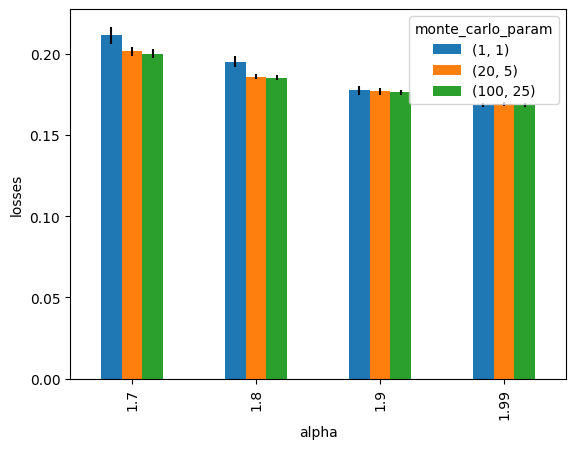

In [504]:
metric = 'losses'
display_bins_metric(df_losses, keys, metric, rolling_average=30, max=False)

/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_14234/3543191214.py:63: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['act', 'dataset', 'device', 'loss_monte_carlo', 'loss_type',
       'mean_predict', 'monte_carlo_param_', 'optimizer', 'time_emb_type',
       'var_predict', 'weights'],
      dtype='object')
  tmp_max = df.groupby(keys).rolling(window=rolling_average, min_periods=1).max().reset_index(level=0).groupby(keys).max().reset_index()
/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_14234/3543191214.py:64: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['act', 'dataset', 'device', 'loss_monte_carlo', 'loss_type',
       'mean_predict

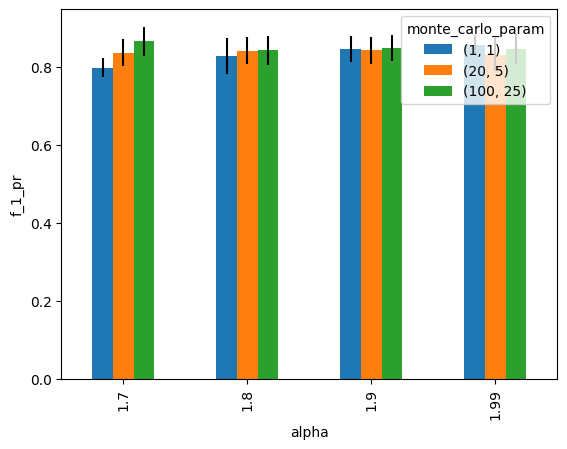

In [505]:
metric = 'f_1_pr'
display_bins_metric(df_eval, keys, metric, max = True)

/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_14234/3543191214.py:63: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['act', 'dataset', 'device', 'loss_monte_carlo', 'loss_type',
       'mean_predict', 'monte_carlo_param_', 'optimizer', 'time_emb_type',
       'var_predict', 'weights'],
      dtype='object')
  tmp_max = df.groupby(keys).rolling(window=rolling_average, min_periods=1).max().reset_index(level=0).groupby(keys).max().reset_index()
/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_14234/3543191214.py:64: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['act', 'dataset', 'device', 'loss_monte_carlo', 'loss_type',
       'mean_predict

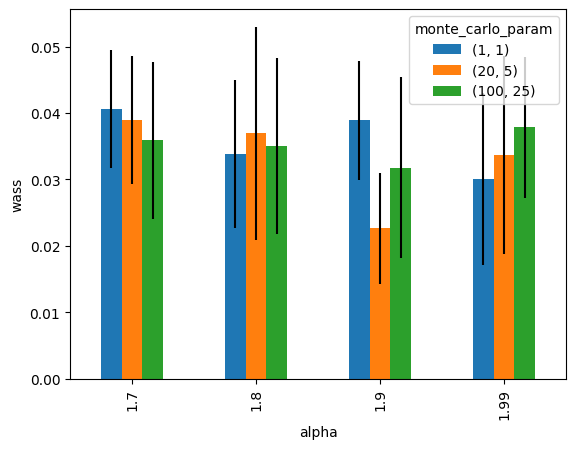

In [506]:
metric = 'wass'
display_bins_metric(df_eval, keys, metric, max = False)

/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_14234/3543191214.py:63: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['act', 'dataset', 'device', 'loss_monte_carlo', 'loss_type',
       'mean_predict', 'monte_carlo_param_', 'optimizer', 'time_emb_type',
       'var_predict', 'weights'],
      dtype='object')
  tmp_max = df.groupby(keys).rolling(window=rolling_average, min_periods=1).max().reset_index(level=0).groupby(keys).max().reset_index()
/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_14234/3543191214.py:64: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['act', 'dataset', 'device', 'loss_monte_carlo', 'loss_type',
       'mean_predict

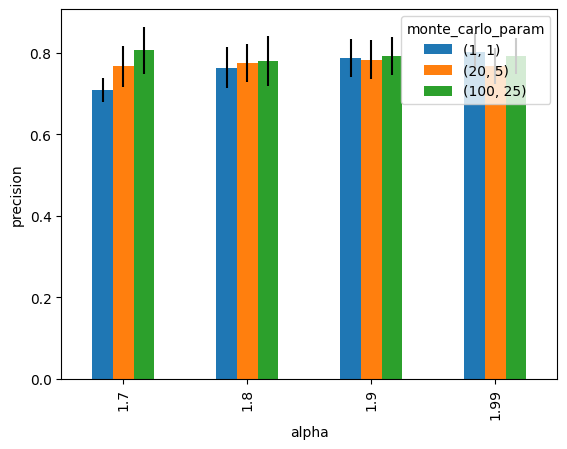

In [507]:
metric = 'precision'
display_bins_metric(df_eval, keys, metric, max = True)

/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_14234/3543191214.py:63: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['act', 'dataset', 'device', 'loss_monte_carlo', 'loss_type',
       'mean_predict', 'monte_carlo_param_', 'optimizer', 'time_emb_type',
       'var_predict', 'weights'],
      dtype='object')
  tmp_max = df.groupby(keys).rolling(window=rolling_average, min_periods=1).max().reset_index(level=0).groupby(keys).max().reset_index()
/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_14234/3543191214.py:64: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['act', 'dataset', 'device', 'loss_monte_carlo', 'loss_type',
       'mean_predict

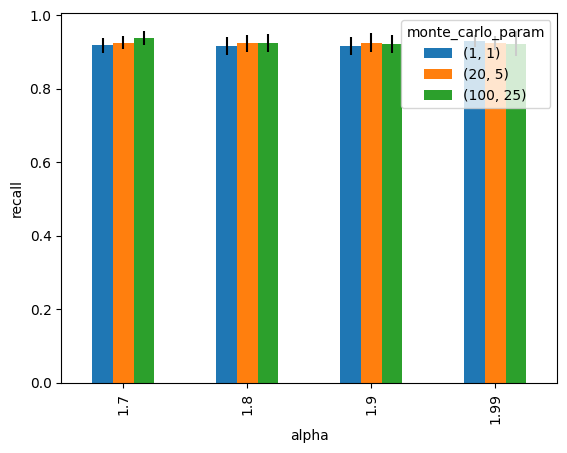

In [508]:
metric = 'recall'
display_bins_metric(df_eval, keys, metric, max = True)

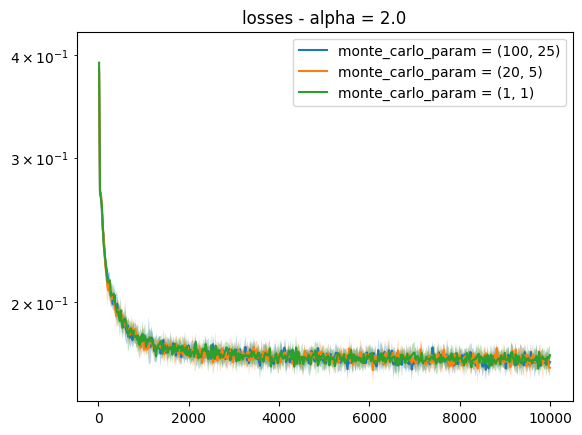

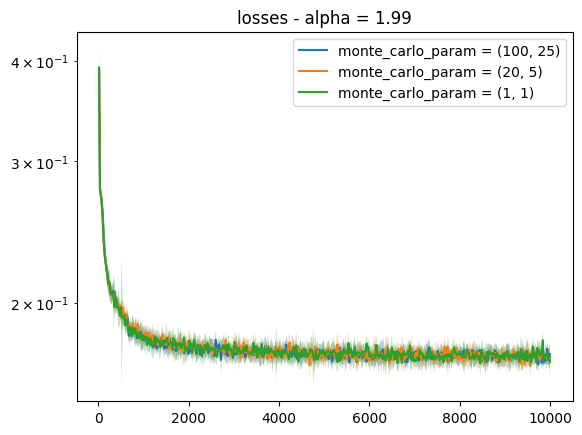

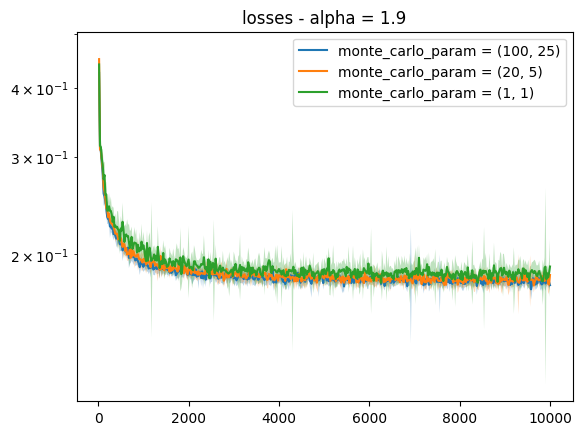

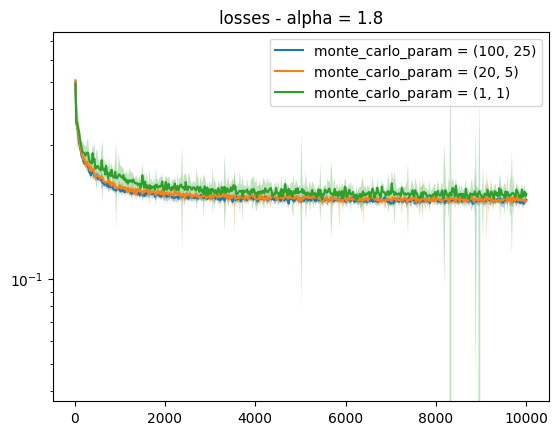

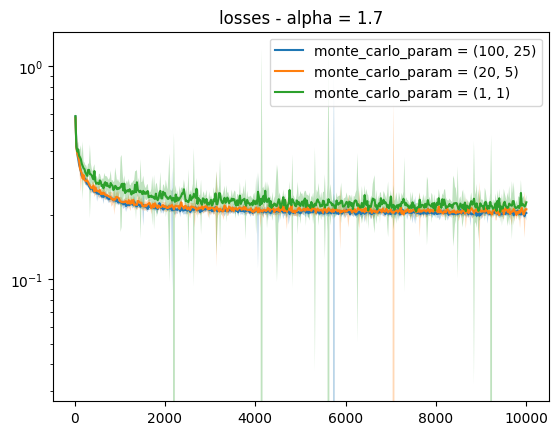

In [377]:
display(res_losses, 'alpha', 'monte_carlo_param', 'losses', log_scale=True, metric_and_std=True, agg_type='median')

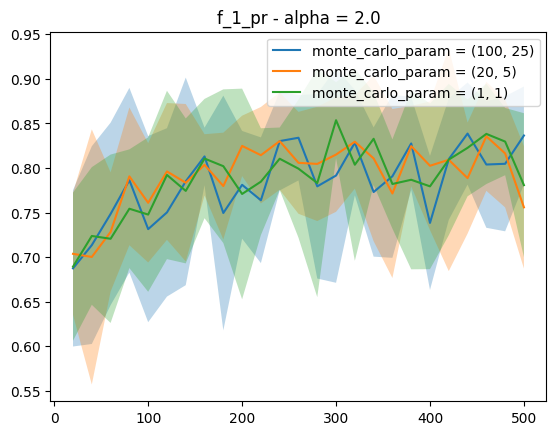

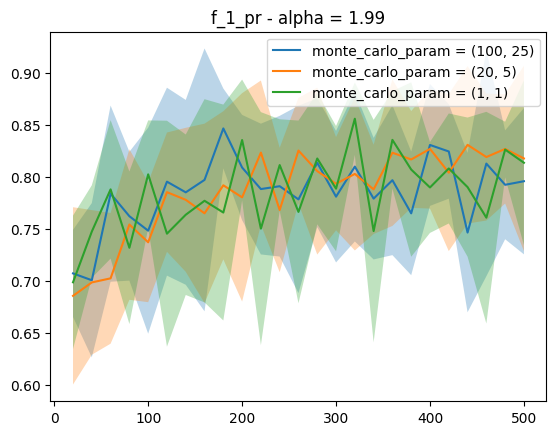

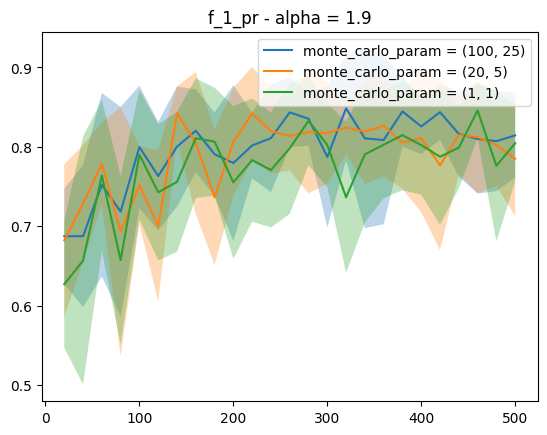

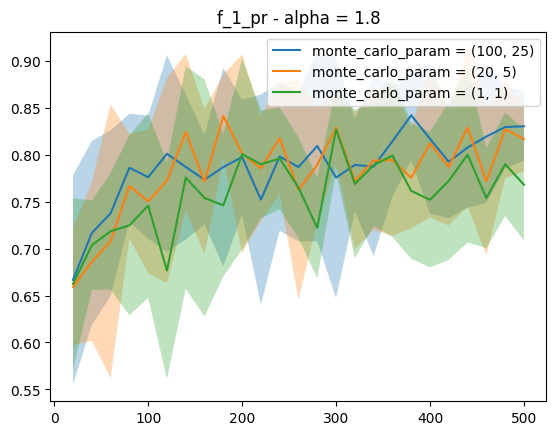

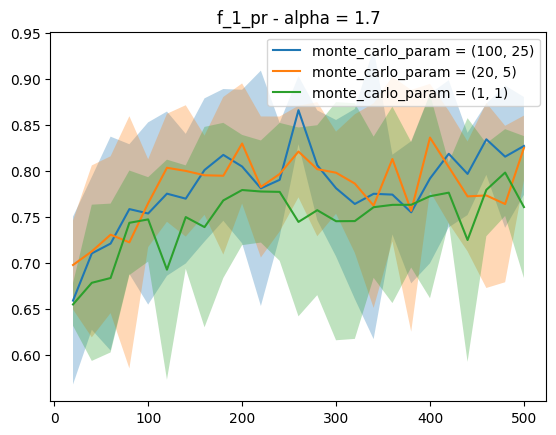

In [380]:
display(res_eval, 'alpha', 'monte_carlo_param', 'f_1_pr', log_scale=False, metric_and_std=True, agg_type='mean')

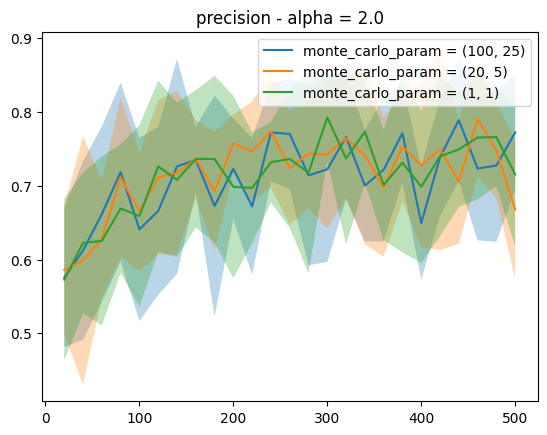

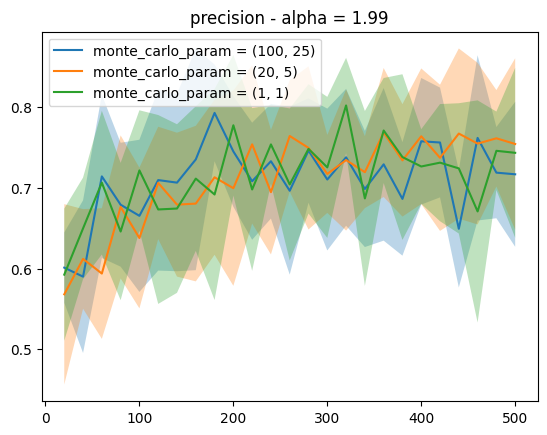

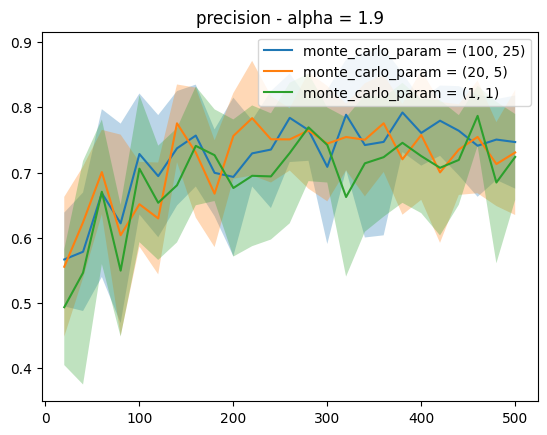

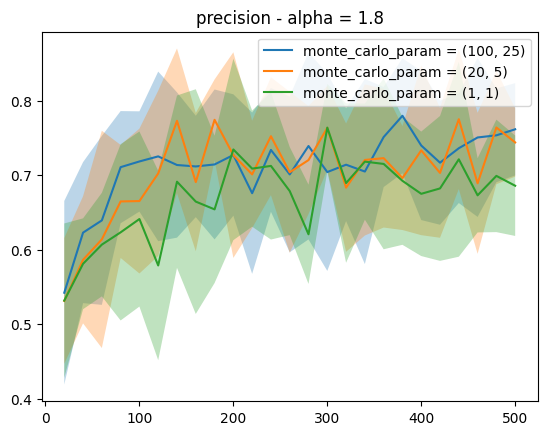

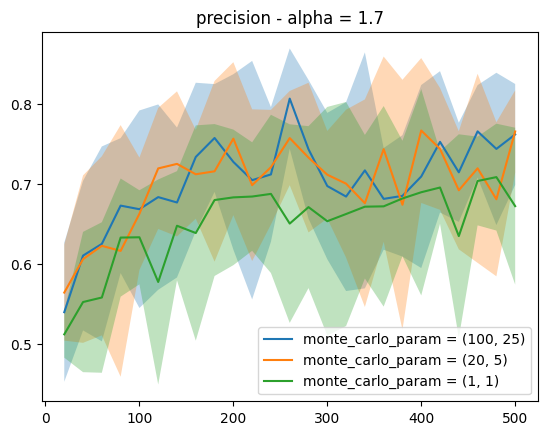

In [385]:
display(res_eval, 'alpha', 'monte_carlo_param', 'precision', log_scale=False, metric_and_std=True, agg_type='mean')

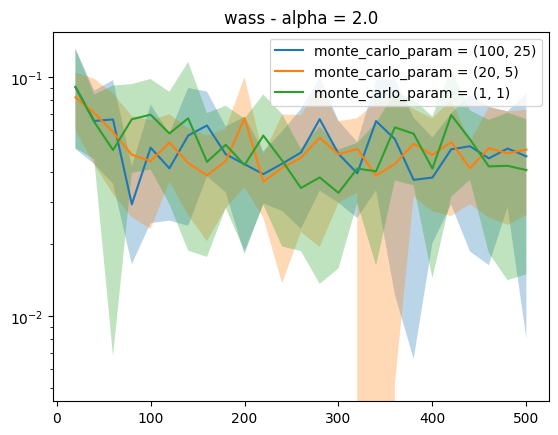

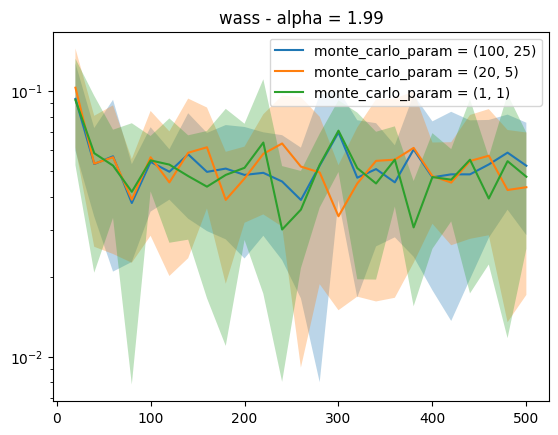

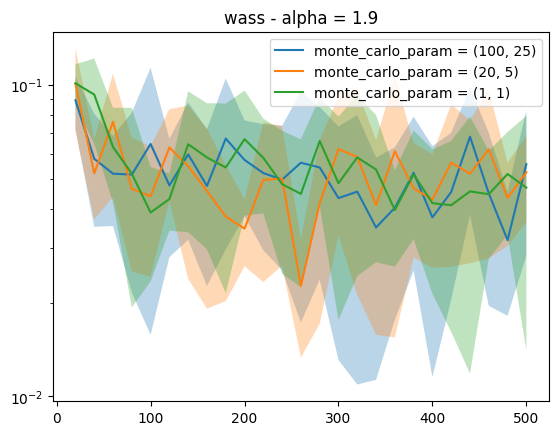

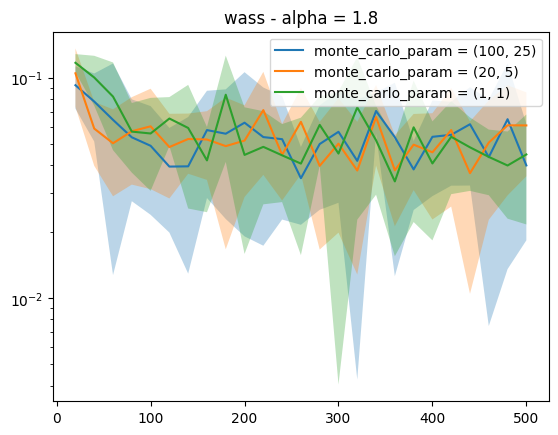

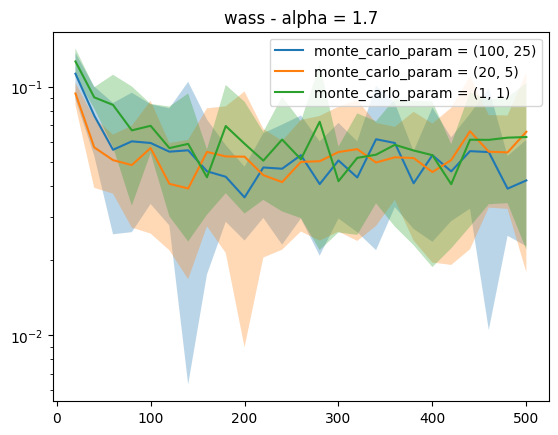

In [384]:
display(res_eval, 'alpha', 'monte_carlo_param', 'wass', log_scale=True, metric_and_std=True, agg_type='mean')

## Transfer model for different alphas

In [ ]:
data_eval, data_losses, data_models = load_dataframe('models/alpha_transfer/', 'sas_grid')
data_eval_normal, data_losses_normal, data_models_normal = \
            data_eval[data_eval['alpha'] == 1.8], data_losses[data_losses['alpha'] == 1.8], data_models[data_models['alpha'] == 1.8]
data_eval_mixed, data_losses_mixed, data_models_mixed = load_dataframe('models/alpha_transfer_mixed_training/', 'sas_grid')

def aux(a, b):
    a['mixed'] = False
    b['mixed'] = True
    return pd.concat([a, b])

data_eval, data_losses, data_models = tuple(aux(a, b) for a, b in \
    zip([data_eval_normal, data_losses_normal, data_models_normal], 
                [data_eval_mixed, data_losses_mixed, data_models_mixed]))
    

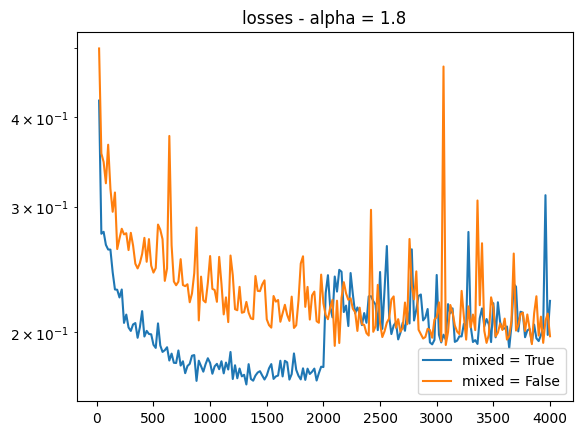

In [10]:
display(data_losses, 'alpha', 'mixed', 'losses', log_scale=True)

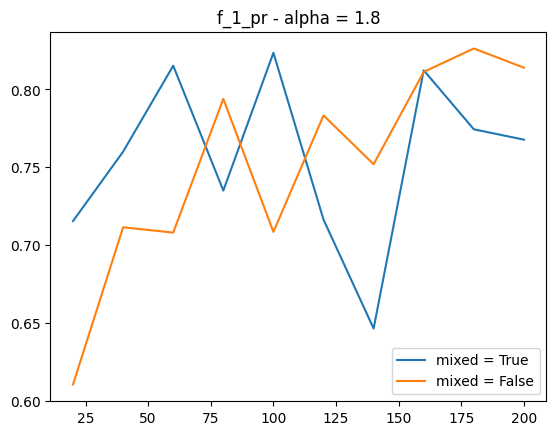

In [11]:
display(data_eval, 'alpha', 'mixed', 'f_1_pr', log_scale=False)

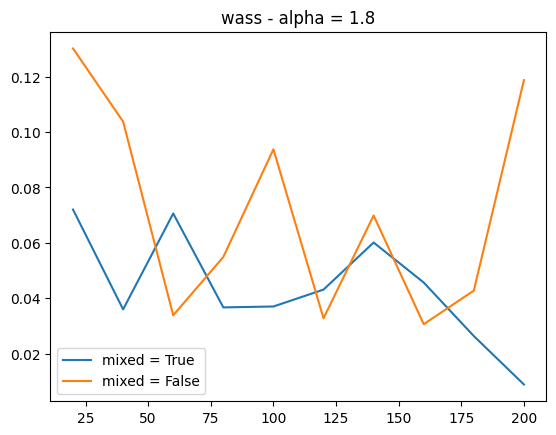

In [12]:
display(data_eval, 'alpha', 'mixed', 'wass', log_scale=False)

## Non Isotropic diffusion - LIM vs $\alpha-DDPM$

In [ ]:
data_eval, data_losses, data_models = load_dataframe('models/2d_non_iso_random', 'sas_grid', 
                                                     exp_range=[k for k in range(2, 9) if k != 7])
res_eval, res_losses = aggregate_dataframes(data_eval, data_losses, data_models, agg_list=['alpha', 'LIM'])

#data_eval, data_losses, data_models = data_eval[data_eval['alpha'].isin([2., 1.99, 1.8])], \
#                                        data_losses[data_losses['alpha'].isin( [2., 1.99, 1.8]) ], \
#                                        data_models[data_models['alpha'].isin( [2., 1.99, 1.8])]

In [ ]:
data_eval, data_losses, data_models = load_dataframe('models/2d_non_iso_random', 'sas_grid', 
                                                     exp_range=[k for k in range(0, 9)])
res_eval, res_losses = aggregate_dataframes(data_eval, data_losses, data_models, agg_list=['alpha', 'LIM'])

/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_14234/3543191214.py:63: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['act', 'dataset', 'device', 'loss_monte_carlo', 'loss_type',
       'mean_predict', 'optimizer', 'time_emb_type', 'var_predict', 'weights'],
      dtype='object')
  tmp_max = df.groupby(keys).rolling(window=rolling_average, min_periods=1).max().reset_index(level=0).groupby(keys).max().reset_index()
/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_14234/3543191214.py:64: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['act', 'dataset', 'device', 'loss_monte_carlo', 'loss_type',
       'mean_predict', 'optimizer', 'time_emb_typ

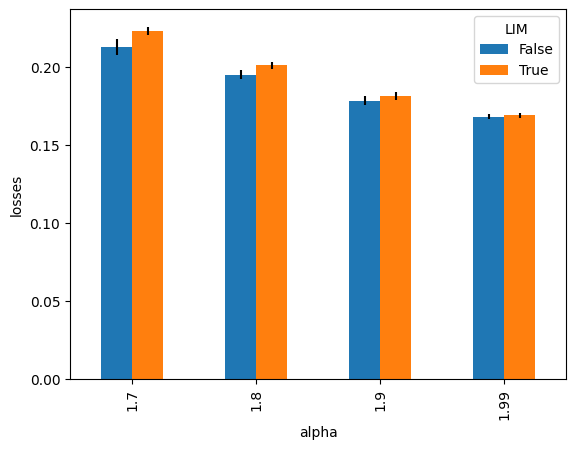

In [493]:
df_losses = res_losses[res_losses['alpha']!= 2.]
df_eval = res_eval[res_eval['alpha']!= 2.]

keys = ['LIM', 'alpha'][::-1]
metric = 'losses'


display_bins_metric(df_losses, keys, metric, rolling_average=3, max=False)

/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_14234/3543191214.py:63: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['act', 'dataset', 'device', 'loss_monte_carlo', 'loss_type',
       'mean_predict', 'optimizer', 'time_emb_type', 'var_predict', 'weights'],
      dtype='object')
  tmp_max = df.groupby(keys).rolling(window=rolling_average, min_periods=1).max().reset_index(level=0).groupby(keys).max().reset_index()
/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_14234/3543191214.py:64: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['act', 'dataset', 'device', 'loss_monte_carlo', 'loss_type',
       'mean_predict', 'optimizer', 'time_emb_typ

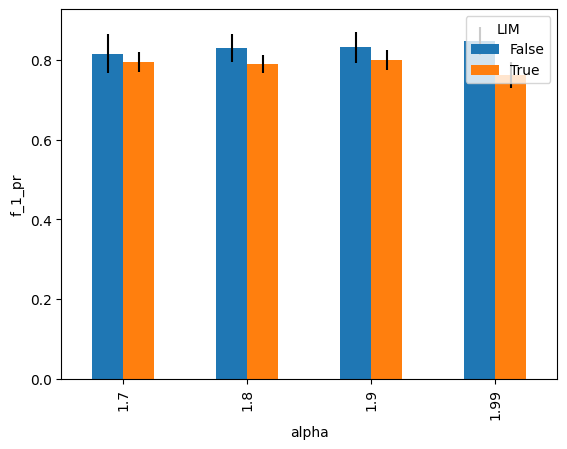

In [494]:
df_losses = res_losses[res_losses['alpha']!= 2.]
df_eval = res_eval[res_eval['alpha']!= 2.]

keys = ['LIM', 'alpha'][::-1]
metric = 'f_1_pr'


display_bins_metric(df_eval, keys, metric, max = True)

/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_14234/3543191214.py:63: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['act', 'dataset', 'device', 'loss_monte_carlo', 'loss_type',
       'mean_predict', 'optimizer', 'time_emb_type', 'var_predict', 'weights'],
      dtype='object')
  tmp_max = df.groupby(keys).rolling(window=rolling_average, min_periods=1).max().reset_index(level=0).groupby(keys).max().reset_index()
/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_14234/3543191214.py:64: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['act', 'dataset', 'device', 'loss_monte_carlo', 'loss_type',
       'mean_predict', 'optimizer', 'time_emb_typ

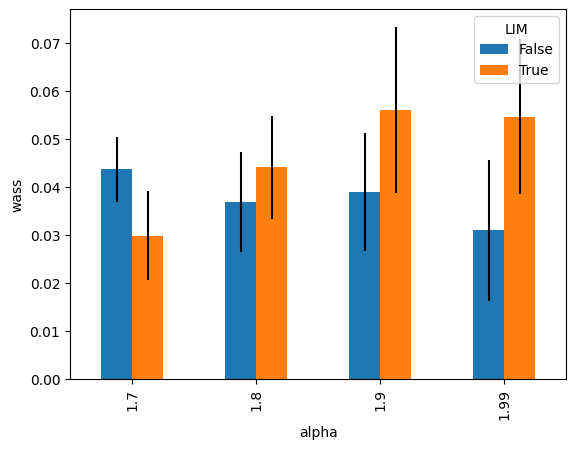

In [495]:
df_losses = res_losses[res_losses['alpha']!= 2.]
df_eval = res_eval[res_eval['alpha']!= 2.]

keys = ['LIM', 'alpha'][::-1]
metric = 'wass'


display_bins_metric(df_eval, keys, metric, max = False)

/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_14234/3543191214.py:63: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['act', 'dataset', 'device', 'loss_monte_carlo', 'loss_type',
       'mean_predict', 'optimizer', 'time_emb_type', 'var_predict', 'weights'],
      dtype='object')
  tmp_max = df.groupby(keys).rolling(window=rolling_average, min_periods=1).max().reset_index(level=0).groupby(keys).max().reset_index()
/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_14234/3543191214.py:64: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['act', 'dataset', 'device', 'loss_monte_carlo', 'loss_type',
       'mean_predict', 'optimizer', 'time_emb_typ

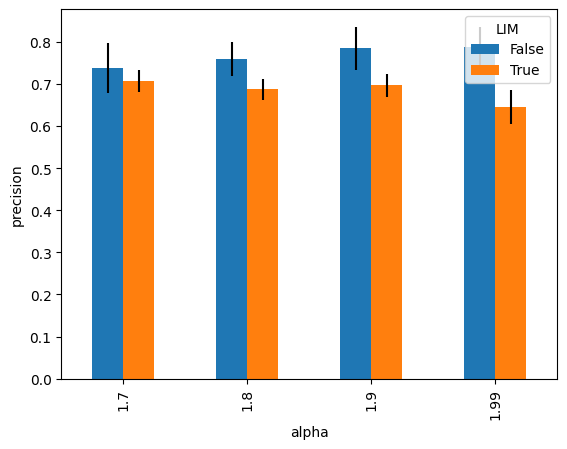

In [496]:
df_losses = res_losses[res_losses['alpha']!= 2.]
df_eval = res_eval[res_eval['alpha']!= 2.]

keys = ['LIM', 'alpha'][::-1]
metric = 'precision'


display_bins_metric(df_eval, keys, metric, max = True)

/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_14234/3543191214.py:63: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['act', 'dataset', 'device', 'loss_monte_carlo', 'loss_type',
       'mean_predict', 'optimizer', 'time_emb_type', 'var_predict', 'weights'],
      dtype='object')
  tmp_max = df.groupby(keys).rolling(window=rolling_average, min_periods=1).max().reset_index(level=0).groupby(keys).max().reset_index()
/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_14234/3543191214.py:64: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['act', 'dataset', 'device', 'loss_monte_carlo', 'loss_type',
       'mean_predict', 'optimizer', 'time_emb_typ

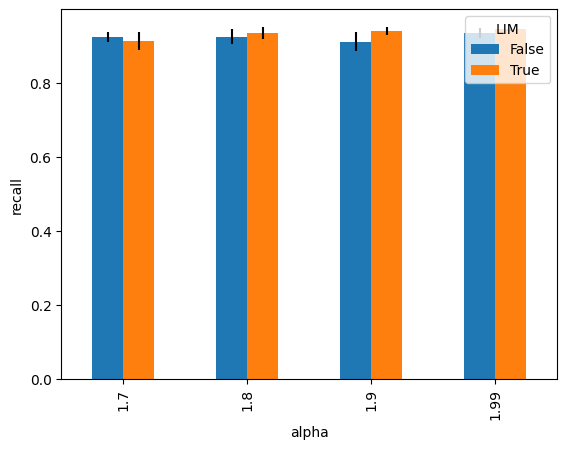

In [497]:
df_losses = res_losses[res_losses['alpha']!= 2.]
df_eval = res_eval[res_eval['alpha']!= 2.]

keys = ['LIM', 'alpha'][::-1]
metric = 'recall'


display_bins_metric(df_eval, keys, metric, max = True)

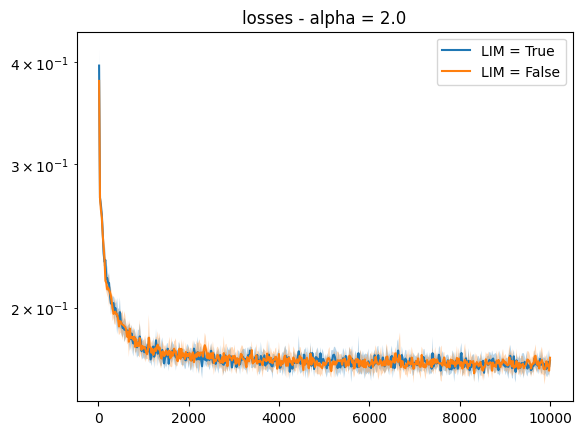

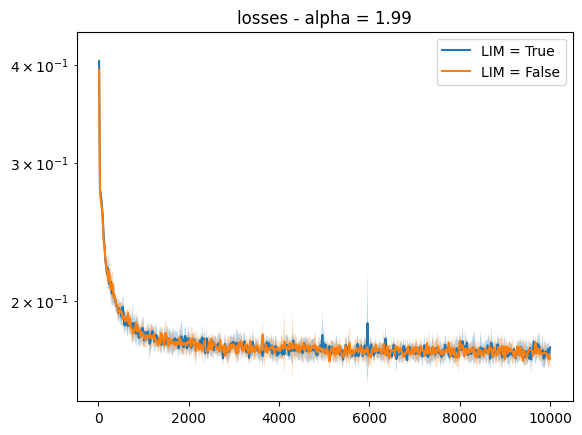

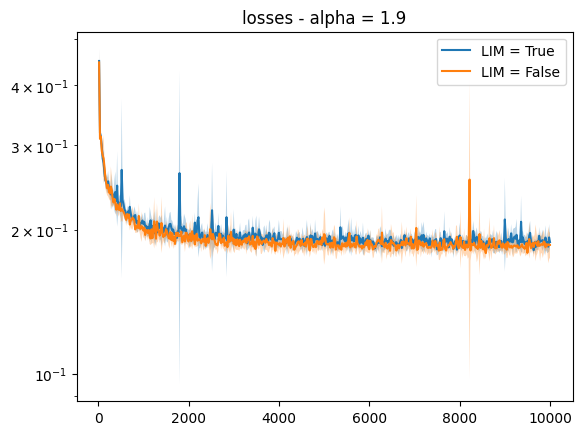

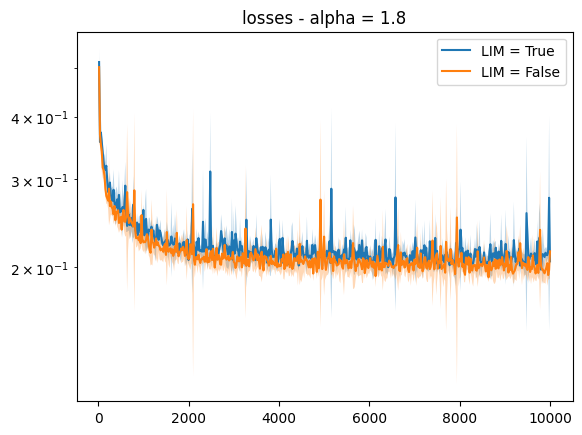

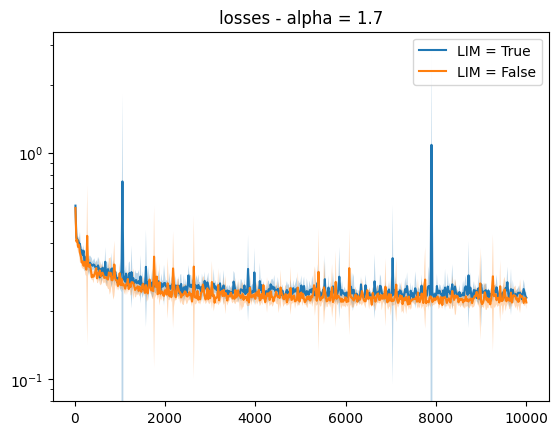

In [317]:
display(res_losses, 'alpha', 'LIM', 'losses', log_scale=True, 
        metric_and_std=True, agg_type='mean')

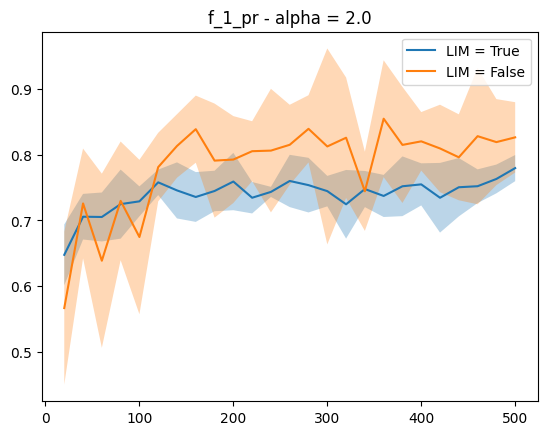

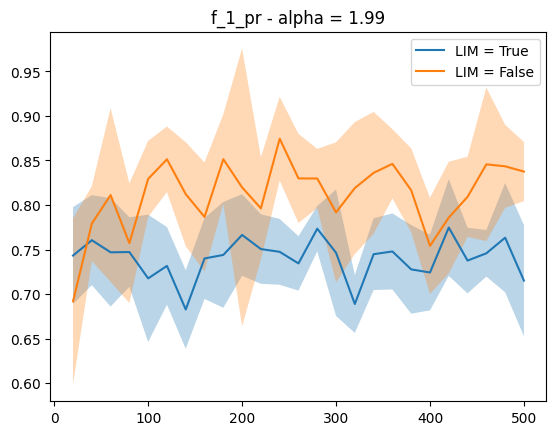

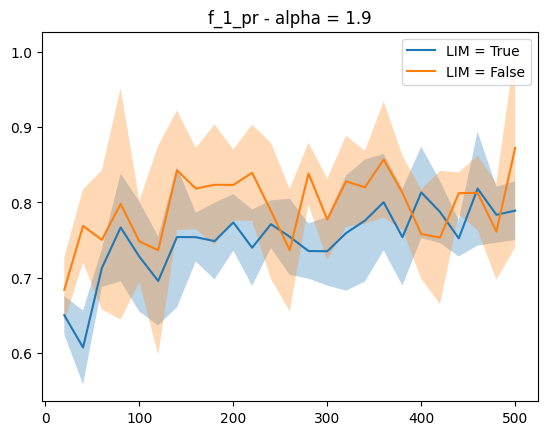

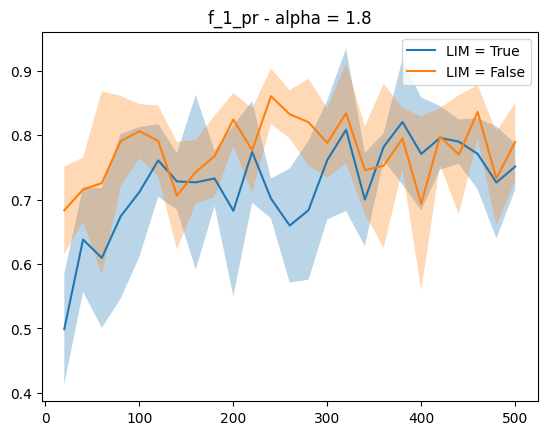

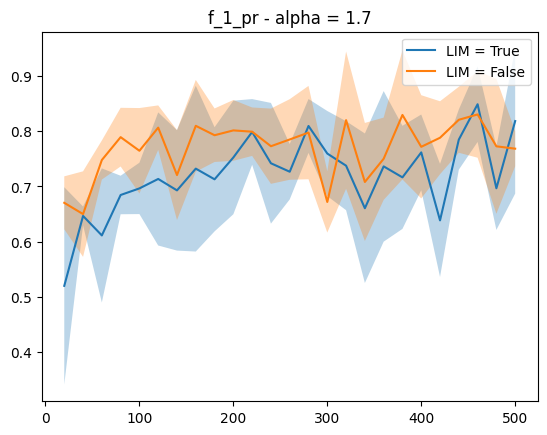

In [319]:
display(res_eval, 'alpha', 'LIM', 'f_1_pr', log_scale=False, 
        metric_and_std=True, agg_type='median')

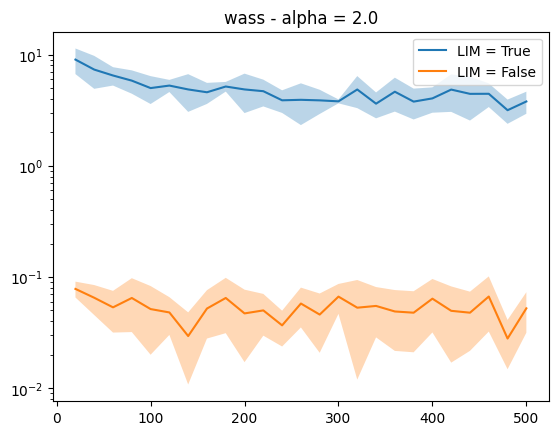

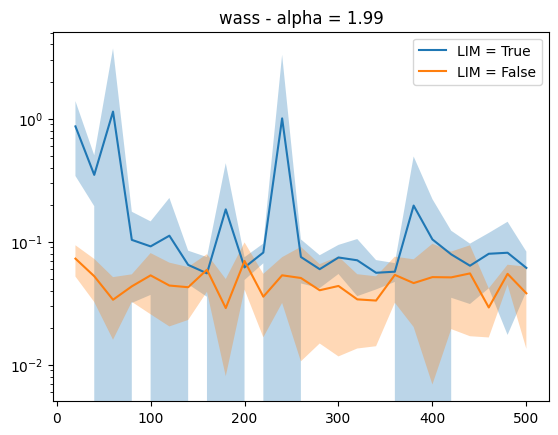

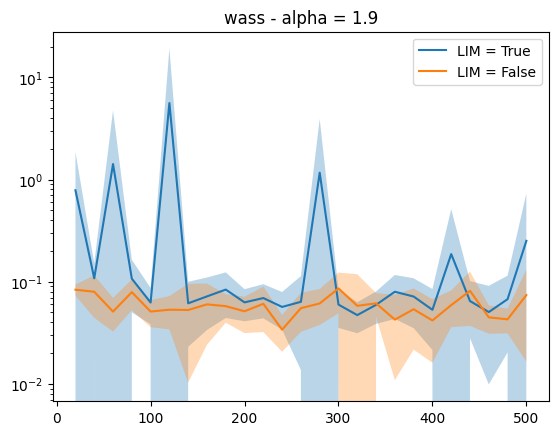

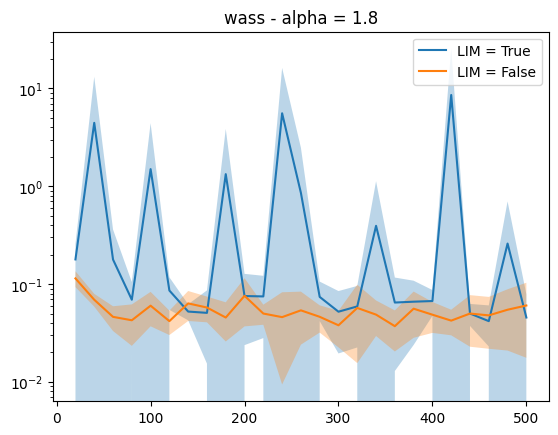

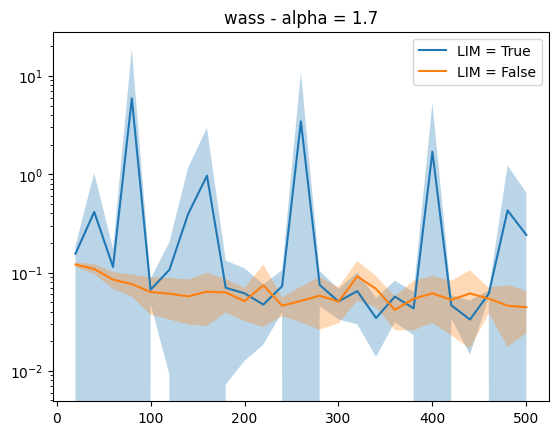

In [321]:
display(res_eval, 'alpha', 'LIM', 'wass', log_scale=True, 
        metric_and_std=True, agg_type='mean')

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 109.78it/s]


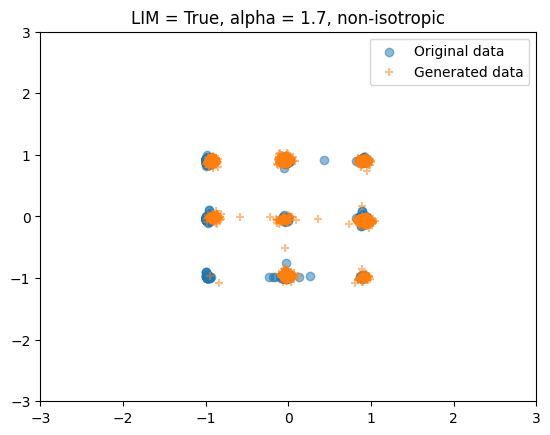

In [18]:
lims = 3
LIM = True
alpha = 1.7
gen_model = generate_samples(data_models, 
                             (data_models['LIM'] == LIM) & (data_models['alpha'] == alpha), 
                             num_samples=2000,
                             ddim = False,
                             eta=1.,
                            is_image = False)
gen_model.get_plot(xlim = (-lims, lims), ylim = (-lims, lims), title='LIM = {}, alpha = {}, non-isotropic'.format(LIM, alpha))

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 99/100 [00:01<00:00, 97.29it/s]


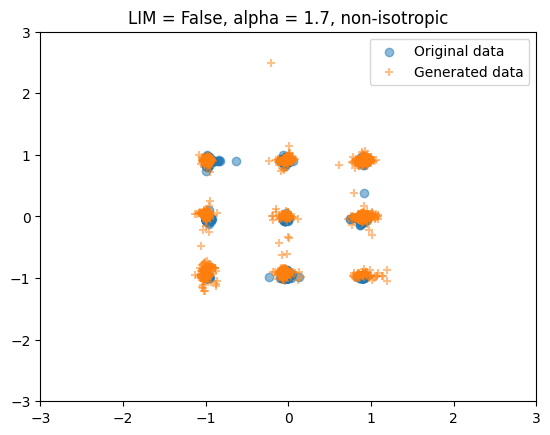

In [19]:
lims = 3
LIM = False
alpha = 1.7
gen_model = generate_samples(data_models, 
                             (data_models['LIM'] == LIM) & (data_models['alpha'] == alpha), 
                             num_samples=2000,
                             ddim = False,
                             eta=1.,
                            is_image = False)
gen_model.get_plot(xlim = (-lims, lims), ylim = (-lims, lims), title='LIM = {}, alpha = {}, non-isotropic'.format(LIM, alpha))

In [57]:
from sklearn.cluster import KMeans


def approx_class_imbalance_grid(kmeans, gen_model, n_runs, n_samples = 2000):
    # classifiy with initial data
    # generate new data, predict, compare number of labels

    L = []
    for i in range(n_runs):
        gen_model.generate(n_samples, print_progression = False)
        pred = kmeans.predict(gen_model.samples.squeeze(1))
        pred = np.append(pred, [0, kmeans.n_clusters - 1]) # to make sure bincount gives array of dimension n_clusters
        pred_weights = np.bincount(pred) / n_samples
        L.append(pred_weights)
    
    return np.array(L)

def class_imbalance_table_grid(n_runs = 10, n_samples = 10000):
    gen_model = Gen.GenerationManager(data_models['experiment'].iloc[0].manager.model, 
                                      data_models['experiment'].iloc[0].manager.diffusion, 
                                      data_models['experiment'].iloc[0].manager.data,
                                      is_image=False)
    table = pd.DataFrame(data = {})
    kmeans = KMeans(n_clusters=9, random_state=0, init='k-means++', n_init = 1)
    some_data = gen_model.load_original_data(n_samples)
    kmeans.fit(some_data.squeeze(1))
    true_weights = np.bincount(kmeans.labels_) / len(some_data)
    print(true_weights)
    for l in data_eval['LIM'].unique():
        for a in data_eval['alpha'].unique():
            print(l, a)
            cond = (data_models['LIM'] == l) & (data_models['alpha'] == a)
            gen_model = Gen.GenerationManager(data_models[cond]['experiment'].iloc[0].manager.model,
                                              data_models[cond]['experiment'].iloc[0].manager.diffusion,
                                              data_models[cond]['experiment'].iloc[0].manager.data,
                                             is_image=False)
            L = approx_class_imbalance_grid(kmeans, gen_model, n_runs)
            m, s = np.mean(L, axis = 0), np.std(L, axis = 0)
            
            df = pd.DataFrame(data = {})
            df['LIM'] = [l]
            df['alpha'] = [a]
            tmp = np.array(data_models['weights'][0])
            tmp.sort()
            df['true_weights'] = [tmp]
            df['gen_mixture_weights'] = [m]
            df['std'] = [s]
            table = pd.concat([table, df])
    return table.reset_index(drop=True)

In [58]:
tmp = class_imbalance_table_grid(n_runs = 5, n_samples = 10000)

[0.2938 0.1544 0.1944 0.158  0.0989 0.051  0.0203 0.0207 0.0085]
False 2.0
False 1.99
False 1.9
False 1.7
False 1.8
True 2.0


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:01<00:00, 82.28it/s]


True 1.99


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 116.21it/s]


True 1.9


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 115.30it/s]


True 1.7


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 116.94it/s]


True 1.8


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 115.02it/s]


In [59]:
def compute_norm(row):
    return np.linalg.norm(np.log(row['true_weights']) - np.log(row['gen_mixture_weights']), ord = 2) / row['true_weights'].size
    #return np.linalg.norm(row['true_weights'] / row['gen_mixture_weights'] - 1, ord = 2)


def compute_norm_1(row):
    return np.linalg.norm(np.log(row['true_weights']) - np.log(row['gen_mixture_weights']), ord = 1)/ row['true_weights'].size

tmp['dist'] = tmp.apply(compute_norm, axis = 1)
tmp['dist_L1'] = tmp.apply(compute_norm_1, axis = 1)


/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_63995/1016580699.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  tmp_2 = tmp.pivot('alpha', 'LIM', 'dist')
/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_63995/1016580699.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  tmp_1 = tmp.pivot('alpha', 'LIM', 'dist_L1')


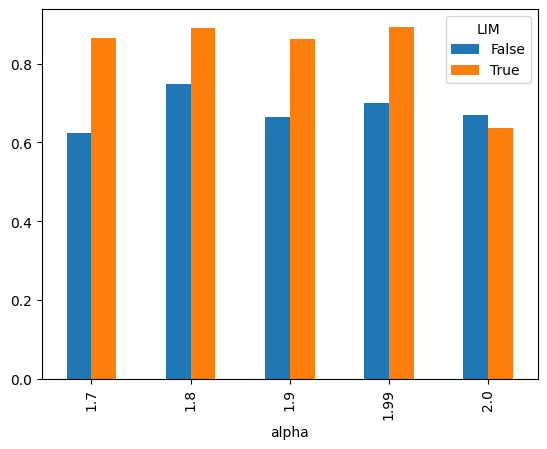

In [60]:
tmp = tmp.sort_values(['LIM', 'alpha'])
tmp_2 = tmp.pivot('alpha', 'LIM', 'dist')
tmp_1 = tmp.pivot('alpha', 'LIM', 'dist_L1')
tmp_2.plot(kind = 'bar')
#tmp_1.plot(kind = 'bar')
plt.show()

/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_63995/2158578666.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  tmp_2 = tmp.pivot('LIM', 'alpha', 'dist')
/var/folders/hq/vv3v4s957cbfyk__fc9bp7x42zgcgc/T/ipykernel_63995/2158578666.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  tmp_1 = tmp.pivot('LIM', 'alpha', 'dist_L1')


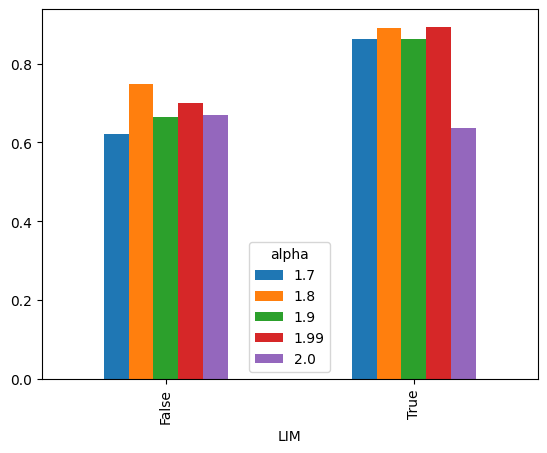

In [61]:
tmp = tmp.sort_values(['LIM', 'alpha'])
tmp_2 = tmp.pivot('LIM', 'alpha', 'dist')
tmp_1 = tmp.pivot('LIM', 'alpha', 'dist_L1')
tmp_2.plot(kind = 'bar')
#tmp_1.plot(kind = 'bar')
plt.show()

## MNIST and CIFAR10

## MNIST - median of means

In [13]:
data_eval, data_losses, data_models = pd.DataFrame(data = {}), pd.DataFrame(data = {}), pd.DataFrame(data = {})
for monte_carlo_param in ['1_1', '5_5']:
    a, b, c = load_dataframe('_'.join(('models/mnist', monte_carlo_param)), 'mnist', do_not_load_model=True)
    for d in [a, b, c]:
        d['monte_carlo_param'] = [tuple((x, y)) for x, y in zip(d['monte_carlo_steps'], d['monte_carlo_groups'])]
    data_eval = pd.concat([data_eval, a])
    data_losses = pd.concat([data_losses, b])
    data_models = pd.concat([data_models, c])

if (data_eval['eval_freq'].isnull()).any():
    data_eval['eval_freq'] = 1
if (data_losses['eval_freq'].isnull()).any():
    data_losses['eval_freq'] = 1
res_eval, res_losses = aggregate_dataframes(data_eval, data_losses, data_models, agg_list=['alpha', 'monte_carlo_param'])
res_eval = res_eval.fillna(0)
res_losses = res_losses.fillna(0)

models/mnist_1_1
0 {'seed': None, 'data': {'channels': 1, 'dataset': 'mnist', 'image_size': 32, 'num_workers': 6, 'random_flip': True}, 'diffusion': {'LIM': False, 'alpha': 1.7, 'clamp_a': None, 'clamp_eps': None, 'diffusion_steps': 1000, 'isotropic': True, 'mean_predict': 'EPSILON', 'rescale_timesteps': True, 'var_predict': 'FIXED'}, 'eval': {'data_to_generate': 2048, 'ddim': False, 'eval_eta': 1.0, 'reduce_timesteps': 1.0, 'clip_denoised': True}, 'model': {'model_type': 'ddpm', 'attn_resolutions': [2, 4], 'channel_mult': [1, 2, 2, 2], 'compute_gamma': False, 'dropout': 0.1, 'model_channels': 32, 'num_heads': 4, 'num_res_blocks': 2}, 'training': {'bs': 256, 'ema_rates': [0.999], 'grad_clip': None, 'loss_monte_carlo': 'mean', 'loss_type': 'LP_EPS_LOSS', 'lploss': 1.0, 'monte_carlo_steps': 1, 'monte_carlo_groups': 1}, 'optim': {'lr': 0.0001, 'lr_steps': 300000, 'optimizer': 'adamw', 'schedule': None, 'warmup': 100}, 'run': {'epochs': 100, 'eval_freq': None, 'checkpoint_freq': 25, 'progr

/opt/homebrew/anaconda3/lib/python3.11/site-packages/torch/serialization.py:1438: UserWarning: This figure was saved with matplotlib version 3.8.2 and is unlikely to function correctly.
  result = unpickler.load()


None {'seed': None, 'data': {'channels': 1, 'dataset': 'mnist', 'image_size': 32, 'num_workers': 6, 'random_flip': True}, 'diffusion': {'LIM': False, 'alpha': 1.9, 'clamp_a': None, 'clamp_eps': None, 'diffusion_steps': 1000, 'isotropic': True, 'mean_predict': 'EPSILON', 'rescale_timesteps': True, 'var_predict': 'FIXED'}, 'eval': {'data_to_generate': 2048, 'ddim': False, 'eval_eta': 1.0, 'reduce_timesteps': 1.0, 'clip_denoised': True}, 'model': {'model_type': 'ddpm', 'attn_resolutions': [2, 4], 'channel_mult': [1, 2, 2, 2], 'compute_gamma': False, 'dropout': 0.1, 'model_channels': 32, 'num_heads': 4, 'num_res_blocks': 2}, 'training': {'bs': 256, 'ema_rates': [0.999], 'grad_clip': None, 'loss_monte_carlo': 'mean', 'loss_type': 'LP_EPS_LOSS', 'lploss': 1.0, 'monte_carlo_steps': 1, 'monte_carlo_groups': 1}, 'optim': {'lr': 0.0001, 'lr_steps': 300000, 'optimizer': 'adamw', 'schedule': None, 'warmup': 100}, 'run': {'epochs': 300, 'eval_freq': None, 'checkpoint_freq': 25, 'progress': True}, '

/opt/homebrew/anaconda3/lib/python3.11/site-packages/torch/serialization.py:1438: UserWarning: This figure was saved with matplotlib version 3.8.2 and is unlikely to function correctly.
  result = unpickler.load()


None {'seed': None, 'data': {'channels': 1, 'dataset': 'mnist', 'image_size': 32, 'num_workers': 6, 'random_flip': True}, 'diffusion': {'LIM': False, 'alpha': 2.0, 'clamp_a': None, 'clamp_eps': None, 'diffusion_steps': 1000, 'isotropic': True, 'mean_predict': 'EPSILON', 'rescale_timesteps': True, 'var_predict': 'FIXED'}, 'eval': {'data_to_generate': 2048, 'ddim': False, 'eval_eta': 1.0, 'reduce_timesteps': 1.0, 'clip_denoised': True}, 'model': {'model_type': 'ddpm', 'attn_resolutions': [2, 4], 'channel_mult': [1, 2, 2, 2], 'compute_gamma': False, 'dropout': 0.1, 'model_channels': 32, 'num_heads': 4, 'num_res_blocks': 2}, 'training': {'bs': 256, 'ema_rates': [0.999], 'grad_clip': None, 'loss_monte_carlo': 'mean', 'loss_type': 'LP_EPS_LOSS', 'lploss': 1.0, 'monte_carlo_steps': 1, 'monte_carlo_groups': 1}, 'optim': {'lr': 0.0001, 'lr_steps': 300000, 'optimizer': 'adamw', 'schedule': None, 'warmup': 100}, 'run': {'epochs': 100, 'eval_freq': None, 'checkpoint_freq': 25, 'progress': True}, '

/opt/homebrew/anaconda3/lib/python3.11/site-packages/torch/serialization.py:1438: UserWarning: This figure was saved with matplotlib version 3.8.2 and is unlikely to function correctly.
  result = unpickler.load()


None {'seed': None, 'data': {'channels': 1, 'dataset': 'mnist', 'image_size': 32, 'num_workers': 6, 'random_flip': True}, 'diffusion': {'LIM': False, 'alpha': 1.99, 'clamp_a': None, 'clamp_eps': None, 'diffusion_steps': 1000, 'isotropic': True, 'mean_predict': 'EPSILON', 'rescale_timesteps': True, 'var_predict': 'FIXED'}, 'eval': {'data_to_generate': 2048, 'ddim': False, 'eval_eta': 1.0, 'reduce_timesteps': 1.0, 'clip_denoised': True}, 'model': {'model_type': 'ddpm', 'attn_resolutions': [2, 4], 'channel_mult': [1, 2, 2, 2], 'compute_gamma': False, 'dropout': 0.1, 'model_channels': 32, 'num_heads': 4, 'num_res_blocks': 2}, 'training': {'bs': 256, 'ema_rates': [0.999], 'grad_clip': None, 'loss_monte_carlo': 'mean', 'loss_type': 'LP_EPS_LOSS', 'lploss': 1.0, 'monte_carlo_steps': 1, 'monte_carlo_groups': 1}, 'optim': {'lr': 0.0001, 'lr_steps': 300000, 'optimizer': 'adamw', 'schedule': None, 'warmup': 100}, 'run': {'epochs': 300, 'eval_freq': 25, 'checkpoint_freq': 25, 'progress': True}, 'd

/opt/homebrew/anaconda3/lib/python3.11/site-packages/torch/serialization.py:1438: UserWarning: This figure was saved with matplotlib version 3.8.2 and is unlikely to function correctly.
  result = unpickler.load()


None {'seed': None, 'data': {'channels': 1, 'dataset': 'mnist', 'image_size': 32, 'num_workers': 6, 'random_flip': True}, 'diffusion': {'LIM': False, 'alpha': 1.8, 'clamp_a': None, 'clamp_eps': None, 'diffusion_steps': 1000, 'isotropic': True, 'mean_predict': 'EPSILON', 'rescale_timesteps': True, 'var_predict': 'FIXED'}, 'eval': {'data_to_generate': 2048, 'ddim': False, 'eval_eta': 1.0, 'reduce_timesteps': 1.0, 'clip_denoised': True}, 'model': {'model_type': 'ddpm', 'attn_resolutions': [2, 4], 'channel_mult': [1, 2, 2, 2], 'compute_gamma': False, 'dropout': 0.1, 'model_channels': 32, 'num_heads': 4, 'num_res_blocks': 2}, 'training': {'bs': 256, 'ema_rates': [0.999], 'grad_clip': None, 'loss_monte_carlo': 'mean', 'loss_type': 'LP_EPS_LOSS', 'lploss': 1.0, 'monte_carlo_steps': 1, 'monte_carlo_groups': 1}, 'optim': {'lr': 0.0001, 'lr_steps': 300000, 'optimizer': 'adamw', 'schedule': None, 'warmup': 100}, 'run': {'epochs': 25, 'eval_freq': None, 'checkpoint_freq': 25, 'progress': True}, 'd

/opt/homebrew/anaconda3/lib/python3.11/site-packages/torch/serialization.py:1438: UserWarning: This figure was saved with matplotlib version 3.8.2 and is unlikely to function correctly.
  result = unpickler.load()


models/mnist_5_5
0 {'seed': None, 'data': {'channels': 1, 'dataset': 'mnist', 'image_size': 32, 'num_workers': 6, 'random_flip': True}, 'diffusion': {'LIM': False, 'alpha': 1.7, 'clamp_a': None, 'clamp_eps': None, 'diffusion_steps': 1000, 'isotropic': True, 'mean_predict': 'EPSILON', 'rescale_timesteps': True, 'var_predict': 'FIXED'}, 'eval': {'data_to_generate': 2048, 'ddim': False, 'eval_eta': 1.0, 'reduce_timesteps': 1.0, 'clip_denoised': True}, 'model': {'model_type': 'ddpm', 'attn_resolutions': [2, 4], 'channel_mult': [1, 2, 2, 2], 'compute_gamma': False, 'dropout': 0.1, 'model_channels': 32, 'num_heads': 4, 'num_res_blocks': 2}, 'training': {'bs': 256, 'ema_rates': [0.999], 'grad_clip': None, 'loss_monte_carlo': 'median', 'loss_type': 'LP_EPS_LOSS', 'lploss': 1.0, 'monte_carlo_steps': 5, 'monte_carlo_groups': 5}, 'optim': {'lr': 0.0001, 'lr_steps': 300000, 'optimizer': 'adamw', 'schedule': None, 'warmup': 100}, 'run': {'epochs': 300, 'eval_freq': 25, 'checkpoint_freq': 25, 'progr

/opt/homebrew/anaconda3/lib/python3.11/site-packages/torch/serialization.py:1438: UserWarning: This figure was saved with matplotlib version 3.8.2 and is unlikely to function correctly.
  result = unpickler.load()


None {'seed': None, 'data': {'channels': 1, 'dataset': 'mnist', 'image_size': 32, 'num_workers': 6, 'random_flip': True}, 'diffusion': {'LIM': False, 'alpha': 1.9, 'clamp_a': None, 'clamp_eps': None, 'diffusion_steps': 1000, 'isotropic': True, 'mean_predict': 'EPSILON', 'rescale_timesteps': True, 'var_predict': 'FIXED'}, 'eval': {'data_to_generate': 2048, 'ddim': False, 'eval_eta': 1.0, 'reduce_timesteps': 1.0, 'clip_denoised': True}, 'model': {'model_type': 'ddpm', 'attn_resolutions': [2, 4], 'channel_mult': [1, 2, 2, 2], 'compute_gamma': False, 'dropout': 0.1, 'model_channels': 32, 'num_heads': 4, 'num_res_blocks': 2}, 'training': {'bs': 256, 'ema_rates': [0.999], 'grad_clip': None, 'loss_monte_carlo': 'median', 'loss_type': 'LP_EPS_LOSS', 'lploss': 1.0, 'monte_carlo_steps': 5, 'monte_carlo_groups': 5}, 'optim': {'lr': 0.0001, 'lr_steps': 300000, 'optimizer': 'adamw', 'schedule': None, 'warmup': 100}, 'run': {'epochs': 300, 'eval_freq': 25, 'checkpoint_freq': 25, 'progress': True}, '

/opt/homebrew/anaconda3/lib/python3.11/site-packages/torch/serialization.py:1438: UserWarning: This figure was saved with matplotlib version 3.8.2 and is unlikely to function correctly.
  result = unpickler.load()


None {'seed': None, 'data': {'channels': 1, 'dataset': 'mnist', 'image_size': 32, 'num_workers': 6, 'random_flip': True}, 'diffusion': {'LIM': False, 'alpha': 2.0, 'clamp_a': None, 'clamp_eps': None, 'diffusion_steps': 1000, 'isotropic': True, 'mean_predict': 'EPSILON', 'rescale_timesteps': True, 'var_predict': 'FIXED'}, 'eval': {'data_to_generate': 2048, 'ddim': False, 'eval_eta': 1.0, 'reduce_timesteps': 1.0, 'clip_denoised': True}, 'model': {'model_type': 'ddpm', 'attn_resolutions': [2, 4], 'channel_mult': [1, 2, 2, 2], 'compute_gamma': False, 'dropout': 0.1, 'model_channels': 32, 'num_heads': 4, 'num_res_blocks': 2}, 'training': {'bs': 256, 'ema_rates': [0.999], 'grad_clip': None, 'loss_monte_carlo': 'median', 'loss_type': 'LP_EPS_LOSS', 'lploss': 1.0, 'monte_carlo_steps': 5, 'monte_carlo_groups': 5}, 'optim': {'lr': 0.0001, 'lr_steps': 300000, 'optimizer': 'adamw', 'schedule': None, 'warmup': 100}, 'run': {'epochs': 300, 'eval_freq': 25, 'checkpoint_freq': 25, 'progress': True}, '

/opt/homebrew/anaconda3/lib/python3.11/site-packages/torch/serialization.py:1438: UserWarning: This figure was saved with matplotlib version 3.8.2 and is unlikely to function correctly.
  result = unpickler.load()


None {'seed': None, 'data': {'channels': 1, 'dataset': 'mnist', 'image_size': 32, 'num_workers': 6, 'random_flip': True}, 'diffusion': {'LIM': False, 'alpha': 1.99, 'clamp_a': None, 'clamp_eps': None, 'diffusion_steps': 1000, 'isotropic': True, 'mean_predict': 'EPSILON', 'rescale_timesteps': True, 'var_predict': 'FIXED'}, 'eval': {'data_to_generate': 2048, 'ddim': False, 'eval_eta': 1.0, 'reduce_timesteps': 1.0, 'clip_denoised': True}, 'model': {'model_type': 'ddpm', 'attn_resolutions': [2, 4], 'channel_mult': [1, 2, 2, 2], 'compute_gamma': False, 'dropout': 0.1, 'model_channels': 32, 'num_heads': 4, 'num_res_blocks': 2}, 'training': {'bs': 256, 'ema_rates': [0.999], 'grad_clip': None, 'loss_monte_carlo': 'median', 'loss_type': 'LP_EPS_LOSS', 'lploss': 1.0, 'monte_carlo_steps': 5, 'monte_carlo_groups': 5}, 'optim': {'lr': 0.0001, 'lr_steps': 300000, 'optimizer': 'adamw', 'schedule': None, 'warmup': 100}, 'run': {'epochs': 300, 'eval_freq': 25, 'checkpoint_freq': 25, 'progress': True}, 

/opt/homebrew/anaconda3/lib/python3.11/site-packages/torch/serialization.py:1438: UserWarning: This figure was saved with matplotlib version 3.8.2 and is unlikely to function correctly.
  result = unpickler.load()


None {'seed': None, 'data': {'channels': 1, 'dataset': 'mnist', 'image_size': 32, 'num_workers': 6, 'random_flip': True}, 'diffusion': {'LIM': False, 'alpha': 1.8, 'clamp_a': None, 'clamp_eps': None, 'diffusion_steps': 1000, 'isotropic': True, 'mean_predict': 'EPSILON', 'rescale_timesteps': True, 'var_predict': 'FIXED'}, 'eval': {'data_to_generate': 2048, 'ddim': False, 'eval_eta': 1.0, 'reduce_timesteps': 1.0, 'clip_denoised': True}, 'model': {'model_type': 'ddpm', 'attn_resolutions': [2, 4], 'channel_mult': [1, 2, 2, 2], 'compute_gamma': False, 'dropout': 0.1, 'model_channels': 32, 'num_heads': 4, 'num_res_blocks': 2}, 'training': {'bs': 256, 'ema_rates': [0.999], 'grad_clip': None, 'loss_monte_carlo': 'median', 'loss_type': 'LP_EPS_LOSS', 'lploss': 1.0, 'monte_carlo_steps': 5, 'monte_carlo_groups': 5}, 'optim': {'lr': 0.0001, 'lr_steps': 300000, 'optimizer': 'adamw', 'schedule': None, 'warmup': 100}, 'run': {'epochs': 300, 'eval_freq': 25, 'checkpoint_freq': 25, 'progress': True}, '

/opt/homebrew/anaconda3/lib/python3.11/site-packages/torch/serialization.py:1438: UserWarning: This figure was saved with matplotlib version 3.8.2 and is unlikely to function correctly.
  result = unpickler.load()


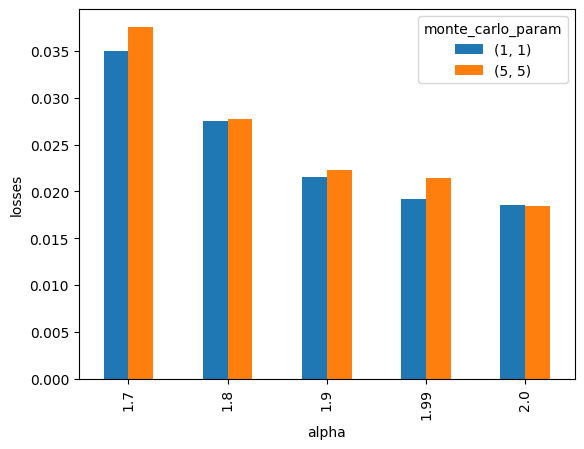

In [20]:
keys = ['monte_carlo_param', 'alpha'][::-1]
metric = 'losses'
display_bins_metric(res_losses, keys, metric, rolling_average=3, max=False)

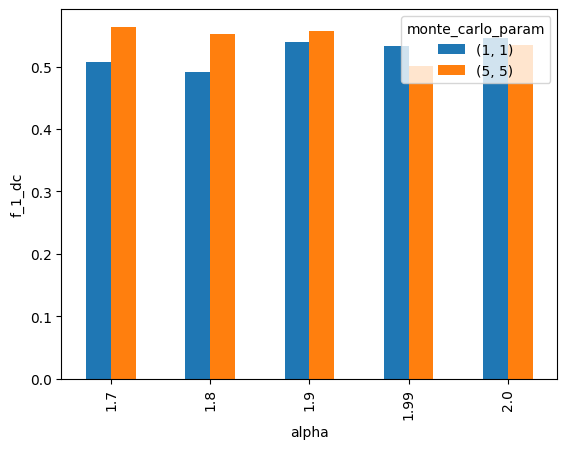

In [35]:
metric = 'f_1_dc'
display_bins_metric(res_eval, keys, metric, rolling_average=3, max=True)

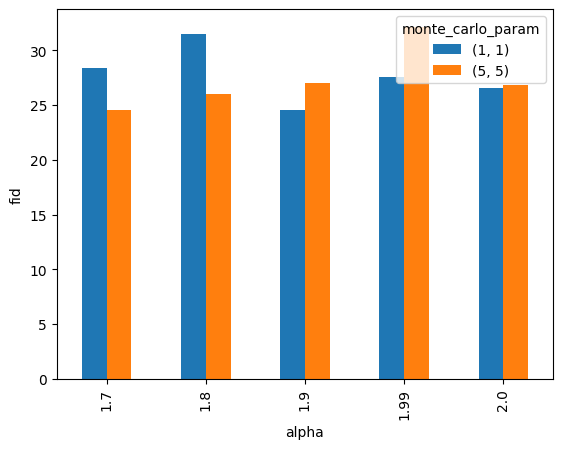

In [34]:
metric = 'fid'
display_bins_metric(res_eval, keys[::1], metric, rolling_average=3, max=False)

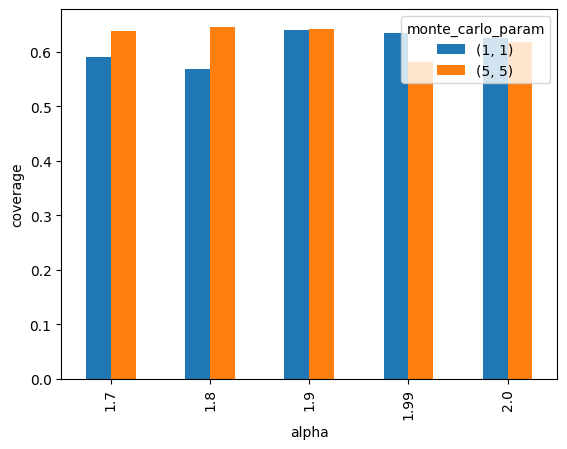

In [45]:
metric = 'coverage'
display_bins_metric(res_eval, keys[::1], metric, rolling_average=3, max=True)

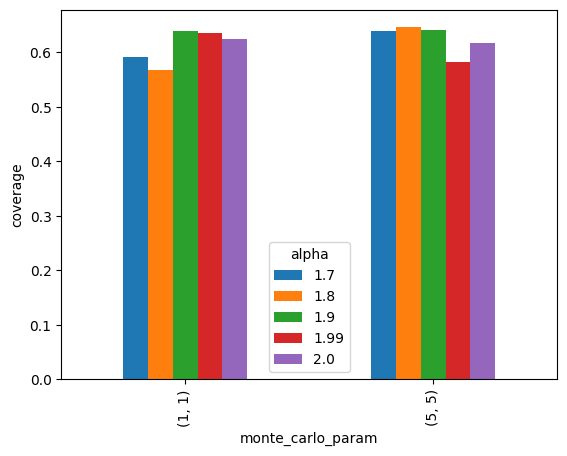

In [44]:
metric = 'coverage'
display_bins_metric(res_eval, keys[::-1], metric, rolling_average=3, max=True)

## MNIST - LIM vs DDPM

In [ ]:
data_eval, data_losses, data_models = pd.DataFrame(data = {}), pd.DataFrame(data = {}), pd.DataFrame(data = {})
a, b, c = load_dataframe('models/mnist_5_5', 'mnist', do_not_load_model=True)
data_eval = pd.concat([data_eval, a])
data_losses = pd.concat([data_losses, b])
data_models = pd.concat([data_models, c])

a, b, c = load_dataframe('models/mnist_lim', 'mnist', do_not_load_model=True)
data_eval = pd.concat([data_eval, a])
data_losses = pd.concat([data_losses, b])
data_models = pd.concat([data_models, c])
if (data_eval['eval_freq'].isnull()).any():
    data_eval['eval_freq'] = 1
if (data_losses['eval_freq'].isnull()).any():
    data_losses['eval_freq'] = 1
res_eval, res_losses = aggregate_dataframes(data_eval, data_losses, data_models, agg_list=['alpha', 'LIM'])
res_eval = res_eval.fillna(0)
res_losses = res_losses.fillna(0)

res_eval = res_eval[res_eval['alpha'] != 2.]
res_losses = res_losses[res_losses['alpha'] != 2.]

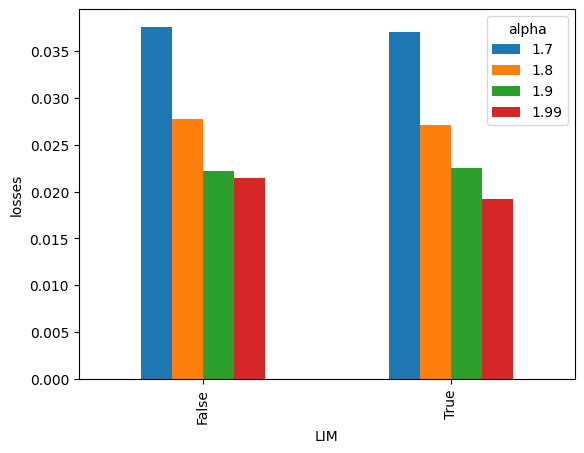

In [70]:
keys = ['LIM', 'alpha'][::1]
metric = 'losses'
display_bins_metric(res_losses, keys[::1], metric, rolling_average=3, max=False)

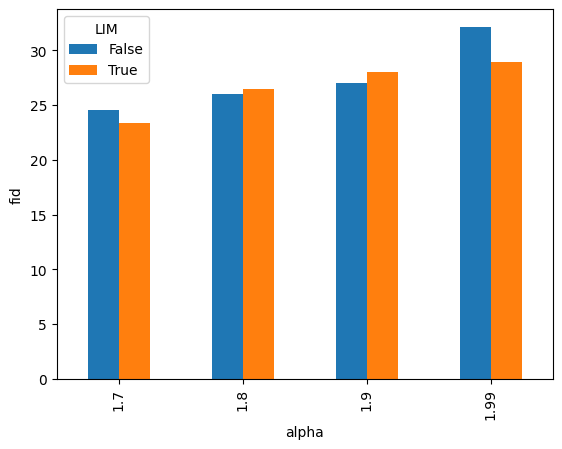

In [71]:
metric = 'fid'
display_bins_metric(res_eval, keys[::-1], metric, rolling_average=3, max=False)

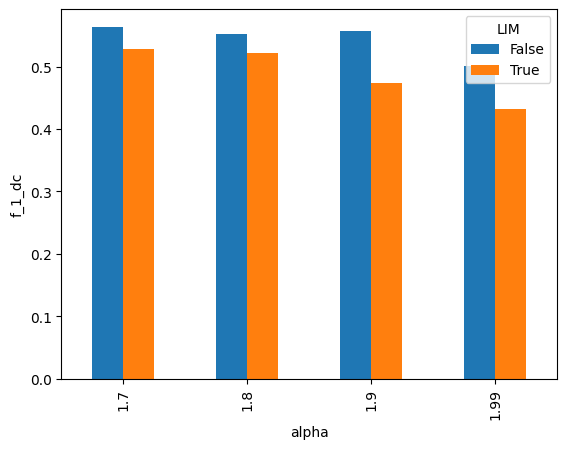

In [80]:
metric = 'f_1_dc'
display_bins_metric(res_eval, keys[::-1], metric, rolling_average=3, max=True)

## CIFAR10 - LIM vs DDPM

I haven;t evaluated CIFAR10 yet...

In [ ]:
data_eval, data_losses, data_models = load_dataframe('models/cifar10', 'cifar10', do_not_load_model=True)

if (data_eval['eval_freq'].isnull()).any():
    data_eval['eval_freq'] = 1
if (data_losses['eval_freq'].isnull()).any():
    data_losses['eval_freq'] = 1

res_eval, res_losses = aggregate_dataframes(data_eval, data_losses, data_models, agg_list=['alpha', 'LIM'])
res_eval = res_eval.fillna(0)
res_losses = res_losses.fillna(0)

res_eval = res_eval[res_eval['alpha'] != 2.]
res_losses = res_losses[res_losses['alpha'] != 2.]

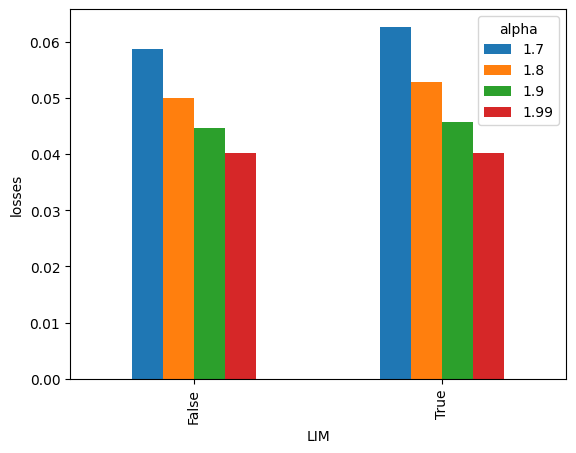

In [83]:
keys = ['LIM', 'alpha'][::1]
metric = 'losses'
display_bins_metric(res_losses, keys[::1], metric, rolling_average=3, max=False)

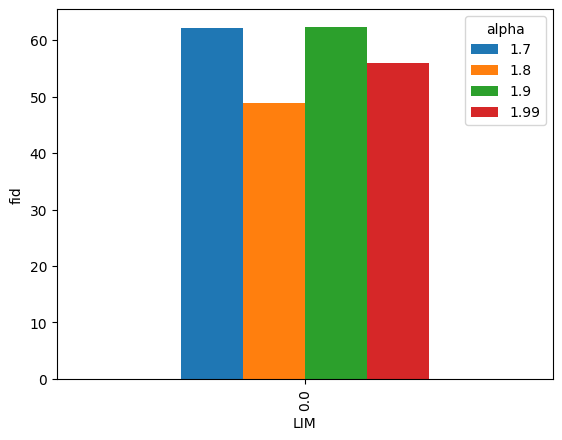

In [84]:
keys = ['LIM', 'alpha'][::1]
metric = 'fid'
display_bins_metric(res_eval, keys[::1], metric, rolling_average=3, max=False)

## Generation

In [ ]:
# change some of the experiment parameters
exp = data_models['experiment'].iloc[0]

In [ ]:
exp.save()

('models/ddpm/cifar10/model_b4c076fdd8577ad9.pt',
 'models/ddpm/cifar10/parameters_b4c076fdd8577ad9.pt',
 'models/ddpm/cifar10/eval_b4c076fdd8577ad9.pt')

In [ ]:

# we want to modify the diffusion
from DDLM.manage.exp_utils.prepare_utils import init_diffusion_by_parameter
exp.p['diffusion']['clamp_a'] = 2000
exp.p['diffusion']['clamp_eps'] = 20000
exp.manager.diffusion = init_diffusion_by_parameter(exp.p)

In [ ]:
gen_model = generate_samples(data_models, 
                             (data_models['alpha'] == data_models['alpha']), 
                             num_samples = 32, 
                            ddim = False,
                            eta = 0., # used only if ddim
                            reduce_timesteps = 1., # divide by reduce_timesteps
                            new_time_spacing = 'linear', # linear or quadratic
                            print_progression=True, 
                            use_samples = None,
                            get_sample_history = False,
                            clip_denoised = True)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████▉| 999/1000 [01:42<00:00,  9.77it/s]


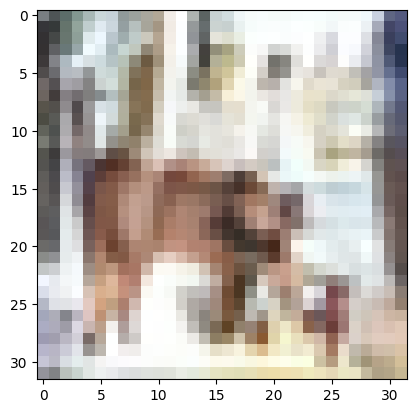

In [ ]:
gen_model.get_image(idx = 0, black_and_white=False)

# Legacy Experiments

## $L_p$ norm

## visualize

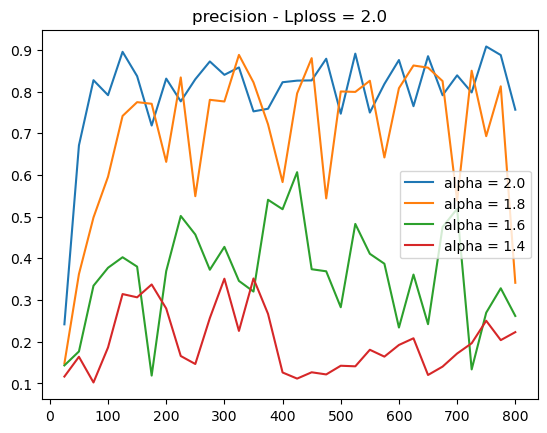

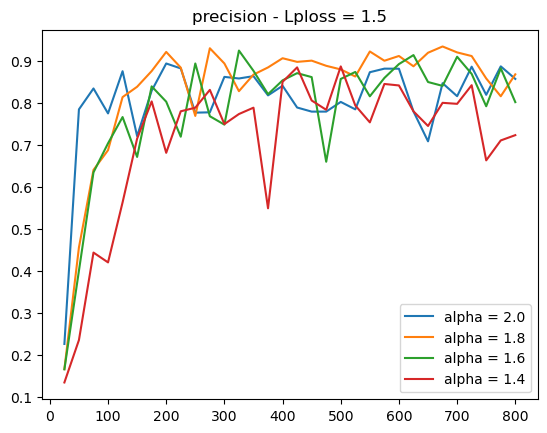

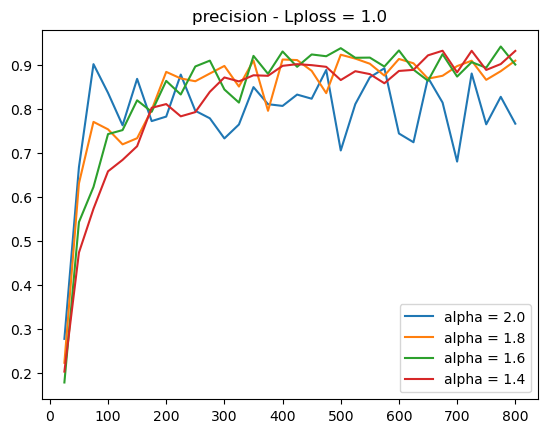

In [ ]:
display(data_eval_lp, 'Lploss', 'alpha', 'precision')

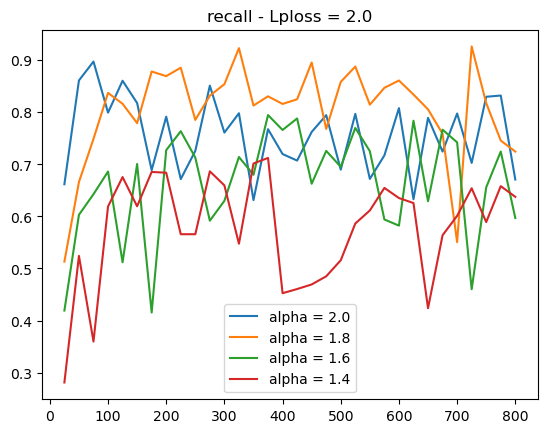

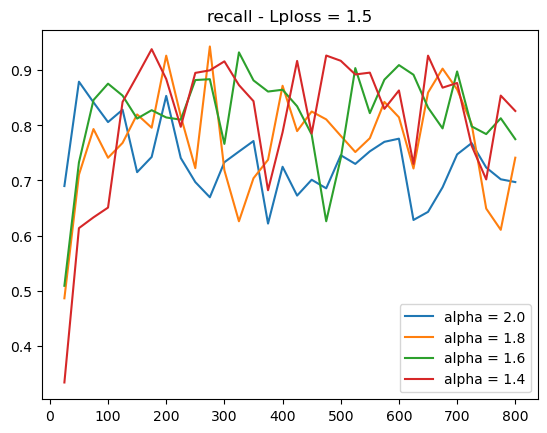

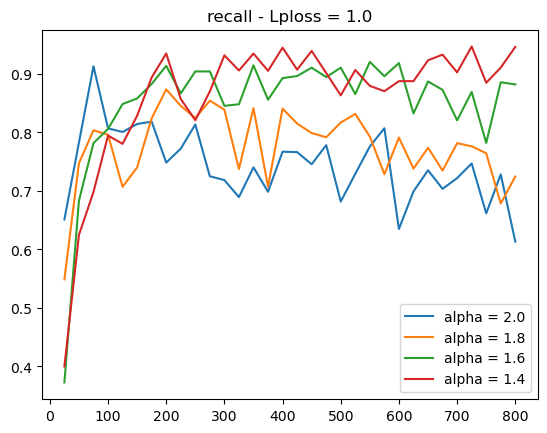

In [ ]:
display(data_eval_lp, 'Lploss', 'alpha', 'recall')

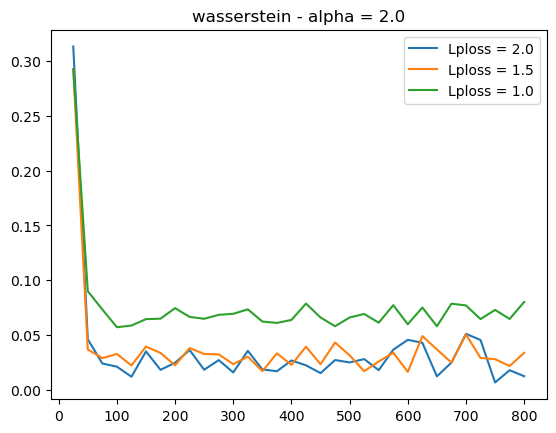

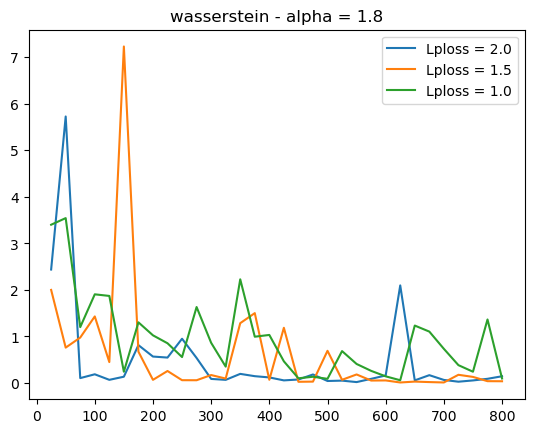

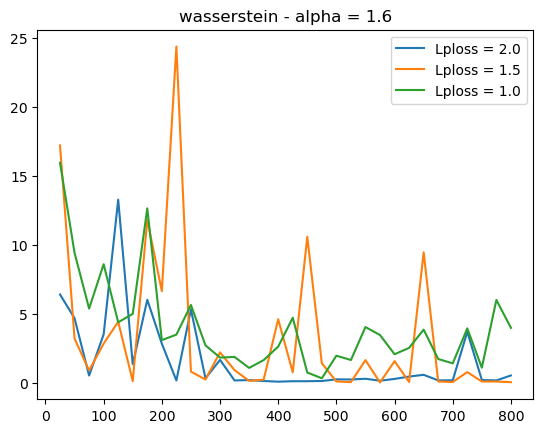

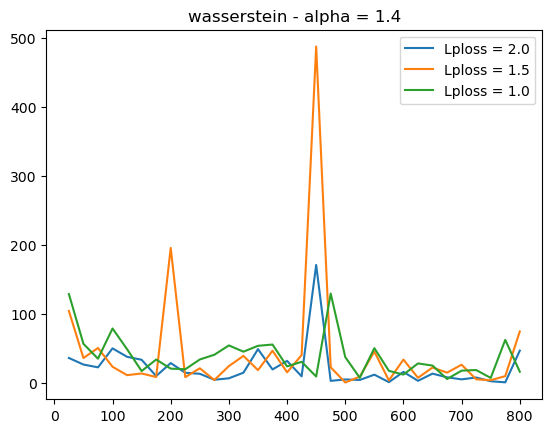

In [ ]:
display(data_eval_lp, 'alpha', 'Lploss', 'wasserstein')

## Class Imbalance

In [ ]:
np.bincount([0, 1, 1, 0, 0, 0, 4, 4, 4, 2])

array([4, 2, 1, 0, 3])

In [ ]:
from sklearn.cluster import KMeans


def approx_class_imbalance_grid(kmeans, gen_model, n_runs, n_samples = 2000):
    # classifiy with initial data
    # generate new data, predict, compare number of labels

    L = []
    for i in range(n_runs):
        gen_model.generate(n_samples, print_progression = False)
        pred = kmeans.predict(gen_model.samples)
        pred_weights = np.bincount(pred) / n_samples
        L.append(pred_weights)

    '''def aux(samples):
        kmeans = KMeans(n_clusters=9, random_state=0, init='k-means++', n_init = 1)
        kmeans.fit(samples)
        labels = kmeans.labels_
        counts = np.bincount(labels)
        total_points = samples.size()[0]
        weights = (counts / total_points)
        weights.sort()
        return weights
    L = []
    for i in range(n_runs):
        gen_model.generate(n_samples, print_progression = False)
        L.append(aux(gen_model.samples))'''
    
    return np.array(L)

def class_imbalance_table_grid(n_runs = 10, n_samples = 2000):
    table = pd.DataFrame(data = {})
    kmeans = KMeans(n_clusters=9, random_state=0, init='k-means++', n_init = 1)
    some_data = data_models_lp['manager'].iloc[0].data
    kmeans.fit(some_data)
    true_weights = np.bincount(kmeans.labels_) / len(some_data)
    print(true_weights)
    for l in data_eval_lp['Lploss'].unique():
        for a in data_eval_lp['alpha'].unique():
            print(l, a)
            cond = (data_models_lp['Lploss'] == l) & (data_models_lp['alpha'] == a)
            gen_model = Gen.GenerationManager(data_models_lp[cond]['manager'].iloc[0].model, device, data_models_lp[cond]['manager'].iloc[0].data)
            L = approx_class_imbalance_grid(kmeans, gen_model, n_runs)
            m, s = np.mean(L, axis = 0), np.std(L, axis = 0)
            
            df = pd.DataFrame(data = {})
            df['Lploss'] = [l]
            df['alpha'] = [a]
            tmp = data_models_lp['weights'][0]
            tmp.sort()
            df['true_weights'] = [tmp]
            df['gen_mixture_weights'] = [m]
            df['std'] = [s]
            table = pd.concat([table, df])
    return table.reset_index(drop=True)

In [ ]:
tmp = class_imbalance_table_grid(n_runs = 1, n_samples = 10000)

[0.15005493 0.19992065 0.29992676 0.1499939  0.1000061  0.05004883
 0.02005005 0.01998901 0.01000977]
1.5 2.0
1.5 1.4
1.5 1.6
1.5 1.8
2.0 2.0
2.0 1.4
2.0 1.6
2.0 1.8
1.0 2.0
1.0 1.4
1.0 1.6
1.0 1.8


In [ ]:
def compute_norm(row):
    return np.linalg.norm(np.log(row['true_weights']) - np.log(row['gen_mixture_weights']), ord = 2) / row['true_weights'].size
    #return np.linalg.norm(row['true_weights'] / row['gen_mixture_weights'] - 1, ord = 2)


def compute_norm_1(row):
    return np.linalg.norm(np.log(row['true_weights']) - np.log(row['gen_mixture_weights']), ord = 1)/ row['true_weights'].size

tmp['dist'] = tmp.apply(compute_norm, axis = 1)
tmp['dist_L1'] = tmp.apply(compute_norm_1, axis = 1)


/var/folders/cw/l9hdz6994gsb5dfq6hclhzxc0000gn/T/ipykernel_1440/2417221640.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  tmp_2 = tmp.pivot('Lploss', 'alpha', 'dist')
/var/folders/cw/l9hdz6994gsb5dfq6hclhzxc0000gn/T/ipykernel_1440/2417221640.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  tmp_1 = tmp.pivot('Lploss', 'alpha', 'dist_L1')


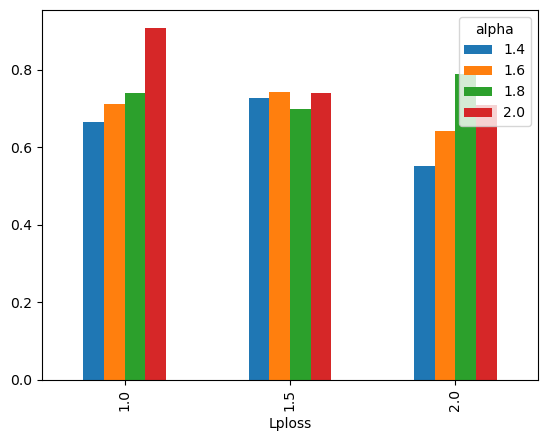

In [ ]:
tmp = tmp.sort_values(['Lploss', 'alpha'])
tmp_2 = tmp.pivot('Lploss', 'alpha', 'dist')
tmp_1 = tmp.pivot('Lploss', 'alpha', 'dist_L1')
tmp_2.plot(kind = 'bar')
#tmp_1.plot(kind = 'bar')
plt.show()

## generate

In [ ]:
gen_model.samples = torch.tensor([[0., 0.]])

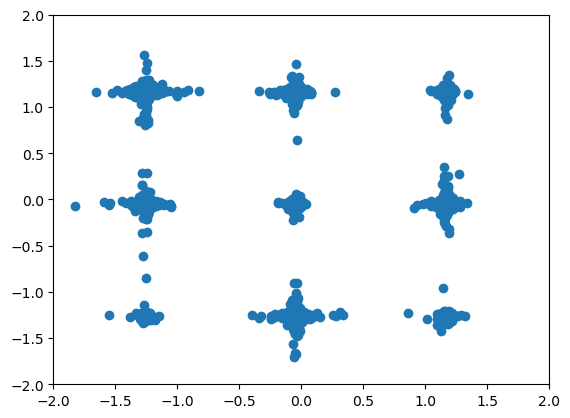

In [ ]:
plt.scatter(gen_model.original_data[:, 0], gen_model.original_data[:, 1])
plt.xlim((-2, 2))
plt.ylim((-2, 2))
plt.show()

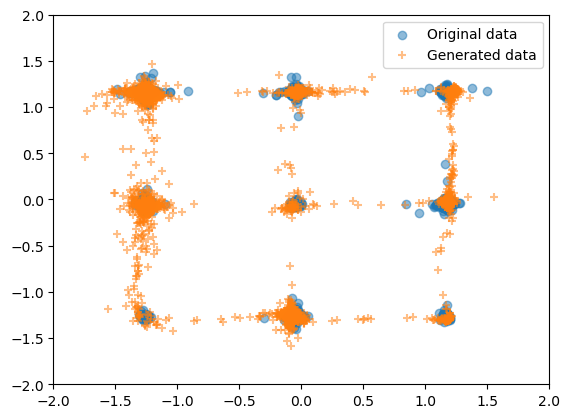

In [ ]:
cond = (data_models_lp['Lploss'] == 1.5) & (data_models_lp['alpha'] == 1.4)
gen_model = Gen.GenerationManager(data_models_lp[cond]['manager'].iloc[0].model, device, data_models_lp[cond]['manager'].iloc[0].data)
gen_model.generate(5000, print_progression=False)
gen_model.get_plot(xlim = (-2, 2), ylim = (-2, 2))

In [ ]:
data_eval_steps, data_losses_steps, data_models_steps = load_dataframe('models/12.01.24/steps/gmm_grid')
data_eval_heavy, data_losses_heavy, data_models_heavy = load_dataframe('models/12.01.24/heavy_tailed_data/sas_grid')
data_eval_imb, data_losses_imb, data_models_imb = load_dataframe('models/12.01.24/imbalance/gmm_2')

## Diffusion Steps

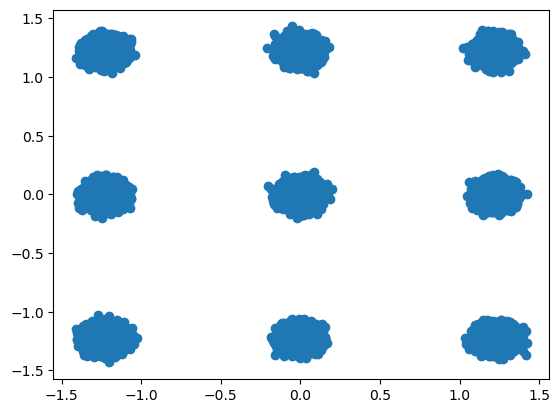

In [ ]:
cond = (data_eval_steps['alpha'] == 1.6)

tmp_data = data_eval_steps[cond]['manager'].iloc[0].data
plt.scatter(tmp_data[:, 0], tmp_data[:, 1])
plt.show()

gen_model = Gen.GenerationManager(data_eval_steps[cond]['manager'].iloc[0].model, device, data_eval_steps[cond]['manager'].iloc[0].data)

In [ ]:
gen_model.generate()
from IPython.display import display as disp
fig = gen_model.get_plot(xlim = (-3, 3), ylim = (-3, 3))
disp(fig)

100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 72.45it/s]


Fix diffusion steps and see evolution with alpha

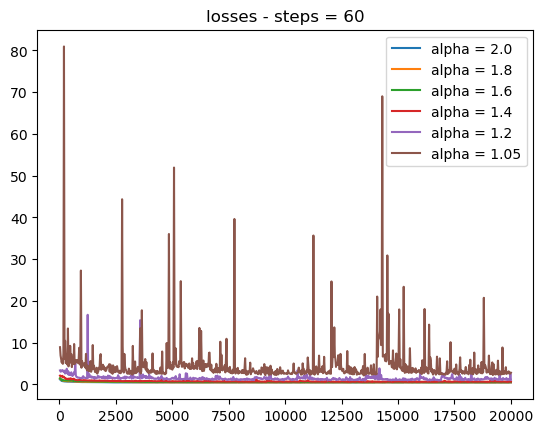

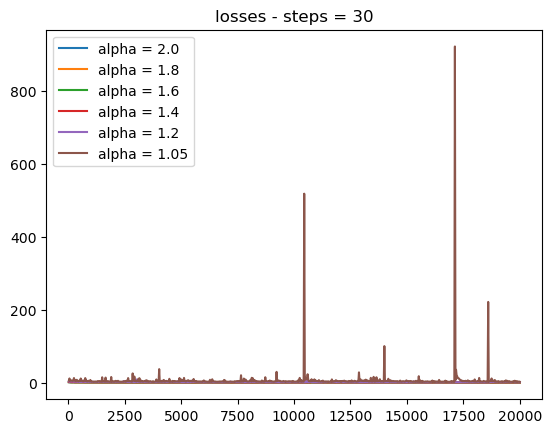

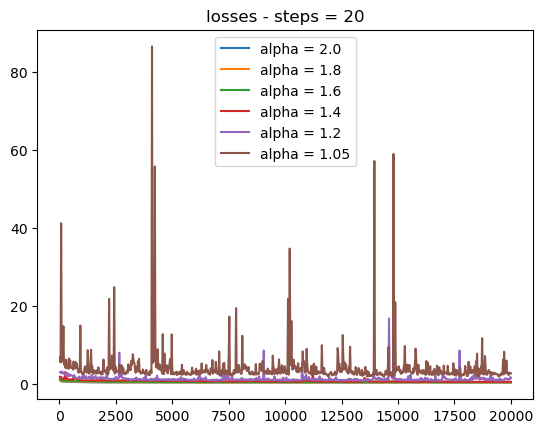

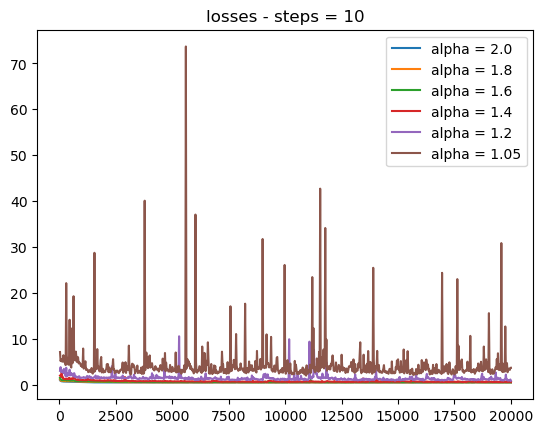

In [ ]:
display(data_losses_steps, 'steps', 'alpha', 'losses')

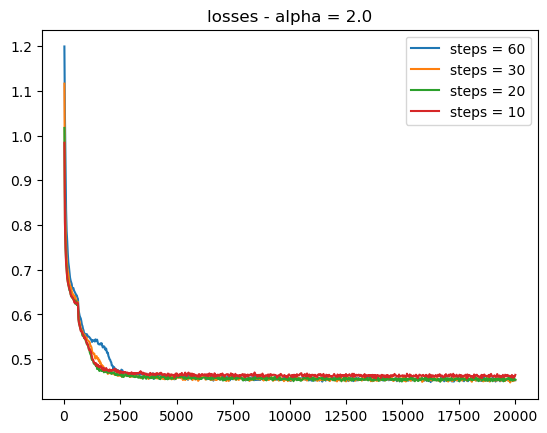

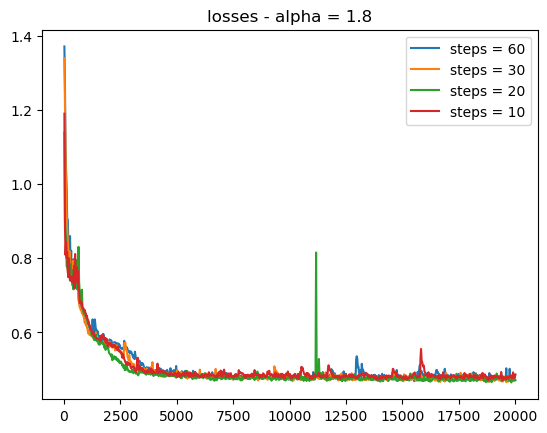

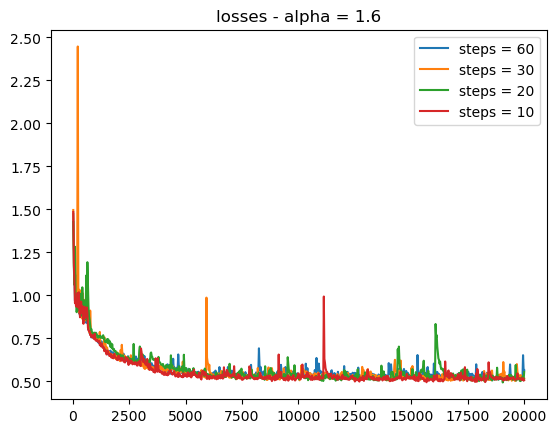

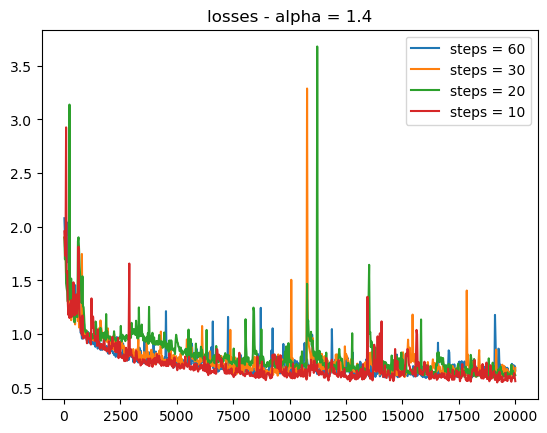

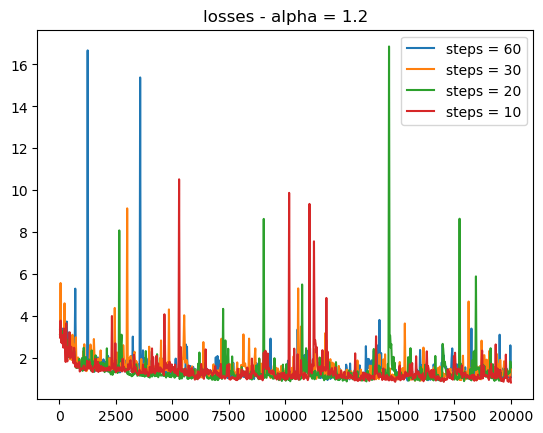

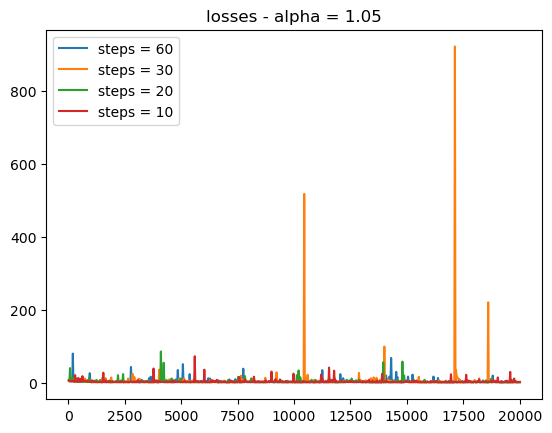

In [ ]:
display(data_losses_steps, 'alpha', 'steps', 'losses')

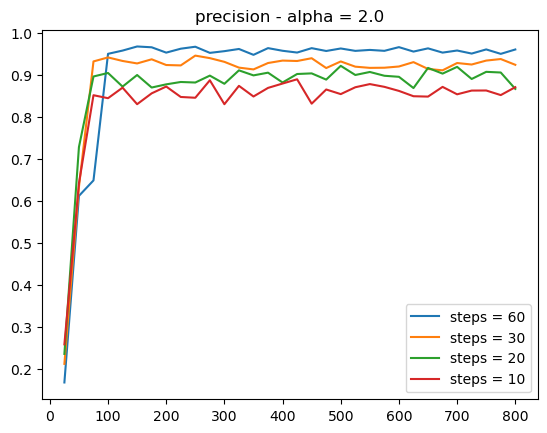

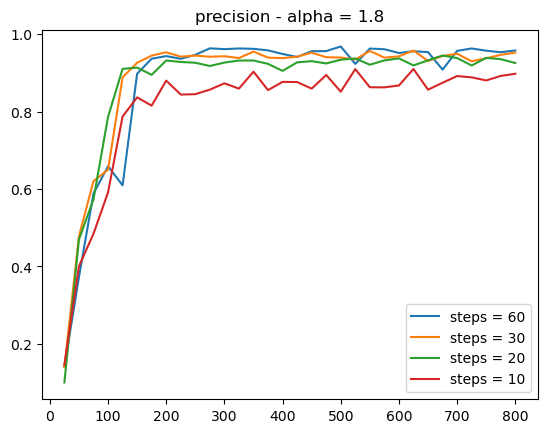

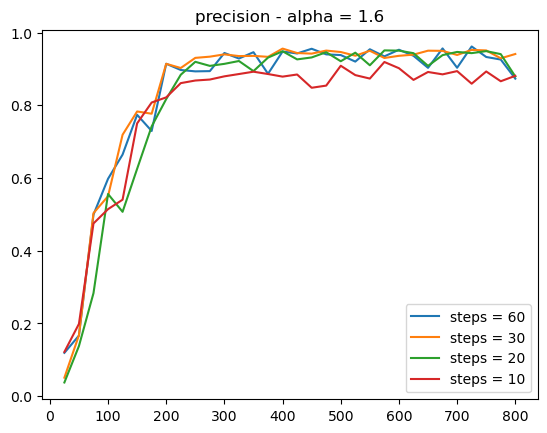

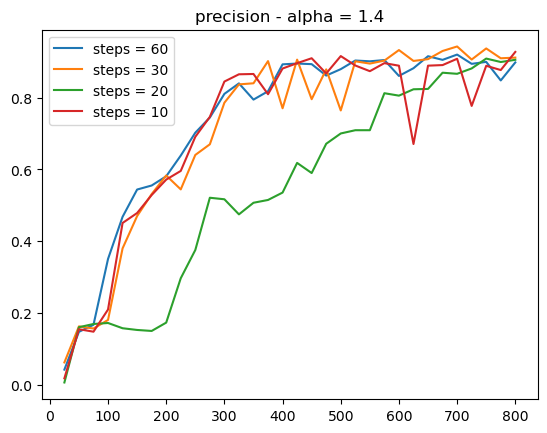

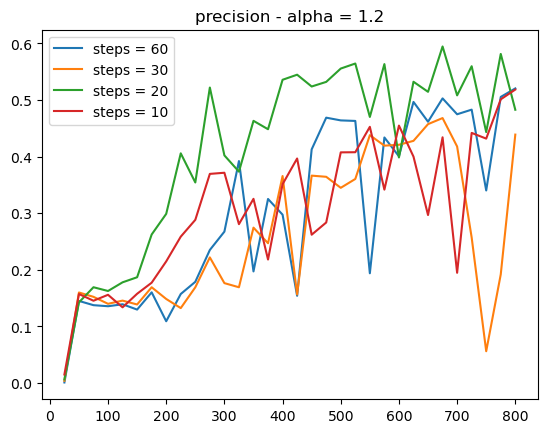

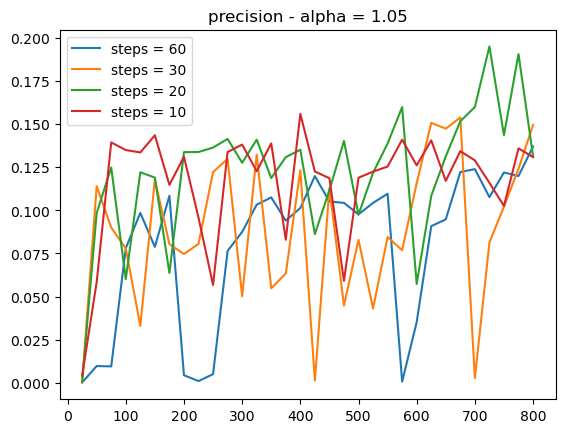

In [ ]:
display(data_eval_steps, 'alpha', 'steps', 'precision')

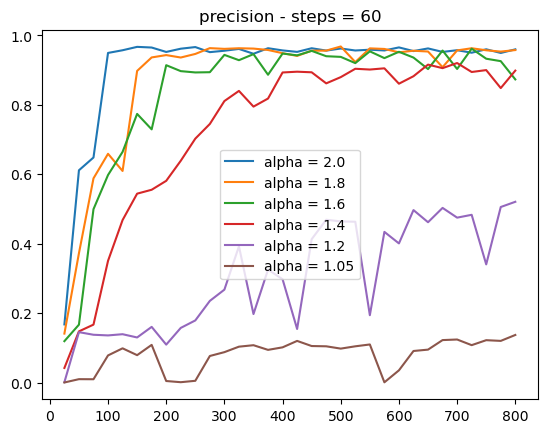

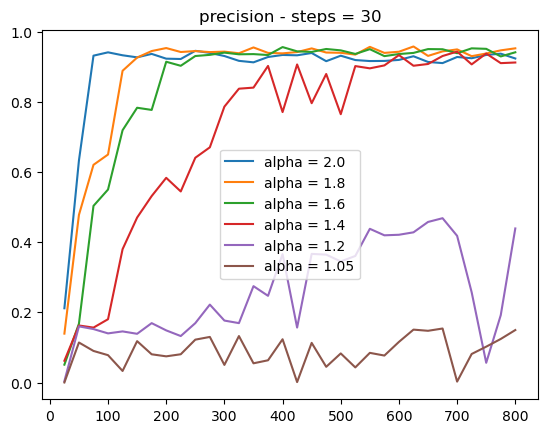

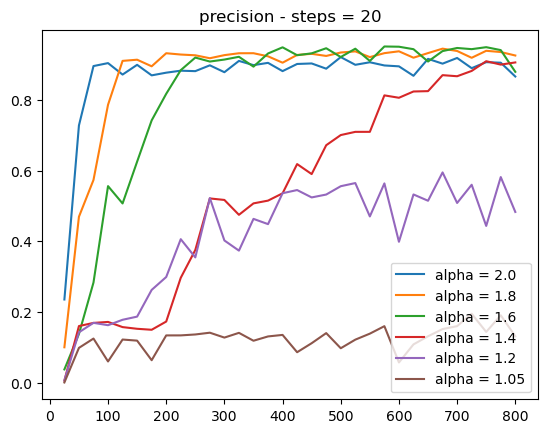

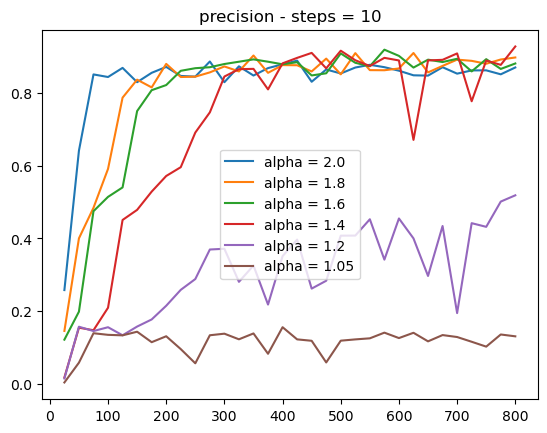

In [ ]:
display(data_eval_steps, 'steps', 'alpha', 'precision')

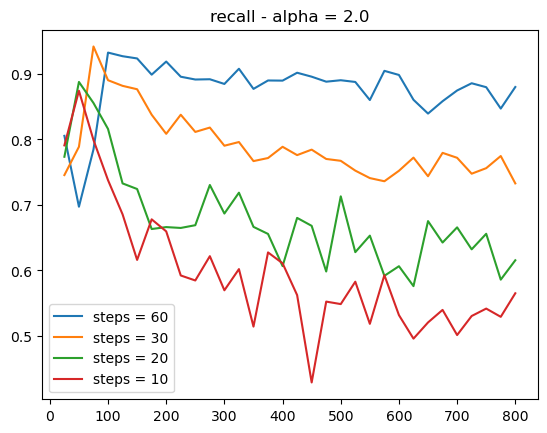

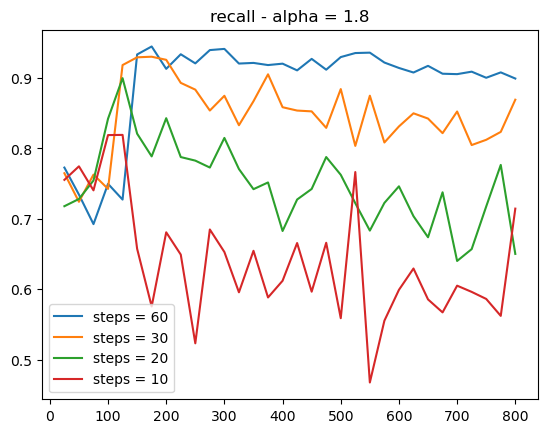

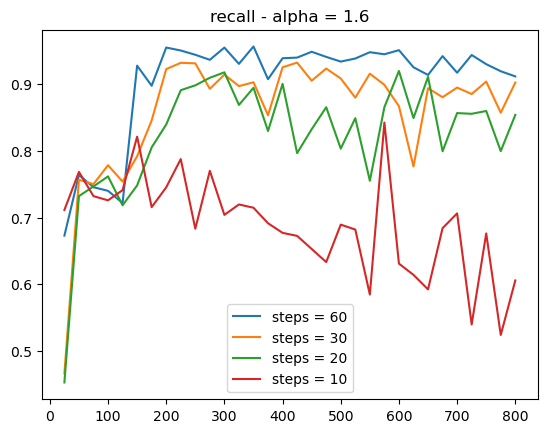

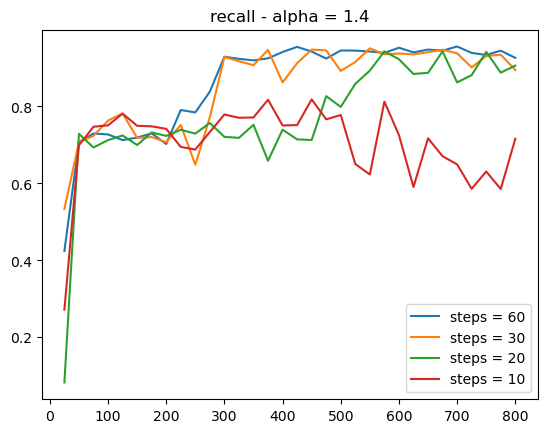

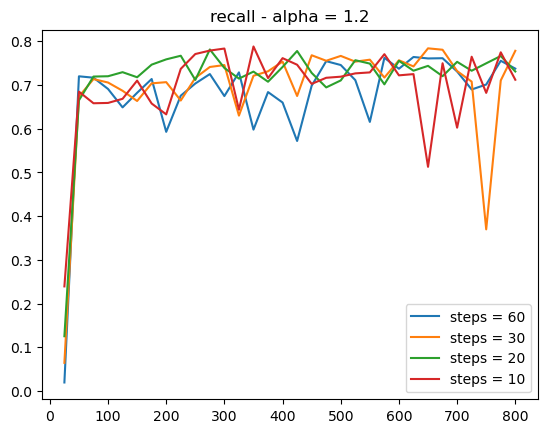

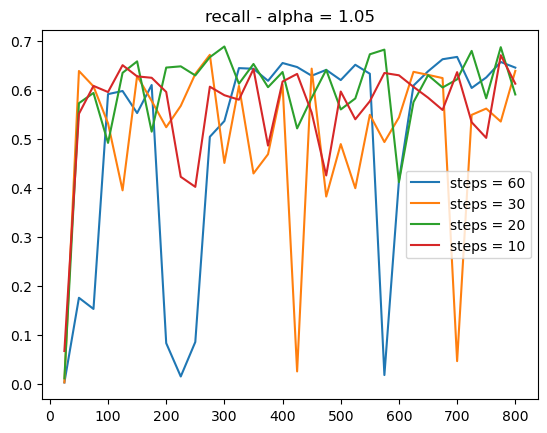

In [ ]:
display(data_eval_steps, 'alpha', 'steps', 'recall')

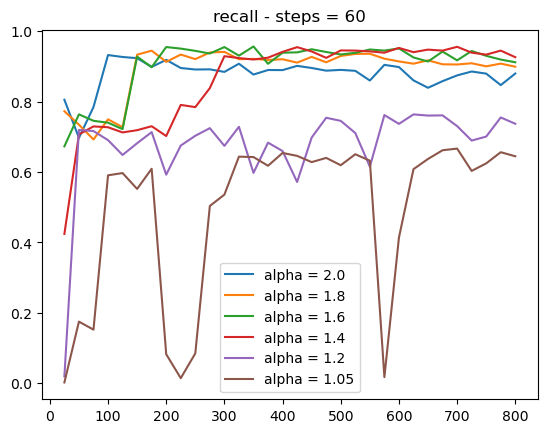

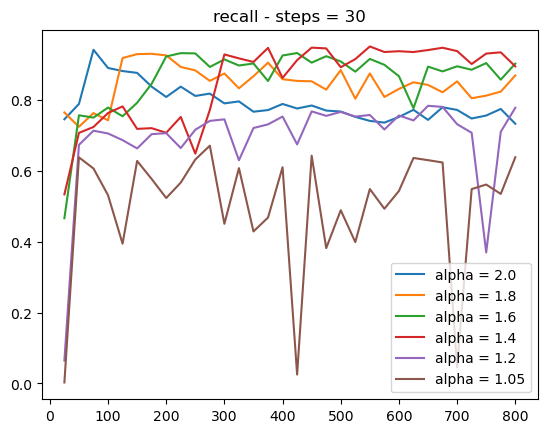

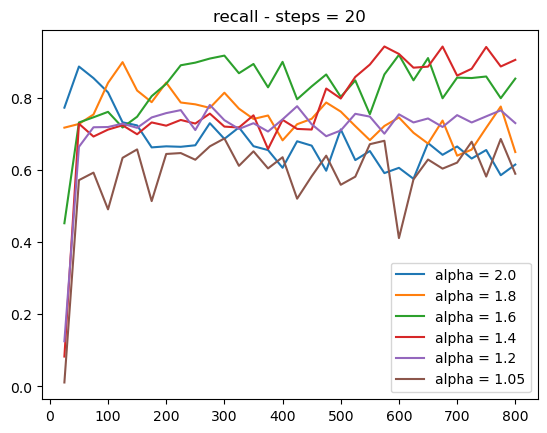

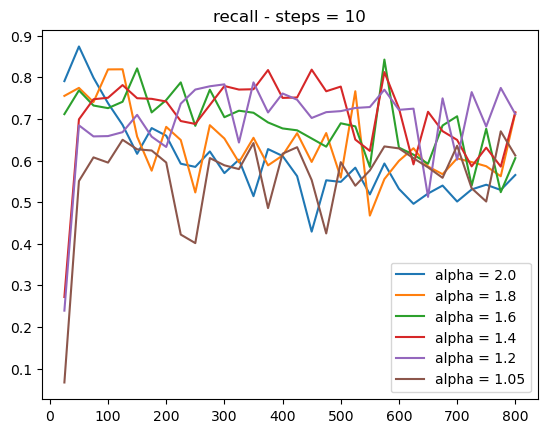

In [ ]:
display(data_eval_steps, 'steps', 'alpha', 'recall')

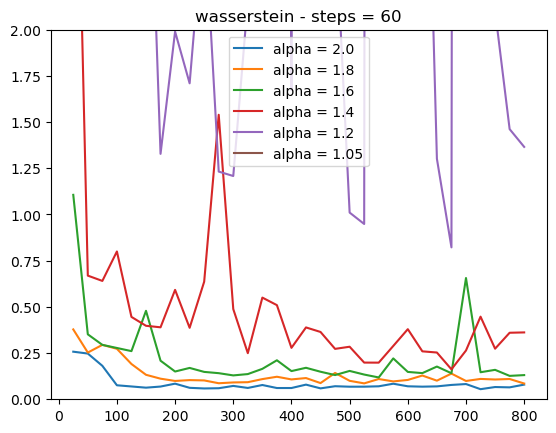

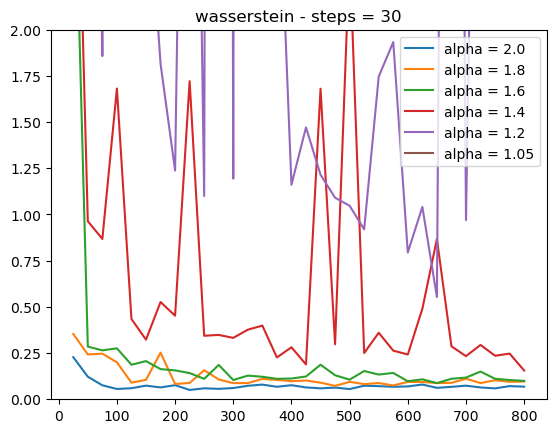

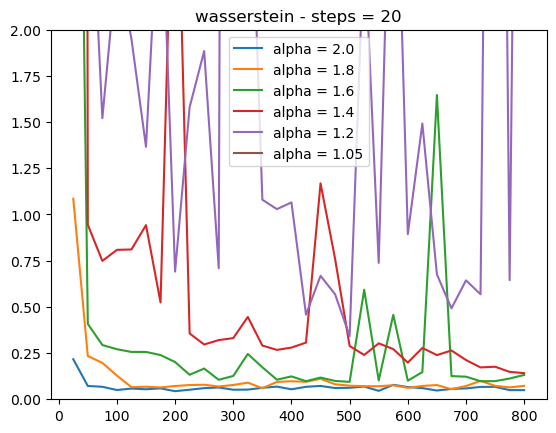

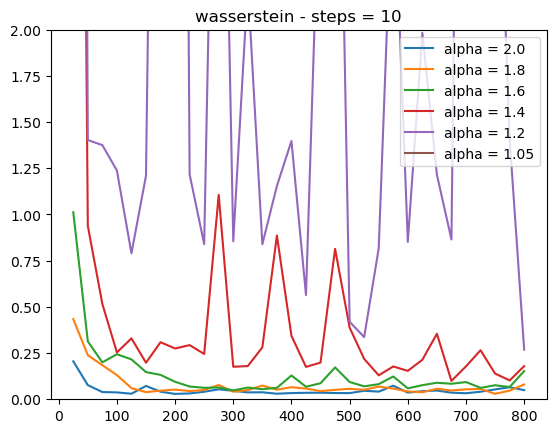

In [ ]:
display(data_eval_steps, 'steps', 'alpha', 'wasserstein', ylim = (0, 2))

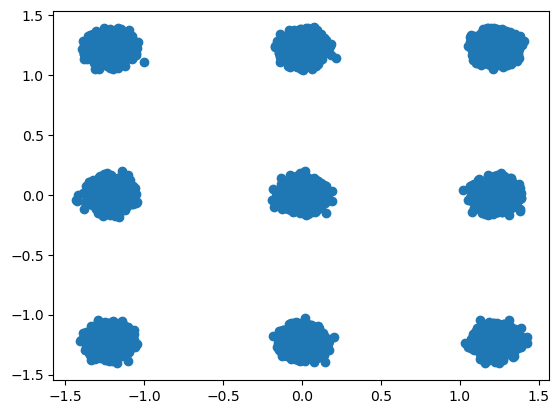

In [ ]:
cond = (data_eval_steps['alpha'] == 2.0) & (data_eval_steps['steps'] == 20)

tmp_data = data_eval_steps[cond]['manager'].iloc[0].data
plt.scatter(tmp_data[:, 0], tmp_data[:, 1])
plt.show()

gen_model = Gen.GenerationManager(data_eval_steps[cond]['manager'].iloc[0].model, device, data_eval_steps[cond]['manager'].iloc[0].data)

100%|███████████████████████████████████████████| 20/20 [00:00<00:00, 81.95it/s]


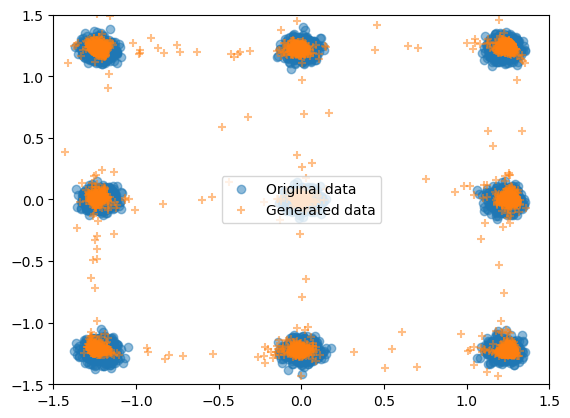

In [ ]:
gen_model.generate(5000)
from IPython.display import display as disp
fig = gen_model.get_plot(xlim = (-1.5, 1.5), ylim = (-1.5, 1.5))
disp(fig)

For $\alpha > 1.5$:
* better recall, especially with fewer diffusion steps
* similar precision
* but worse wasserstein distance

look at generated dataset.

## Class Imbalance

## Compute mixture weights of generated distribution

In [ ]:
def approx_class_imbalance(gen_model, n_runs, n_samples = 2000):
    def aux(samples):
        tmp = torch.where(samples[:,0] > 0.75)[0].size()[0]
        tmp_size = samples.size()[0]
        return tmp / tmp_size
    L = []
    for i in range(n_runs):
        gen_model.generate(n_samples, print_progression = False)
        L.append(aux(gen_model.samples))
    return np.array(L)

def class_imbalance_table(n_runs = 10, n_samples = 2000):
    table = pd.DataFrame(data = {})
    for w in data_eval_imb['weights'].unique():
        for a in data_eval_imb['alpha'].unique():
            print(w, a)
            cond = (data_models_imb['weights'] == w) & (data_models_imb['alpha'] == a)
            gen_model = Gen.GenerationManager(data_models_imb[cond]['manager'].iloc[0].model, device, data_models_imb[cond]['manager'].iloc[0].data)
            L = approx_class_imbalance(gen_model, n_runs)
            m, s = np.mean(L), np.std(L)
            
            df = pd.DataFrame(data = {})
            df['mixture_weight'] = [w]
            df['alpha'] = [a]
            df['gen_mixture_weight'] = [m]
            df['std'] = [s]
            table = pd.concat([table, df])
    return table.reset_index(drop=True)

In [ ]:
table_imbalance = class_imbalance_table(10, 2000)

In [ ]:
table_imbalance = table_imbalance.rename(columns = {'mixture_weight':'weights', 'std':'gen_mixture_std'})
tmp = table_imbalance.sort_values(['weights', 'alpha'], ascending = False).groupby(['alpha', 'weights']).last()
tmp_2 = data_eval_imb.groupby(['alpha', 'weights']).last()
pd.merge(tmp, tmp_2, on=['alpha','weights'])

gen_mixture_weight  gen_mixture_std  precision    recall  \
alpha weights                                                             
1.05  0.01                0.06750         0.004544   0.511084  0.892292   
      0.10                0.19865         0.009042   0.203563  0.695494   
      0.50                0.43465         0.012554   0.073116  0.370084   
1.20  0.01                0.03735         0.004353   0.783529  0.925632   
      0.10                0.15235         0.011149   0.282851  0.734489   
      0.50                0.47320         0.011165   0.638814  0.924415   
1.40  0.01                0.01855         0.002631   0.880809  0.953348   
      0.10                0.12845         0.004666   0.928211  0.956884   
      0.50                0.49040         0.010920   0.942664  0.971387   
1.60  0.01                0.00980         0.002027   0.971667  0.946305   
      0.10                0.11045         0.005747   0.962853  0.962293   
      0.50                0.49370         0.012180   0.970010  0.954366   
1.80  0.01                0.00970         0.001749   0.975128  0.944552   
      0.10                0.08250         0.007589   0.976080  0.937670   
      0.50                0.49275         0.008931   0.972373  0.938197   
2.00  0.01                0.00555         0.001650   0.973023  0.920329   
      0.10                0.05220         0.003957   0.970874  0.908844   
      0.50                0.48960         0.015086   0.965057  0.878747   

               wasserstein  steps   act  diffusion_steps  nblocks  nunits  \
alpha weights                                                               
1.05  0.01        4.979994     60  silu               60        4      64   
      0.10      486.621614     60  silu               60        4      64   
      0.50       10.234870     60  silu               60        4      64   
1.20  0.01        2.688078     60  silu               60        4      64   
      0.10        2.269116     60  silu               60        4      64   
      0.50       22.501053     60  silu               60        4      64   
1.40  0.01        0.464569     60  silu               60        4      64   
      0.10        0.352964     60  silu               60        4      64   
      0.50        0.263466     60  silu               60        4      64   
1.60  0.01        0.023356     60  silu               60        4      64   
      0.10        0.048927     60  silu               60        4      64   
      0.50        0.078612     60  silu               60        4      64   
1.80  0.01        0.017721     60  silu               60        4      64   
      0.10        0.036114     60  silu               60        4      64   
      0.50        0.030094     60  silu               60        4      64   
2.00  0.01        0.026459     60  silu               60        4      64   
      0.10        0.082000     60  silu               60        4      64   
      0.50        0.035257     60  silu               60        4      64   

               ...  nfeatures  nsamples  data_type   std  n_mixture  \
alpha weights  ...                                                    
1.05  0.01     ...          2     65536      gmm_2  0.05       None   
      0.10     ...          2     65536      gmm_2  0.05       None   
      0.50     ...          2     65536      gmm_2  0.05       None   
1.20  0.01     ...          2     65536      gmm_2  0.05       None   
      0.10     ...          2     65536      gmm_2  0.05       None   
      0.50     ...          2     65536      gmm_2  0.05       None   
1.40  0.01     ...          2     65536      gmm_2  0.05       None   
      0.10     ...          2     65536      gmm_2  0.05       None   
      0.50     ...          2     65536      gmm_2  0.05       None   
1.60  0.01     ...          2     65536      gmm_2  0.05       None   
      0.10     ...          2     65536      gmm_2  0.05       None   
      0.50     ...          2     65536      gmm_2

## Visualize

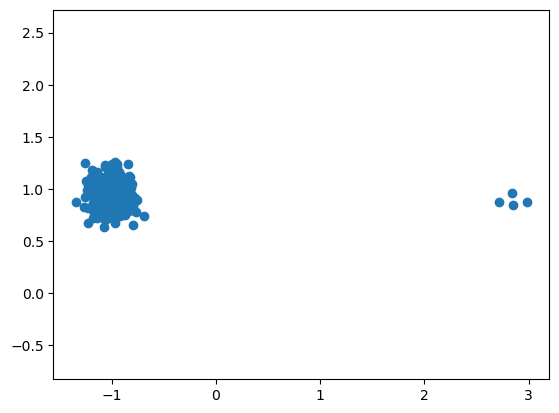

In [ ]:
cond = (data_models_imb['weights'] == 0.01) & (data_models_imb['alpha'] == 1.8)

tmp_data = data_models_imb[cond]['manager'].iloc[0].data[:500]
plt.scatter(tmp_data[:, 0], tmp_data[:, 1])
plt.axis('equal')
#plt.gca().set_aspect('equal')
#plt.xlim((-2.5, 2.5))
#plt.ylim((-2, 2))
plt.show()

gen_model = Gen.GenerationManager(data_models_imb[cond]['manager'].iloc[0].model, device, data_models_imb[cond]['manager'].iloc[0].data)

100%|██████████████████████████████████████████| 60/60 [00:00<00:00, 102.47it/s]


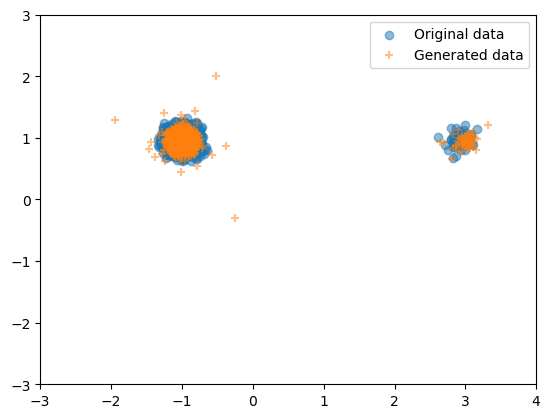

In [ ]:
gen_model.generate(5000)
from IPython.display import display as disp
fig = gen_model.get_plot(xlim = (-3, 4), ylim = (-3, 3))
disp(fig)

In [ ]:
L = approx_class_imbalance(gen_model, 10)
np.mean(L), np.std(L)

(0.08, 0.004024922359499621)

Mixture de deux Gaussian

## Losses

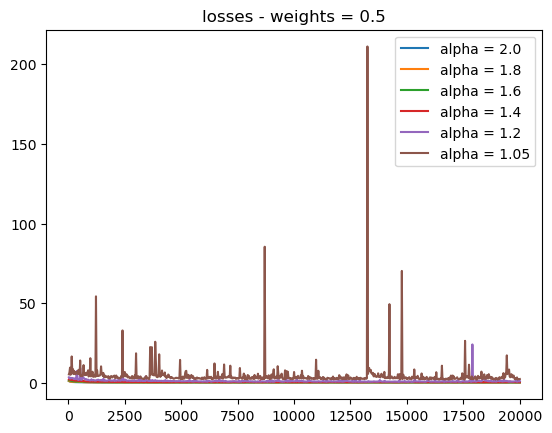

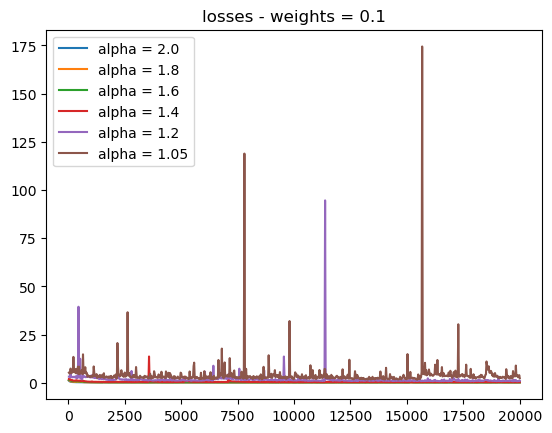

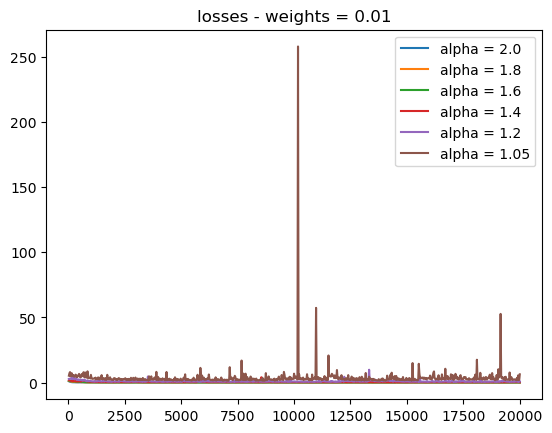

In [ ]:
display(data_losses_imb, 'weights', 'alpha', 'losses')

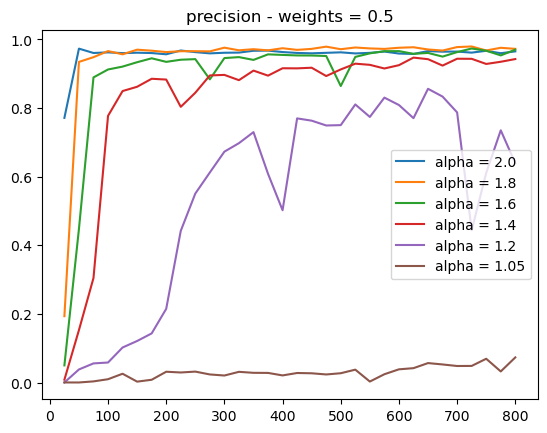

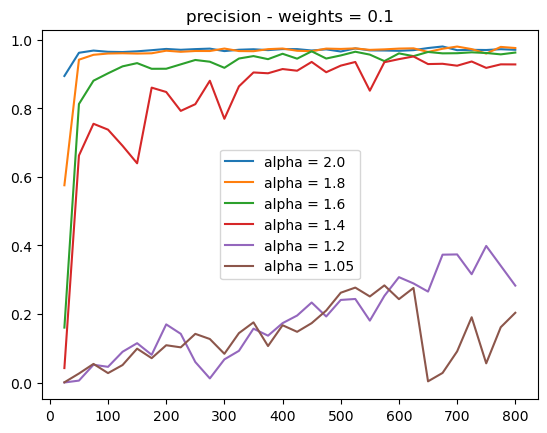

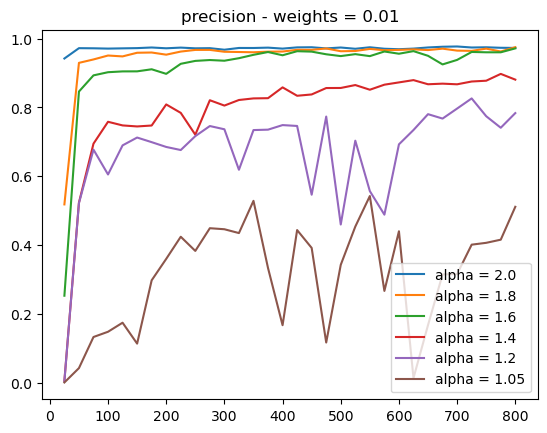

In [ ]:
display(data_eval_imb, 'weights', 'alpha', 'precision')

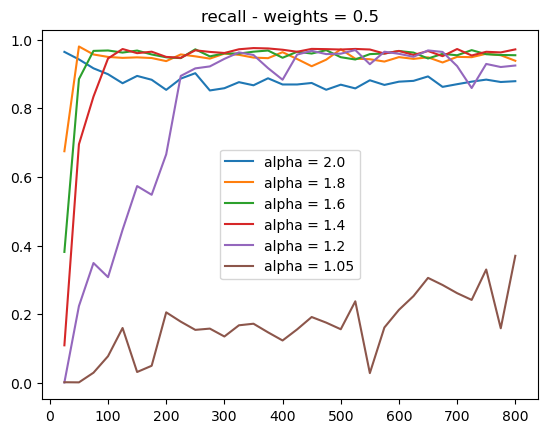

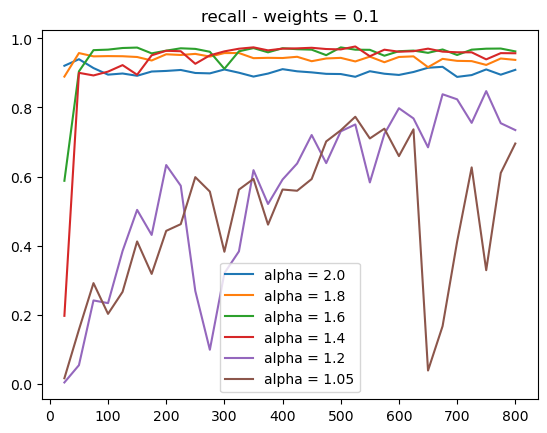

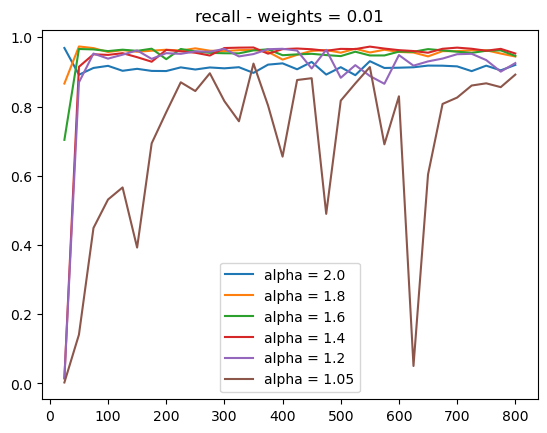

In [ ]:
display(data_eval_imb, 'weights', 'alpha', 'recall')

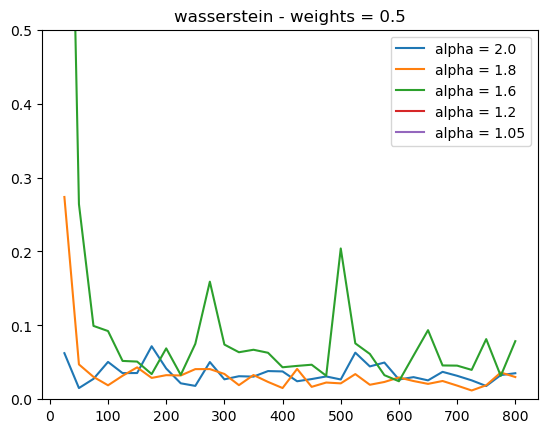

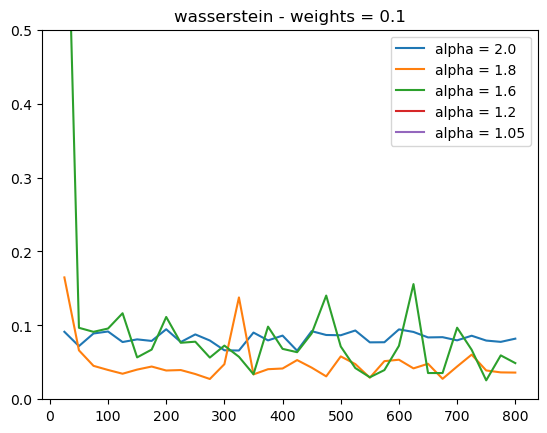

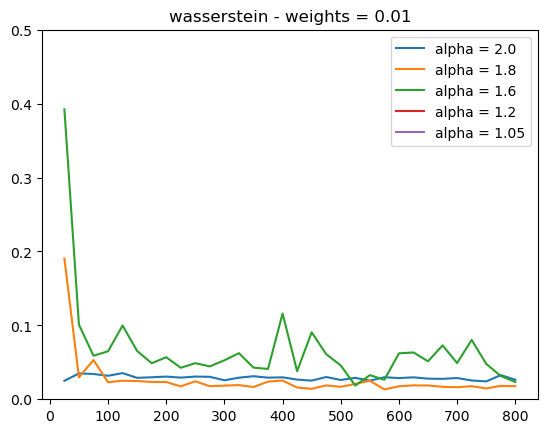

In [ ]:
display(data_eval_imb[data_eval_imb['alpha'] != 1.4], 'weights', 'alpha', 'wasserstein', ylim = (0, .5))

## Ok seems interesting

## Heavy Tailed Data

In [ ]:
data_eval_heavy, data_losses_heavy = load_dataframe('models/tmp/heavy_tailed_data/sas_grid')

In [ ]:
cond = (data_eval_heavy['alpha'] == 1.8) & (data_eval_heavy['std'] == 0.01)

tmp_data = data_eval_heavy[cond]['manager'].iloc[0].data[:]
plt.scatter(tmp_data[:, 0], tmp_data[:, 1])
#plt.axis('equal')
#plt.gca().set_aspect('equal')
plt.xlim((-2.5, 2.5))
plt.ylim((-2, 2))
plt.show()

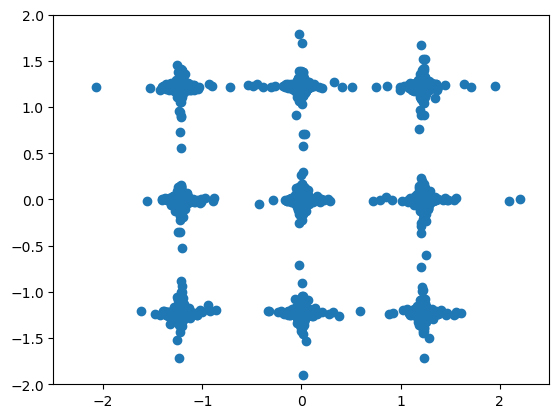

In [ ]:
gen_model = Gen.GenerationManager(data_eval_heavy[cond]['manager'].iloc[0].model, device, data_eval_heavy[cond]['manager'].iloc[0].data)
gen_model.generate()
from IPython.display import display as disp
fig = gen_model.get_plot(xlim = (-3, 3), ylim = (-3, 3))
disp(fig)

9 mixture alpha stable

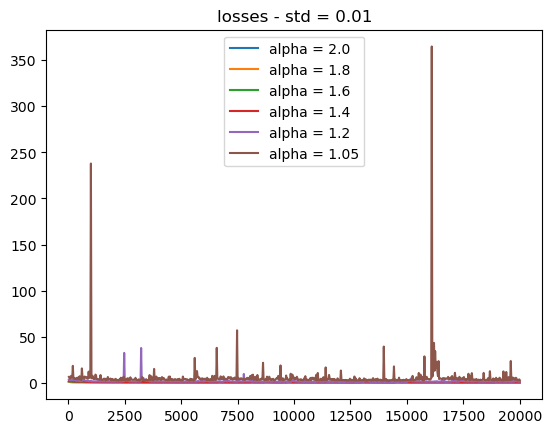

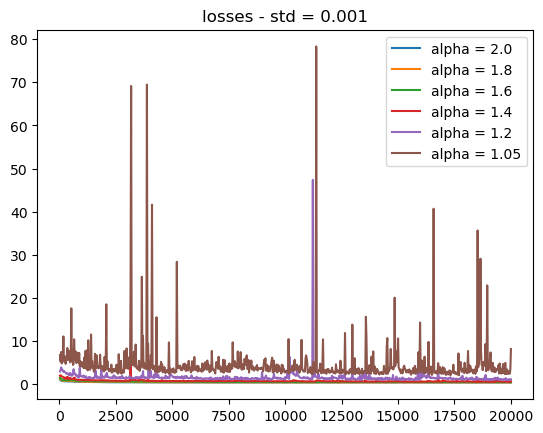

In [ ]:
display(data_losses_heavy, 'std', 'alpha', 'losses')

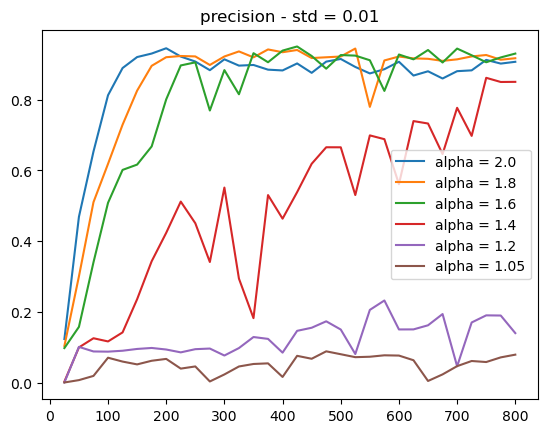

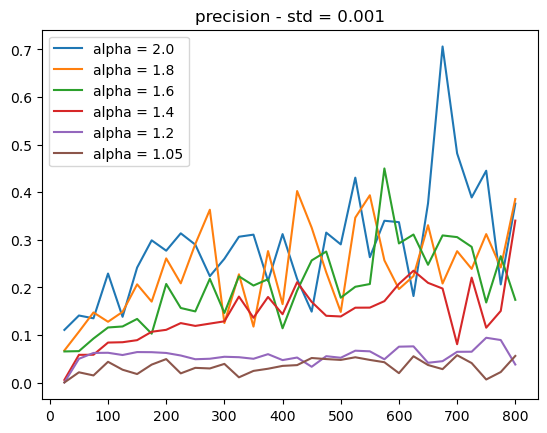

In [ ]:
display(data_eval_heavy, 'std', 'alpha', 'precision')

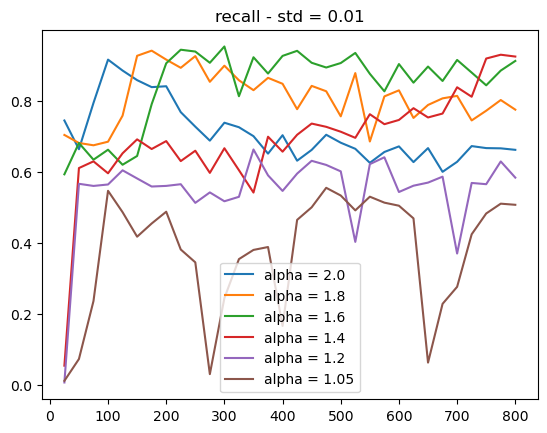

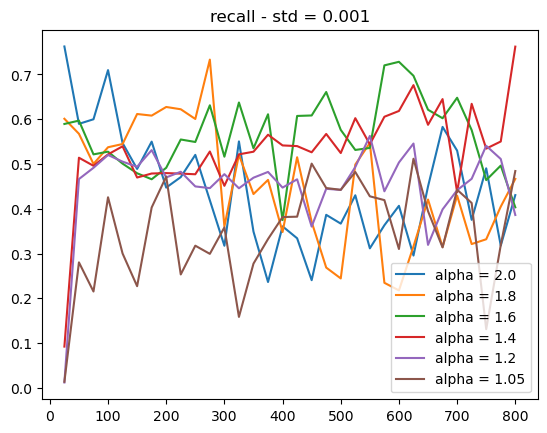

In [ ]:
display(data_eval_heavy, 'std', 'alpha', 'recall')

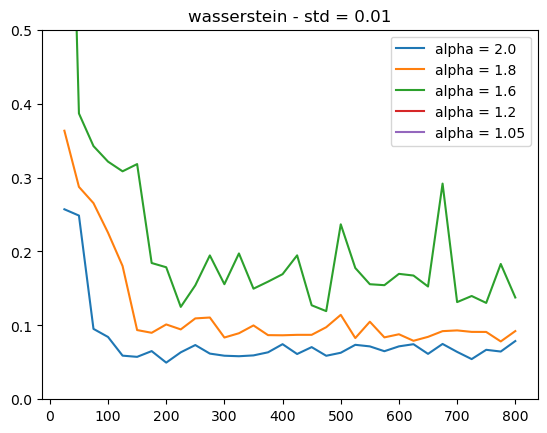

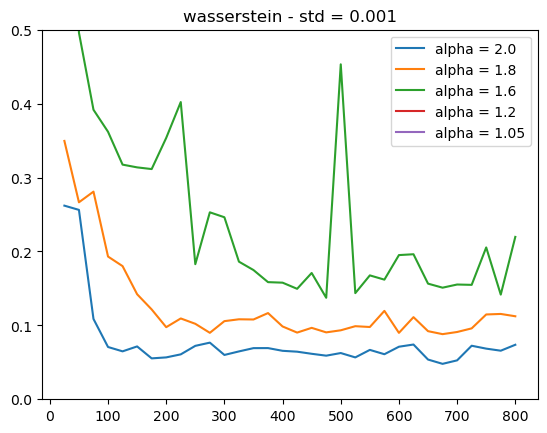

In [ ]:
display(data_eval_heavy[data_eval_heavy['alpha'] != 1.4], 'std', 'alpha', 'wasserstein',  ylim = (0, .5))

In [ ]:
cond = (data_eval_heavy['alpha'] == 1.8) & (data_eval_heavy['std'] == 0.01)

/var/folders/cw/l9hdz6994gsb5dfq6hclhzxc0000gn/T/ipykernel_17346/1326973725.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  gen_model = Gen.GenerationManager(data_models_heavy[cond]['manager'].iloc[0].model, device, data_models_heavy[cond]['manager'].iloc[0].data)
100%|██████████████████████████████████████████| 60/60 [00:00<00:00, 102.33it/s]


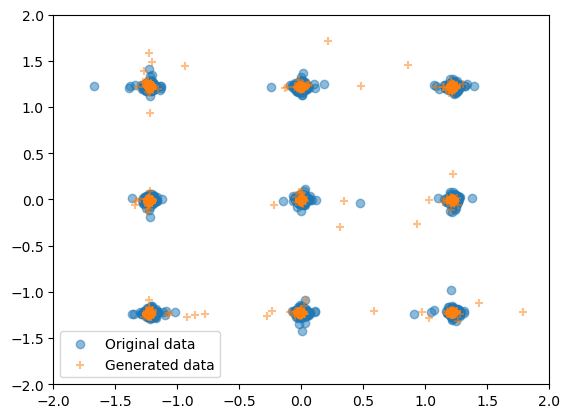

In [ ]:
gen_model = Gen.GenerationManager(data_models_heavy[cond]['manager'].iloc[0].model, device, data_models_heavy[cond]['manager'].iloc[0].data)
gen_model.generate(5000)
from IPython.display import display as disp
fig = gen_model.get_plot(xlim = (-2, 2), ylim = (-2, 2))
disp(fig)

I think I am doing 2-wasserstein; plus the few points far from the centre of distribution worsen the metric a lot, and this is smthing we see less on precision or recall (underlying computation involves a few k means clusters).

## better recall and precision 

## Various experimentations (Bonus)

## Monte Carlo

### mean vs median

The loss function is 
$$ \mathbb{E}_{x_0, \epsilon_t, a'} \| \epsilon_t - \epsilon_{\theta}(x_t) \| =
\mathbb{E}_{x_0, z_t}  \mathbb{E}_{a'} \| \sqrt(a_t)z_t - \epsilon_{\theta}(x_t) \|$$
where $x_t = \bar \gamma_t^{1 / \alpha} x_0 + \Sigma_t z_t$.
So the empirical loss can be written
$$ \frac{1}{N}\sum_{i = 1}^N \frac{1}{M}\sum_{j = 1}^M \| \sqrt(a_j^i)z^i - \epsilon_{\theta}(x^i_j) \| $$
So $M$ controls the number of Levy stable samples per pair of data sample and Gaussian noise. We call it $\texttt{monte_carlo_steps}.$

In [ ]:
data_eval, data_losses, data_models = load_dataframe('models/monte_carlo_fixed/gmm_2')

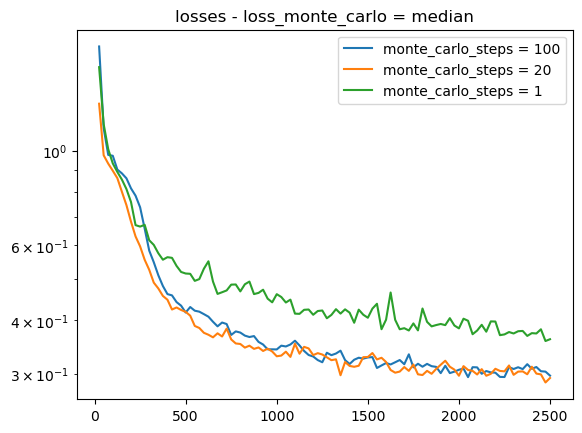

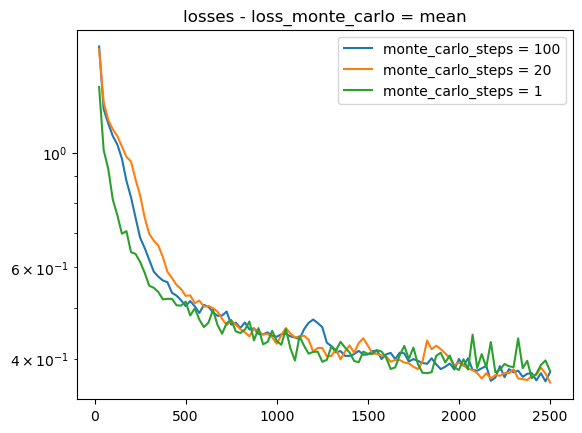

In [ ]:
display(data_losses, 'loss_monte_carlo', 'monte_carlo_steps', 'losses', log_scale=True)

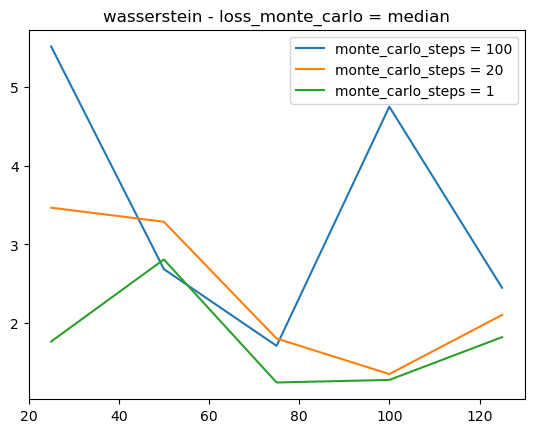

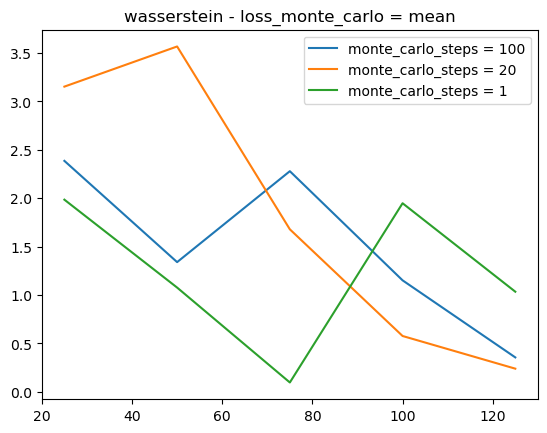

In [ ]:
display(data_eval, 'loss_monte_carlo', 'monte_carlo_steps', 'wasserstein', log_scale=False)

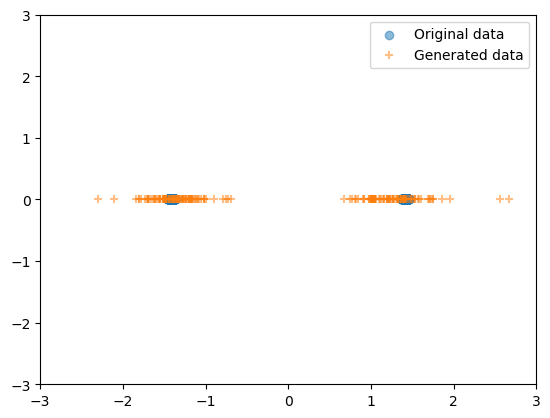

In [ ]:
lims = 3
monte_carlo_steps = 20 # Previous mean loss
loss_monte_carlo = 'mean'
gen_model = generate_samples(data_models, 
                             (data_models['monte_carlo_steps'] == monte_carlo_steps) 
                             & (data_models['loss_monte_carlo'] == loss_monte_carlo), 
                             num_samples=200, eta=1.)
gen_model.get_plot(xlim = (-lims, lims), ylim = (-lims, lims))

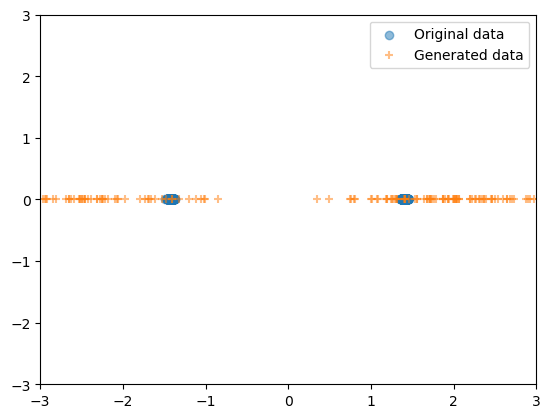

In [ ]:
lims = 3
monte_carlo_steps = 20 # Previous mean loss
loss_monte_carlo = 'median'
gen_model = generate_samples(data_models, 
                             (data_models['monte_carlo_steps'] == monte_carlo_steps) 
                             & (data_models['loss_monte_carlo'] == loss_monte_carlo), 
                             num_samples=200, eta=1.)
gen_model.get_plot(xlim = (-lims, lims), ylim = (-lims, lims))

### different median

In [ ]:
data_eval, data_losses, data_models = load_dataframe('models/monte_carlo_median/gmm_2')

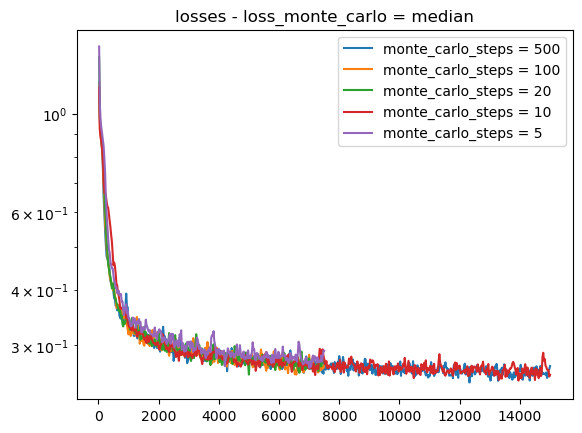

In [ ]:
display(data_losses, 'loss_monte_carlo', 'monte_carlo_steps', 'losses', log_scale=True)

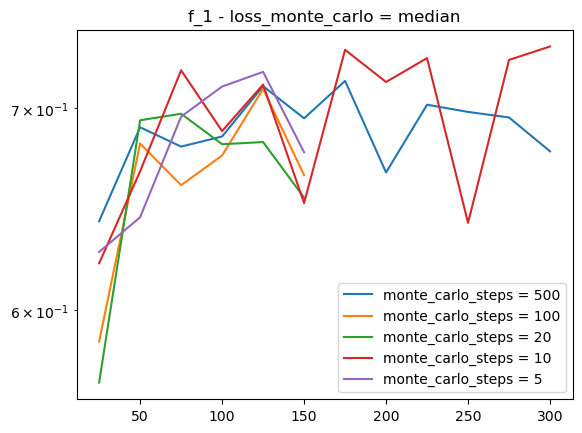

In [ ]:
display(data_eval, 'loss_monte_carlo', 'monte_carlo_steps', 'f_1', log_scale=True)

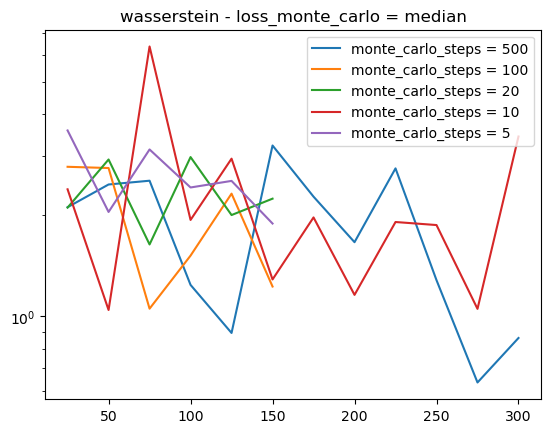

In [ ]:
display(data_eval, 'loss_monte_carlo', 'monte_carlo_steps', 'wasserstein', log_scale=True)

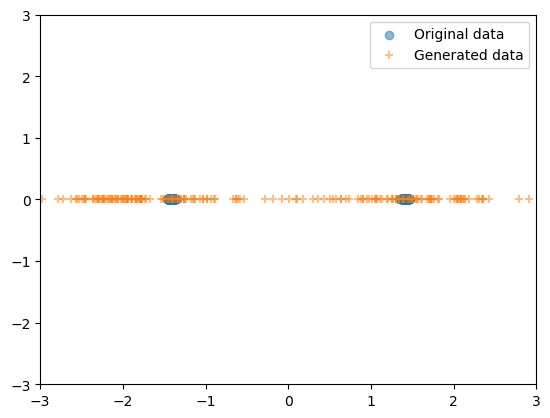

In [ ]:
lims = 3
monte_carlo_steps = 500 # Previous mean loss
loss_monte_carlo = 'median'
gen_model = generate_samples(data_models, 
                             (data_models['monte_carlo_steps'] == monte_carlo_steps) 
                             & (data_models['loss_monte_carlo'] == loss_monte_carlo), 
                             num_samples=200, eta=1.)
gen_model.get_plot(xlim = (-lims, lims), ylim = (-lims, lims))

## Loss type (lambda = 1 or lambda = kl)

Loss is either the original in the KL,
$$ \| \tilde{\mu}_{t-1} - \mu_{\theta}(x_t, t) \|^{2r} = |\lambda_t|^{2r} \| \epsilon_t - \epsilon_{\theta}(x_t, t) \|^{2r} $$
that we call $\texttt{'mean loss'}.$

Or we take only the $\texttt{'epsilon'}$ loss that makes the method similar to score matching:
$$ \| \epsilon_t - \epsilon_{\theta}(x_t, t) \| $$

* mean loss is lambda kl is 2
* epsilon loss is lambda = 1 is 3

In [ ]:
data_eval, data_losses, data_models = load_dataframe('models/loss_type/sas_grid')

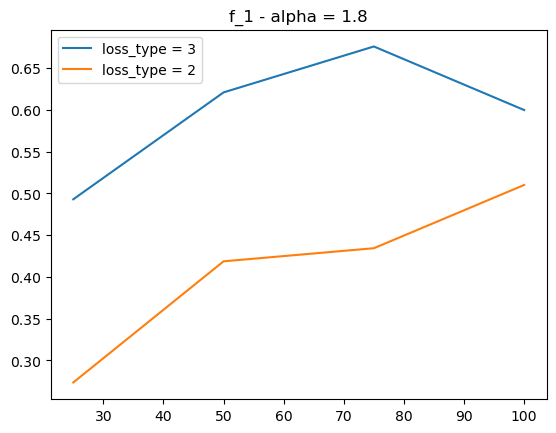

In [ ]:
display(data_eval, 'alpha', 'loss_type', 'f_1')

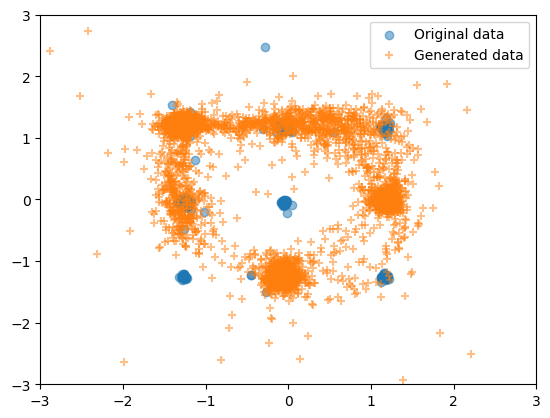

In [ ]:
lims = 3
loss_type = 2 # Previous mean loss
gen_model = generate_samples(data_models, (data_models['loss_type'] == loss_type), num_samples=5000, eta=1.)
gen_model.get_plot(xlim = (-lims, lims), ylim = (-lims, lims))

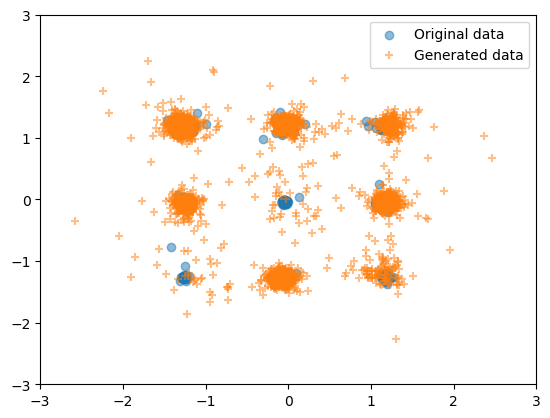

In [ ]:
lims = 3
loss_type = 3 # Epsilon loss
gen_model = generate_samples(data_models, (data_models['loss_type'] == loss_type), num_samples=5000, eta=1.)
gen_model.get_plot(xlim = (-lims, lims), ylim = (-lims, lims))

## Model outputs anterior mean or epsilon

We can choose for the model to output $\mu_{\theta}$ or $\epsilon_t$ regardless of the loss used afterwards. 

With no suprise $\epsilon_t$ works best once again.

* predict epsilon is 3
* predict true previous mean is 1

In [ ]:
data_eval, data_losses, data_models = load_dataframe('models/mean_predict/sas_grid')

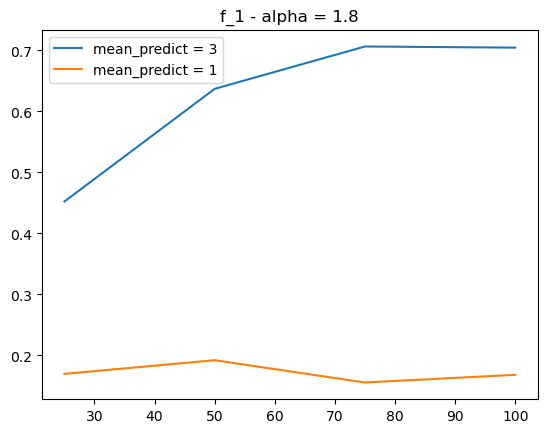

In [ ]:
display(data_eval, 'alpha', 'mean_predict', 'f_1')

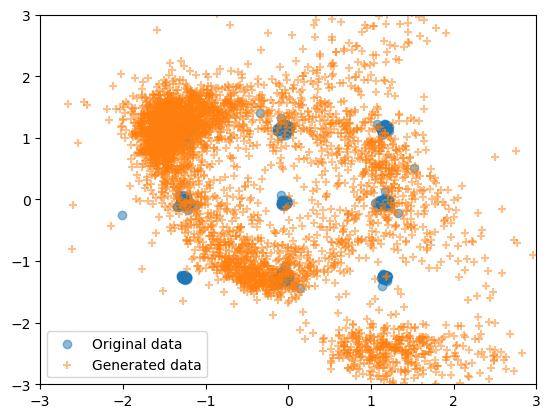

In [ ]:
lims = 3
mean_predict = 1 # Previous mean loss
gen_model = generate_samples(data_models, (data_models['mean_predict'] == mean_predict), num_samples=5000, eta=1.)
gen_model.get_plot(xlim = (-lims, lims), ylim = (-lims, lims))

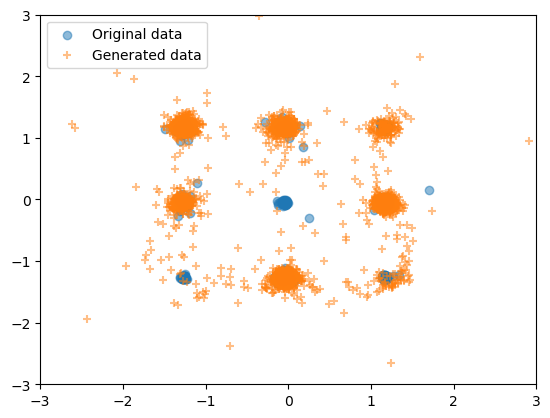

In [ ]:
lims = 3
mean_predict = 3 # Previous mean loss
gen_model = generate_samples(data_models, (data_models['mean_predict'] == mean_predict), num_samples=5000, eta=1.)
gen_model.get_plot(xlim = (-lims, lims), ylim = (-lims, lims))

## Loss for the batch: mean or median

For each element of the input batch we get a loss $l_i$. 

We can either take their $\texttt{mean}$
or their $\texttt{median}$, to stabilize training.

In [ ]:
data_eval, data_losses, data_models = load_dataframe('models/loss_batch/sas_grid')

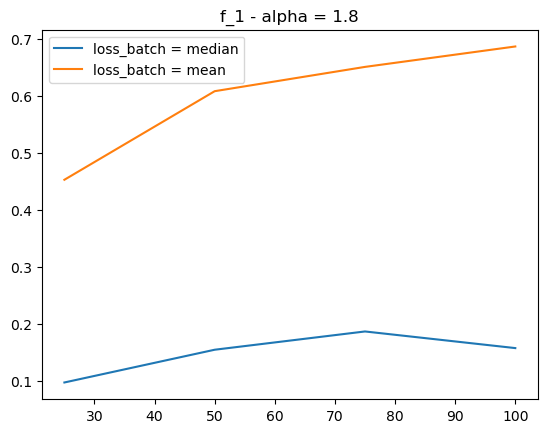

In [ ]:
display(data_eval, 'alpha', 'loss_batch', 'f_1')

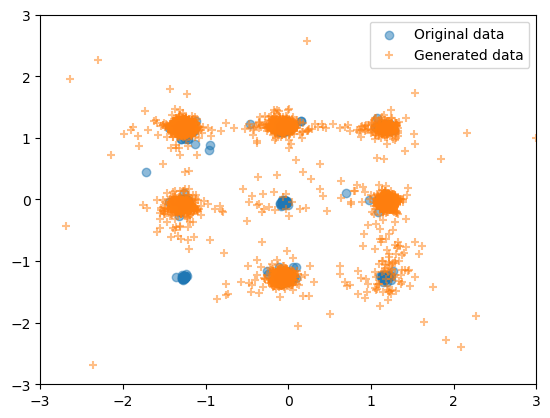

In [ ]:
lims = 3
loss_batch = 'mean' # Previous mean loss
gen_model = generate_samples(data_models, (data_models['loss_batch'] == loss_batch), num_samples=5000, eta=1.)
gen_model.get_plot(xlim = (-lims, lims), ylim = (-lims, lims))

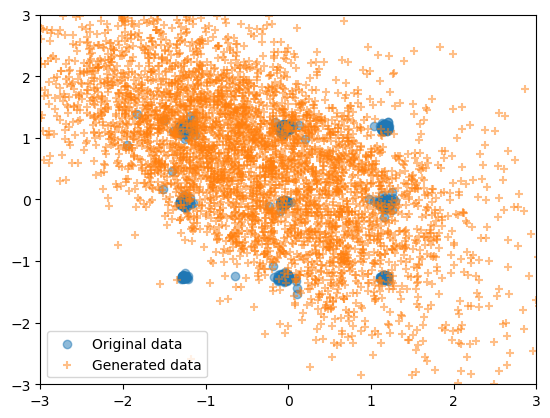

In [ ]:
lims = 3
loss_batch = 'median' # Previous mean loss
gen_model = generate_samples(data_models, (data_models['loss_batch'] == loss_batch), num_samples=5000, eta=1.)
gen_model.get_plot(xlim = (-lims, lims), ylim = (-lims, lims))

## LIM vs Levy (ours)

In [ ]:
data_eval, data_losses, data_models = load_dataframe('models/lim_vs_levy_fixed/sas_grid')

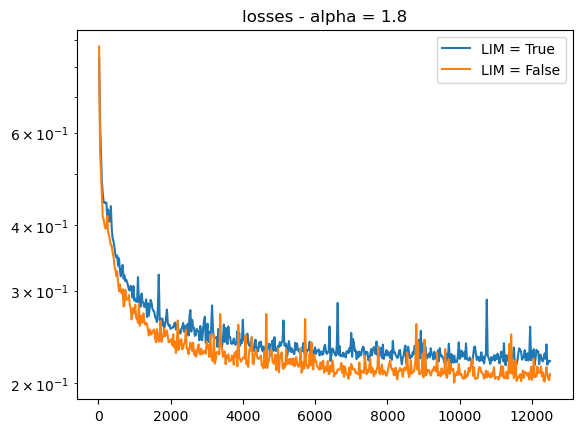

In [ ]:
display(data_losses, 'alpha', 'LIM', 'losses', log_scale=True)

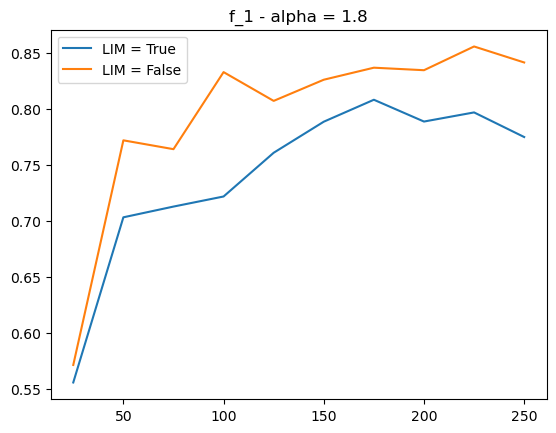

In [ ]:
display(data_eval, 'alpha', 'LIM', 'f_1', log_scale=False)

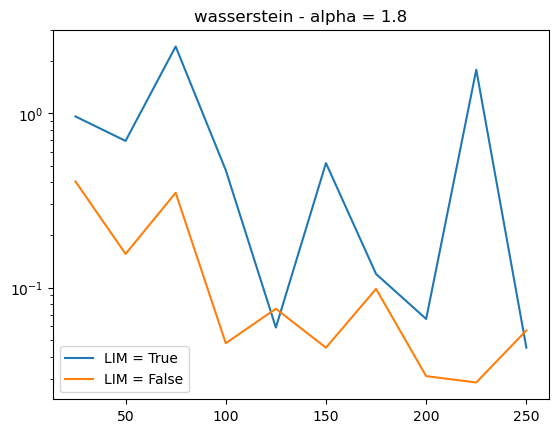

In [ ]:
display(data_eval, 'alpha', 'LIM', 'wasserstein', log_scale=True)

100%|███████████████████████████████████████████| 60/60 [00:00<00:00, 87.74it/s]


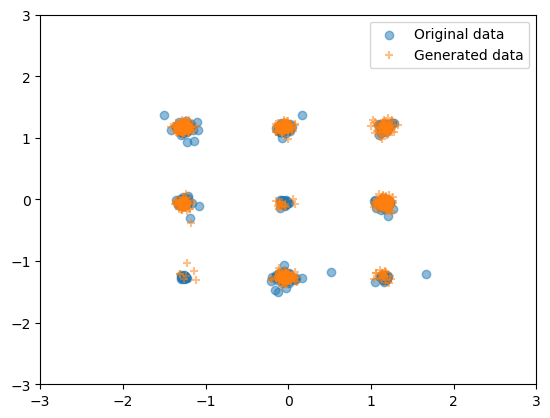

In [ ]:
lims = 3
LIM = True
gen_model = generate_samples(data_models, 
                             (data_models['LIM'] == LIM), 
                             num_samples=1000, 
                             eta=1.)
gen_model.get_plot(xlim = (-lims, lims), ylim = (-lims, lims))

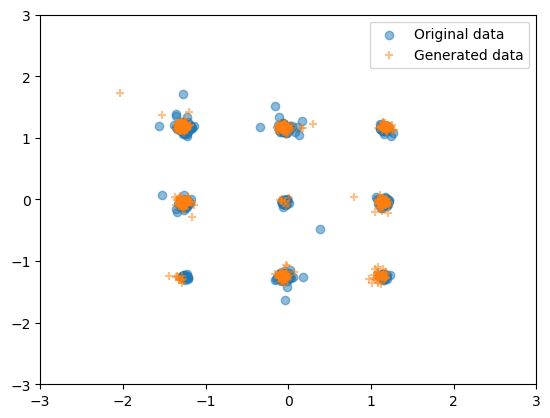

In [ ]:
lims = 3
LIM = False
gen_model = generate_samples(data_models, 
                             (data_models['LIM'] == LIM), 
                             num_samples=1000, 
                             eta=1.)
gen_model.get_plot(xlim = (-lims, lims), ylim = (-lims, lims))